# **PC3236 - Computational Methods in Physics**


# **Finite Differential Analysis for Solving Heat Diffusion in a 2D-System**

In [1]:
# import relevant libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import time
import warnings
warnings.filterwarnings("ignore")

## **1. Project Background**

Due to the rapid advancement of technology, heat conduction has become the fundamental process that occurs in diverse engineering applications such as materials science, biomedical engineering, and thermal sciences. Using the existence of 2D heat conduction equations, we could better understand how the heat transfers within the solid materials via steady-state or non-steady-state phenomenon via modeling to gain valuable insights about the temperature profiles and thermal behavior under the different boundary conditions. 

As the finite difference method is a popular approach in solving numerical applications, this project will explore using the central finite difference method that integrates with several iterative solvers such as Jacobi, Gauss-Seidel, and Successive-Over-Relaxation (SOR), to solve the 2D heat diffusion equation and also comparing their accuracy and computational efficiency. The correctness of the solutions will be assessed by grid refinement studies and stability studies, particularly for explicit method.

---

## **2. Equations to be Solved**

### **2.1 Steady-State Heat Diffusion in a 2D system**

The temperature distribution is constant through the time within the materials and the mathematical expression for the 2D steady state heat diffusion can be expressed as: 

$$\frac{\partial^{2} T}{\partial x^{2}} + \frac{\partial^{2} T}{\partial y^{2}} = 0$$

The second-order differential equations for space (x and y) can be solved by using the central finite difference which can be expressed as: 

$$\frac{\partial^{2} T}{\partial x^{2}} \approx \frac{T_{i-1, j} - 2T_{i, j} + T_{i+1, j}}{\triangle x^{2}}; \frac{\partial^{2} T}{\partial y^{2}} \approx \frac{T_{i, j-1} - 2T_{i, j} + T_{i, j+1}}{\triangle y^{2}}$$

By substituting the above central finite difference expression into the 2D steady state heat equation which can be expressed as: 
$$(\frac{T_{i-1, j} - 2T_{i, j} + T_{i+1, j}}{\triangle x^{2}}) + (\frac{T_{i, j-1} - 2T_{i, j} + T_{i, j+1}}{\triangle y^{2}}) = 0$$

By further modifiying the above expression: 
$$T_{i, j} = (\frac{1}{k}) (\frac{T_{i+1, j} + T_{i-1, j}}{\triangle x^2} + \frac{T_{i, j+1} + T_{i, j-1}}{\triangle y^2})$$

where:

$$k = 2 (\frac{\triangle x^2 + \triangle y^2}{\triangle x^2 \times \triangle y^2})$$


#### **2.1.1 Jacobi-Method**

Using the Jacobi method, the steady-state heat diffusion in a 2D system can be expressed as: 

$$T_{i, j}^{(n+1)} = (\frac{1}{k}) (\frac{T_{i+1, j}^{(n)} + T_{i-1, j}^{(n)}}{\triangle x^2} + \frac{T_{i, j+1}^{(n)} + T_{i, j-1}^{(n)}}{\triangle y^2})$$

where:

$$k = 2 (\frac{\triangle x^2 + \triangle y^2}{\triangle x^2 \times \triangle y^2})$$

#### **2.1.2 Gauss-Seidel Method**

Using the Gauss-Seidel method, the steady-state heat diffusion in a 2D system can be expressed as: 

$$T_{i, j}^{(n+1)} = (\frac{1}{k}) (\frac{T_{i+1, j}^{(n)} + T_{i-1, j}^{(n+1)}}{\triangle x^2} + \frac{T_{i, j+1}^{(n)} + T_{i, j-1}^{(n+1)}}{\triangle y^2})$$

where:

$$k = 2 (\frac{\triangle x^2 + \triangle y^2}{\triangle x^2 \times \triangle y^2})$$

#### **2.1.3 Successive Over Relaxation Method**

Using the Successive Over Relaxation method, the steady-state heat diffusion in a 2D system can be expressed as:

$$T_{i, j}^{(n+1)} = [(1- \omega) * T_{i, j}^{(n)}][\omega \times (\frac{1}{k}) (\frac{T_{i+1, j}^{(n)} + T_{i-1, j}^{(n+1)}}{\triangle x^2} + \frac{T_{i, j+1}^{(n)} + T_{i, j-1}^{(n+1)}}{\triangle y^2})]$$

where:

$$k = 2 (\frac{\triangle x^2 + \triangle y^2}{\triangle x^2 \times \triangle y^2})$$

---

### **2.2 Unsteady-State 2D Heat Diffusion (Explicit)**

The **explicit method** computes the temperature of a system the next time based on the temperature values from the current time. 

The temperature distribution is changing through the time within the materials and the mathematical expression for the 2D unsteady state heat diffusion (explicit) can be expressed as: 

$$\frac{\partial T}{\partial t} = \alpha (\frac{\partial^{2} T}{\partial x^{2}} + \frac{\partial^{2} T}{\partial y^{2}})$$

NOTE: $ \alpha $ is the thermal diffusivity

The second-order differential equations for time (t) and space (x and y) can be solved by using the central finite difference which can be expressed as: 

$$\frac{\partial T}{\partial t} = \frac{T_{i, j}^{n+1} - T_{i, j}^{n}}{\triangle t}; \frac{\partial^{2} T}{\partial x^{2}} \approx \frac{T_{i-1, j} - 2T_{i, j} + T_{i+1, j}}{\triangle x^{2}}; \frac{\partial^{2} T}{\partial y^{2}} \approx \frac{T_{i, j-1} - 2T_{i, j} + T_{i, j+1}}{\triangle y^{2}}$$

By substituting the above central finite difference expression into the 2D non-steady state heat equation which can be expressed as: 
$$T_{i, j}^{n+1} - T_{i, j}^{n} = \alpha \triangle t(\frac{T_{i-1, j} - 2T_{i, j} + T_{i+1, j}}{\triangle x^{2}} + \frac{T_{i, j-1} - 2T_{i, j} + T_{i, j+1}}{\triangle y^{2}})^{n}$$

By further modifying the above equations: 
$$T_{i, j}^{n+1} = T_{i, j}^{n} + k1 (T_{i-1, j} - 2T_{i, j} + T_{i+1, j})^{n} + k2(T_{i, j-1} - 2T_{i, j} + T_{i, j+1})^{n}$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.2.1 Jacobi-Method**

Under the Jacobi-method, the unsteady-state heat diffusion (explicit) in a 2D system can be expressed as: 

$$T_{i, j}^{(n+1)} = T_{i, j}^{(n)} + k1 (T_{i-1, j}^{(n)} - 2T_{i, j}^{(n)} + T_{i+1, j}^{(n)}) + k2(T_{i, j-1}^{(n)} - 2T_{i, j}^{(n)} + T_{i, j+1}^{(n)})$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.2.2 Gauss-Seidel Method**

Under the Gauss-Seidel method, the unsteady-state heat diffusion (explicit) in a 2D system can be expressed as: 

$$T_{i, j}^{(n+1)} = T_{i, j}^{(n)} + k1 (T_{i-1, j}^{(n+1)} - 2T_{i, j}^{(n)} + T_{i+1, j}^{(n)}) + k2(T_{i, j-1}^{(n+1)} - 2T_{i, j}^{(n)} + T_{i, j+1}^{(n)})$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.2.3 Successive Over Relaxation Method**

Under the Successive Over Relaxation method, the unsteady-state heat diffusion (explicit) in a 2D system can be expressed as: 

$$T_{i, j}^{(n+1)} = [(1- \omega) T_{i, j}^{(n)}]+ \omega [T_{i, j}^{(n)} + k1 (T_{i-1, j}^{(n+1)} - 2T_{i, j}^{(n)} + T_{i+1, j}^{(n)}) + k2(T_{i, j-1}^{(n+1)} - 2T_{i, j}^{(n)} + T_{i, j+1}^{(n)})]$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.2.4 Courant-Friedrichs-Lewy Condition**

The convergence condition by Courant-Friedrichs-Lewy condition is a necessary condition for convergence, particularly for explicit method.

In the 2D heat diffusion, the CFL condition becomes 

$$C = \frac{\alpha \triangle t}{\triangle x} + \frac{\alpha \triangle t}{\triangle y} \le C_{max}$$

where the dimensionaless number $C$ is the Courant number, 
- $\alpha$ is the thermal diffusivity 
- $\triangle t$ is the time step 
- $\triangle x$ and $\triangle y$  is th length interval.

To derive the Courant number (max) for 2D heat diffusion, we set the error term in the form: 

$$\epsilon_{j, k}^{n} = \xi^{n}e^{i \beta_{m} j \triangle x} e^{i n_{p} k \triangle y}$$

where $\epsilon = e^{\gamma \triangle t}$ and $i = \sqrt(-1)\beta_{m}$ and $n_{p}$ are the Fourier modes. 

In view of the definition of $\epsilon$, the error term $\epsilon_{j, k}^{n}$ will not increase without bounds as $t$ increases, provided that 

$$|\epsilon| \le 1$$

The error term should satisfy the explicit finite difference equation and therefore the above equation is substituted into the explicit finite difference equation and after cancellations:

$$\epsilon = 1 + k1(e^{-i\beta_{m} \triangle x} + e^{i\beta_{m} \triangle x} - 2) + k1(e^{-i n_{p} \triangle y} + e^{i n_{p} \triangle y} - 2)$$

which can be written as:

$$\epsilon = 1 - 2k1(1 - cos \beta_{m} \triangle x) - 2k2(1 - cos n_{p} \triangle y)$$

since $cos z = \frac{1}{2}(e^{-iz} + e^{iz})$

By using the above equations, it yields the application of stability criterion: 

$$-1 \le [1 - 2k1(1 - cos \beta_{m} \triangle x) - 2k2(1 - cos n_{p} \triangle y)] \le 1$$

which must be satisfied for all values of $\beta_{m}$ and $n_{p}$. The RHS is always satisfied. 

To satisfy the LHS, use $1 - cos\beta_{m} \triangle x = 2$ and $1 - cos n_{p} \triangle y = 2$ which yields 

$$-1 \le [1 - 4k1 - 4k2]$$

that is, 

$$(k1 + k2) \le \frac{1}{2}$$

Since $\triangle x$ and $\triangle y$ = $\delta$, then the finalized stability criterion becomes 

$$\frac{\alpha \triangle t}{\delta} \le \frac{1}{4}$$

where $C_{max} = 1/4$

---

### **2.3 Unsteady-State 2D Heat Diffusion (Implicit)**

The **implicit method** computes the temperature of a system the next time step based on the temperature values from the current time and the future time.

Similar in sub-section 2.2, the temperature distribution is changing through the time within the materials and the mathematical expression for the 2D unsteady state heat diffusion based on central finite difference method can be expressed as:



$$\frac{\partial T}{\partial t} = \alpha (\frac{\partial^{2} T}{\partial x^{2}} + \frac{\partial^{2} T}{\partial y^{2}})$$

NOTE: $ \alpha $ is the thermal diffusivity

The second-order differential equations for time (t) and space (x and y) can be solved by using the central finite difference which can be expressed as: 

$$\frac{\partial T}{\partial t} = \frac{T_{i, j}^{n+1} - T_{i, j}^{n}}{\triangle t}; \frac{\partial^{2} T}{\partial x^{2}} \approx \frac{T_{i-1, j} - 2T_{i, j} + T_{i+1, j}}{\triangle x^{2}}; \frac{\partial^{2} T}{\partial y^{2}} \approx \frac{T_{i, j-1} - 2T_{i, j} + T_{i, j+1}}{\triangle y^{2}}$$

By substituting the above central finite difference expression into the 2D non-steady state heat equation which can be expressed as: 
$$T_{i, j}^{n+1} - T_{i, j}^{n} = \alpha \triangle t(\frac{T_{i-1, j} - 2T_{i, j} + T_{i+1, j}}{\triangle x^{2}} + \frac{T_{i, j-1} - 2T_{i, j} + T_{i, j+1}}{\triangle y^{2}})^{n+1}$$

By further modifying, 


$$T_{i, j}^{n+1} = (\frac{1}{1 + 2k1 + 2k2})[T_{i, j}^{n} + k1 (T_{i-1, j} + T_{i+1, j})^{n+1} + k2(T_{i, j-1} + T_{i, j+1})^{n+1}]$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.3.1 Jacobi-Method**

Under the Jacobi method, the unsteady-state heat diffusion (implicit) in a 2D system can be expressed as:

$$T_{i, j}^{(n+1)} = (\frac{1}{1 + 2k1 + 2k2})[T_{i, j}^{(n-1)} + k1 (T_{i-1, j}^{(n)} + T_{i+1, j}^{(n)}) + k2(T_{i, j-1}^{(n)} + T_{i, j+1}^{(n)})]$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.3.2 Gauss-Seidel Method**

Under the Gauss-Seidel method, the unsteady-state heat diffusion (implicit) in a 2D system can be expressed as:

$$T_{i, j}^{(n+1)} = (\frac{1}{1 + 2k1 + 2k2})[T_{i, j}^{(n-1)} + k1 (T_{i-1, j}^{(n+1)} + T_{i+1, j}^{(n)}) + k2(T_{i, j-1}^{(n+1)} + T_{i, j+1}^{(n)})]$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


#### **2.3.3 Successive Over Relaxation Method**

Under the Successive Over Relaxation method, the unsteady-state heat diffusion (implicit) in a 2D system can be expressed as: 

$$T_{i, j}^{(n+1)} = [(1- \omega)(T_{i, j}^{(n)})][\omega * (T_{i, j}^{(n-1)} + k1 (T_{i-1, j}^{(n+1)} + T_{i+1, j}^{(n)}) + k2(T_{i, j-1}^{(n+1)} + T_{i, j+1}^{(n)})]]$$

where:

$$k1 = \alpha(\frac{\triangle t}{\triangle x^2})$$
$$k2 = \alpha(\frac{\triangle t}{\triangle y^2})$$


---

## **3. Computational Methodology and Implementation**

### **3.1 Computational Approach**

In general, the computational approach to solve the heat diffusion in a 2D system can be described below:

1) The partial second-order derivatives for the steady-state and non-steady-state 2D heat equation illustrated in section 2 are replaced with finite difference approximations.  

2) The temperature boundary conditions were also defined based on the Dirichlet boundary condition (i.e., the fixed boundary condition) for the grid domain. The time and spatial domains were explicitly defined. 

3) The three iterative solvers such as Jacobi, gauss-seidel, and successive-over-relaxation were initiated to solve the 2D heat diffusion by updating the grid temperature field until convergence. The number of iterations, computation time, and absolute error values were recorded for analysis at the subsequent stage. 

4) Contour plots were generated to visualize the temperature distribution across the grid domain and include annotations for the number of iterations and computional time. 

5) The process above was repeated with variations of parameters where applicable.

---

### **3.2 Implemented Algorithms**

The following **numerical algorithms** were implemented to solve the 2D heat diffusion and the respective numerical algorithms work throughout the same phenomenon for the steady-state and unsteady state (explicit and implicit):

- **Jacobi method**: It updates the grid temperature at each grid point based on the grid temperature in the previous iteration. The process iterates until it converges. This means that the computation of $x_{i}^{(n+1)}$ requires each element in $x^{(n)}$ itself. 

- **Gauss-Seidel method**: It updates the grid temperature at each grid point as soon as it is computed. This means that the computation of $x^{(n+1)}$ uses the elements of $x^{(n+1)}$ that have already been computed and only the elements  of $x^{(n)}$ that have not been computed in the $(n+1)$ iteration. 

- **Successive-Over-Relaxation method**: This is an improved version of the Gauss-Seidel method that introduces the relaxation factor to increase the convergence speed.



#### **3.2.1 Steady-State Heat Diffusion in a 2D system**

##### **(a) Jacobi Iterative Method**

In [2]:
def jacobi_iter_steady_state(top, bottom,left, right, nx, ny, dx, dy, k, error, tol):
    # initialize the start time 
    start_time = time.time()
    
    # initialize the counter 
    iter_counter = 1

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old = grid_temp.copy()
    
    # perform jacobi iteration 
    while True:
        for row in range(1, nx - 1):
            for col in range(1, ny - 1):
                grid_temp[row, col] = (((grid_temp_old[row+1, col] + grid_temp_old[row-1, col]) / (dx**2)) + \
                                       ((grid_temp_old[row, col+1] + grid_temp_old[row, col-1])/ (dy**2)))/k

        # evaluate error  
        error = np.max(np.abs(grid_temp_old - grid_temp))/ np.max(np.abs(grid_temp))
        
        if error < tol:
            break 

        # update the old values into the grid temp matrix 
        grid_temp_old = grid_temp.copy()

        # incrementation counter
        iter_counter += 1 
    
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, iter_counter, elapsed_time, error

##### **(b) Gauss-Seidel Iterative Method**

In [3]:
def gauss_seidel_iter_steady_state(top, bottom, left, right, nx, ny, dx, dy, k, error, tol):
    # initialize the start time 
    start_time = time.time()
    
    # initialize the counter 
    iter_counter = 1

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old = grid_temp.copy()
    
    # perform gauss-seidel iteration 
    while True:
        for row in range(1, nx - 1):
            for col in range(1, ny - 1):
                grid_temp[row, col] = (((grid_temp_old[row+1, col] + grid_temp[row-1, col]) / (dx**2)) + \
                                        ((grid_temp_old[row, col+1] + grid_temp[row, col-1])/ (dy**2)))/k

        # evaluate error  
        error = np.max(np.abs(grid_temp_old - grid_temp))/ np.max(np.abs(grid_temp))

        if error < tol:
            break

        # update the old values into the grid temp matrix 
        grid_temp_old = grid_temp.copy()

        # incrementation counter
        iter_counter += 1 
    
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, iter_counter, elapsed_time, error

##### **(c) Successive Over Relaxation (SOR) Method**

In [4]:
def sor_iter_steady_state(top, bottom, left, right, nx, ny, dx, dy, k, error, tol, omega):
    # initialize the start time 
    start_time = time.time()
    
    # initialize the counter 
    iter_counter = 1

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old = grid_temp.copy()
    
    # perform SOR iteration 
    while True:
        for row in range(1, nx - 1):
            for col in range(1, ny - 1):
                grid_temp[row, col] = ((1 - omega)*grid_temp_old[row, col]) + \
                    (omega * (((grid_temp_old[row+1, col] + grid_temp[row-1, col]) / (dx**2)) + \
                              ((grid_temp_old[row, col+1] + grid_temp[row, col-1])/ (dy**2)))/ k)

        # evaluate error  
        error = np.max(np.abs(grid_temp_old - grid_temp))/ np.max(np.abs(grid_temp))

        if error < tol:
            break

        # update the old values into the grid temp matrix 
        grid_temp_old = grid_temp.copy()

        # incrementation counter
        iter_counter += 1 
    
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, iter_counter, elapsed_time, error

---

#### **3.2.2 Unsteady-State Heat Diffusion in a 2D system (Explicit)**

##### **(a) Jacobi Iterative Method**

In [5]:
def jacobi_iter_explicit(top, bottom,left, right, nx, ny, time_step_iter, k1, k2):
    # initialize the start time 
    start_time = time.time()

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old = grid_temp.copy()
    
    # compute using jacobi scheme 
    for _ in range(time_step_iter):
        for row in range(1, nx - 1):
            for col in range(1, ny - 1):
                grid_temp[row, col] = (grid_temp_old[row, col] * (1 - (2*k1) - (2*k2))) +\
                      (k1 * (grid_temp_old[row-1, col] + grid_temp_old[row+1, col])) + \
                        (k2 * (grid_temp_old[row, col-1] + grid_temp_old[row, col+1]))
                
        # update the old values in the grid temp matrix 
        grid_temp_old = grid_temp.copy()
    
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, elapsed_time

##### **(b) Gauss-Seidel Iterative Method**

In [6]:
def gauss_seidel_iter_explicit(top, bottom,left, right, nx, ny, time_step_iter, k1, k2):
    # initialize the start time 
    start_time = time.time()

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old = grid_temp.copy()
    
    # compute using gauss seidel scheme 
    for _ in range(time_step_iter):
        for row in range(1, nx - 1):
            for col in range(1, ny - 1):
                grid_temp[row, col] = (grid_temp_old[row, col] * (1 - (2*k1) - (2*k2))) +\
                      (k1 * (grid_temp[row-1, col] + grid_temp_old[row+1, col])) + \
                        (k2 * (grid_temp[row, col-1] + grid_temp_old[row, col+1]))
                
        # update the old values in the grid temp matrix 
        grid_temp_old = grid_temp.copy()
    
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, elapsed_time

##### **(c) Successive Over Relaxation (SOR) Method**

In [7]:
def SOR_iter_explicit(top, bottom,left, right, nx, ny, time_step_iter, k1, k2, omega):
    # initialize the start time 
    start_time = time.time()

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old = grid_temp.copy()
    
    # compute using SOR scheme 
    for _ in range(time_step_iter):
        for row in range(1, nx - 1):
            for col in range(1, ny - 1):
                grid_temp[row, col] = ((1-omega) * grid_temp_old[row, col]) + \
                    omega * ((grid_temp_old[row, col] * (1 - (2*k1) - (2*k2))) +\
                        (k1 * (grid_temp[row-1, col] + grid_temp_old[row+1, col])) + \
                            (k2 * (grid_temp[row, col-1] + grid_temp_old[row, col+1])))
                
        # update the old values into the grid temp matrix 
        grid_temp_old = grid_temp.copy()
    
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, elapsed_time

---

#### **3.2.3 Unsteady-State Heat Diffusion in a 2D system (Implicit)**

##### **(a) Jacobi Iterative Method**

In [8]:
def jacobi_iter_implicit(top, bottom,left, right, nx, ny, time_step_iter, k1, k2, error, tol):
    # initialize the start time 
    start_time = time.time()

    # initialize the counter 
    iter_counter = 1

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old, grid_temp_prev_dt = grid_temp.copy(), grid_temp.copy()
    
    # compute using jacobi scheme 
    for _ in range(time_step_iter):
        while True:
            for row in range(1, nx - 1):
                for col in range(1, ny - 1):
                    a = (1 + (2 * k1) + (2 * k2))**-1
                    b = k1 * a
                    c = k2 * a
                    d = grid_temp_old[row-1, col] + grid_temp_old[row+1, col]
                    e = grid_temp_old[row, col-1] + grid_temp_old[row, col+1]
                    grid_temp[row, col] = (grid_temp_prev_dt[row, col] * a) + (d * b) + (e * c)
            
            # evaluate error 
            error = np.max(np.abs(grid_temp - grid_temp_old))/ np.max(np.abs(grid_temp_old))

            if error < tol:
                break 

            # update the old values in the grid temp matrix 
            grid_temp_old = grid_temp.copy()

            # iteration counter
            iter_counter+=1
        
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, iter_counter, elapsed_time, error

##### **(b) Gauss-Seidel Iterative Method**

In [9]:
def gauss_seidel_iter_implicit(top, bottom,left, right, nx, ny, time_step_iter, k1, k2, error, tol):
    # initialize the start time 
    start_time = time.time()

    # initialize the counter 
    iter_counter = 1

    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old, grid_temp_prev_dt = grid_temp.copy(), grid_temp.copy()
    
    # compute using gauss-seidel scheme 
    for _ in range(time_step_iter):
        while True:
            for row in range(1, nx - 1):
                for col in range(1, ny - 1):
                    a = (1 + (2 * k1) + (2 * k2))**-1
                    b = k1 * a
                    c = k2 * a
                    d = grid_temp[row-1, col] + grid_temp_old[row+1, col]
                    e = grid_temp[row, col-1] + grid_temp_old[row, col+1]
                    grid_temp[row, col] = (grid_temp_prev_dt[row, col] * a) + (d * b) + (e * c)
            
            # evaluate error 
            error = np.max(np.abs(grid_temp - grid_temp_old))/ np.max(np.abs(grid_temp_old))

            if error < tol:
                break 

            # update the old values in the grid temp matrix 
            grid_temp_old = grid_temp.copy()

            # iteration counter 
            iter_counter+=1
        
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, iter_counter, elapsed_time, error

##### **(c) Successive Over Relaxation (SOR) Method**

In [10]:
def SOR_iter_implicit(top, bottom,left, right, nx, ny, time_step_iter, k1, k2, error, tol, omega):
    # initialize the start time 
    start_time = time.time()

    # initialize the counter 
    iter_counter = 1
    
    # setting the temperature boundaries
    grid_temp = np.ones((nx, ny))
    grid_temp[0, :], grid_temp[-1,: ], grid_temp[:, 0], grid_temp[:, -1] = top, bottom, left, right

    # store the old values 
    grid_temp_old, grid_temp_prev_dt = grid_temp.copy(), grid_temp.copy()
    
    # compute using SOR scheme 
    for _ in range(time_step_iter):
        while True:
            for row in range(1, nx - 1):
                for col in range(1, ny - 1):
                    a = (1 + (2 * k1) + (2 * k2))**-1
                    b = k1 * a
                    c = k2 * a
                    d = grid_temp[row-1, col] + grid_temp_old[row+1, col]
                    e = grid_temp[row, col-1] + grid_temp_old[row, col+1]
                    grid_temp[row, col] = ((1-omega) * grid_temp_old[row, col]) + (omega * ((grid_temp_prev_dt[row, col] * a) + (d * b) + (e * c)))
            
            # evaluate error 
            error = np.max(np.abs(grid_temp - grid_temp_old))/ np.max(np.abs(grid_temp_old))
            
            if error < tol:
                break 

            # update the old values in the grid temp matrix 
            grid_temp_old = grid_temp.copy()

            # iterative counter
            iter_counter+=1
        
    # get the end time 
    end_time = time.time()
    # compute the elapsed time 
    elapsed_time = end_time - start_time
    return grid_temp, iter_counter, elapsed_time, error

---

### **3.3 Challenges and Solutions**

Below are some of the challenges and solutions faced for this project: 

**Challenge 1:** Diverse iterative solvers tend to have different desired outcomes. 

- **Solution:** Compare the differences between the Jacobi, Gauss-Seidel, and Successive-Over-Relaxation methods based on their iteration counts, error tolerance, and computational time. 

**Challenge 2:** Iterative solvers like Jacobi and Gauss-Seidel tend to have slow convergence, especially for larger grids like 100m in both x and y directions, which makes the computational unnecessary longer. 

- **Solution:** It is their natural characteristics. Use the successive-over-relaxation method which is stable for larger time steps. 

**Challenge 3:** The explicit method to solve the 2D heat equation requires a very small time step as compared to the implicit method. 

- **Solution:** Experiment with diverse range of time step required for explicit method. (See section 3.5 - Testing for Correctness under the Stability Analysis)

**Challenge 4:** Smaller grid sizes (or the number of grid points) tend to produce very poor resolution based on the contour plot. 

- **Solution:** Experiment grid refinement analysis to determine the suitable grid sizes. (See section 3.5 - Testing for Correctness under the Grid Refinement Analysis).

**Challenge 5:** Larger grid sizes (or the number of grid points) tend to have longer computational time and increments of iterative counts. 

- **Solution:** Experiment grid refinement analysis to determine the suitable grid sizes. (See section 3.5 - Testing for Correctness under the Grid-Refinement Analysis).

**Challenge 6:** Different thermal diffusivity values affect the stability of the explicit method. 

- **Solution:** Experiment with diverse range of thermal diffusivity required for explicit method. (See section 3.5 - Testing for Correctness under the Stability Analysis).



---

### **3.4 Interesting Aspects of the Algorithms and Implementation**

**Interesting Aspect 1:** Various iterative solvers - Jacobi, Gauss-Seidel, and SOR converge at different rates. 

**Interesting Aspect 2:** Both explicit and implicit methods have different approaches to solving the 2D heat equation as explicit methods require a very small time step whereas the implicit methods require a very large time step. 

**Interesting Aspect 3:** Different grid sizes has effects on the convergence rates. 

**Interesting Aspect 4:** Evaluated the solver's performance based on the iteration count and computational time. 

**Interesting Aspect 5:** Developed contour plots to visualize the temperature distribution across the materials. 

---

### **3.5 Testing for Correctness**

#### **3.5.1 Grid Refinement Analysis**

The objective of grid refinement analysis is to investigate how the solution changes in terms of computational time, iteration counts, and the relative errors that correspond to the grid size refinement (i.e. increases the number of grid points). In this way, we could ensure the truthfulness of the numerical solutions and the stability and reliability of the numerical models developed. It explores how the different grid sizes, starting from (10, 10) to (80, 80), affect the overall convergence performance in a 2D heat diffusion system while keeping the rest of the parameters constants.

In [11]:
# define the possible grid sizes for refinement analysis 
grid_size = ((10, 10), (20, 20), (30, 30), (40, 40), (50, 50), (60, 60), (70, 70), (80, 80))

In [12]:
def display_contour_plot_grid_refinement(x, y, grid_sizes, grid_temp, title, iter_counter, elapsed_time):
    plt.figure(figsize=(8, 6))
    contours = plt.contourf(x, y, grid_temp.T, 10, cmap='jet')
    plt.clabel(contours, inline = True, fontsize = 8, colors = 'black')
    plt.colorbar()
    plt.title("{}\n Grid-Sizes: {}\n Iteration: {}\n Time: {} seconds".format(title, grid_sizes, iter_counter, elapsed_time))
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.gca().invert_yaxis()
    plt.show()

---

##### **3.5.1.1: Steady-State 2D Heat Diffusion**

In [13]:
x, y = [], []
grid_temp_jacobi_ss, iter_count_jacobi_ss, elapsed_time_jacobi_ss, error_jacobi_ss = [], [], [], []
grid_temp_gauss_ss, iter_count_gauss_ss, elapsed_time_gauss_ss, error_gauss_ss = [], [], [], []
grid_temp_sor_ss, iter_count_sor_ss, elapsed_time_sor_ss, error_sor_ss = [], [], [], []

# iterate for respective grid size 
for nx_new, ny_new in grid_size:
    l = 1

    # number of grid spacing in x and y direction 
    x_new = np.linspace(0, l, nx_new)
    y_new = np.linspace(0, l, ny_new)

    # change of length in each grid point in x and y direction 
    dx_new = x_new[1] - x_new[0]
    dy_new = y_new[1] - y_new[0]

    # thermal diffusivity 
    k = 2 * ((dx_new**2 + dy_new**2)/ (dx_new**2 * dy_new**2))

    # omega for SOR 
    omega = 1.5

    # initialize the error and tolerance 
    error = float('inf')
    tol = 1e-6

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    ######### Steady State #########
    # call the function to compute the jacobi iterative scheme 
    T_jacobi_new, jacobi_iter_new, jacobi_elapsed_time_new, jacobi_error_new = jacobi_iter_steady_state(top, bottom, left, right, nx_new, ny_new, dx_new, dy_new, k, error, tol)
    # call the function to compute the gauss iterative scheme 
    T_gauss_new, gauss_iter_new, gauss_elapsed_time_new, gauss_error_new = gauss_seidel_iter_steady_state(top, bottom, left, right, nx_new, ny_new, dx_new, dy_new, k, error, tol)
    # call the function to compute the SOR iterative scheme 
    T_sor_new, sor_iter_new, sor_elapsed_time_new, sor_error_new = sor_iter_steady_state(top, bottom, left, right, nx_new, ny_new, dx_new, dy_new, k, error, tol, omega)
    
    grid_temp_jacobi_ss.append(T_jacobi_new)
    iter_count_jacobi_ss.append(jacobi_iter_new)
    elapsed_time_jacobi_ss.append(jacobi_elapsed_time_new)
    error_jacobi_ss.append(jacobi_error_new)

    grid_temp_gauss_ss.append(T_gauss_new)
    iter_count_gauss_ss.append(gauss_iter_new)
    elapsed_time_gauss_ss.append(gauss_elapsed_time_new)
    error_gauss_ss.append(gauss_error_new)

    grid_temp_sor_ss.append(T_sor_new)
    iter_count_sor_ss.append(sor_iter_new)
    elapsed_time_sor_ss.append(sor_elapsed_time_new)
    error_sor_ss.append(sor_error_new)

    x.append(x_new)
    y.append(y_new)

iterative_count_ss = pd.DataFrame({"jacobi": iter_count_jacobi_ss, 
                        "gauss": iter_count_gauss_ss, 
                        "sor": iter_count_sor_ss})

elapsed_time_ss = pd.DataFrame({"jacobi": elapsed_time_jacobi_ss, 
                        "gauss": elapsed_time_gauss_ss, 
                        "sor": elapsed_time_sor_ss})

error_ss = pd.DataFrame({"jacobi": error_jacobi_ss, 
                        "gauss": error_gauss_ss, 
                        "sor": error_sor_ss})

<Figure size 1000x1000 with 0 Axes>

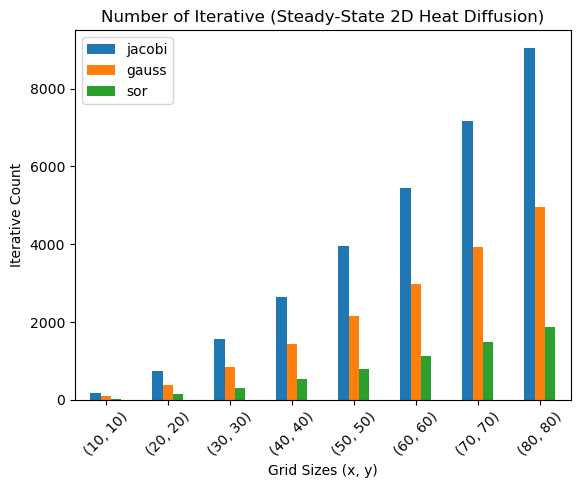

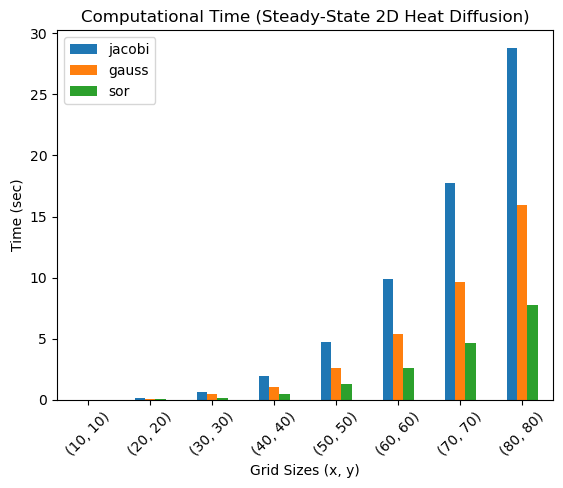

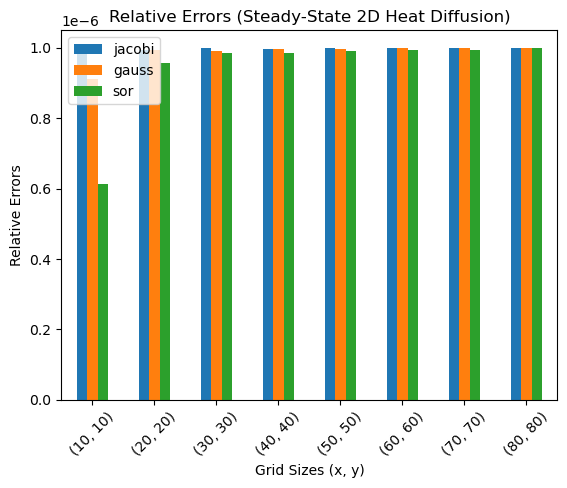

In [14]:
plt.figure(figsize = (10, 10))
iterative_count_ss.plot(kind = "bar")
plt.title("Number of Iterative (Steady-State 2D Heat Diffusion)")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Iterative Count")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)

elapsed_time_ss.plot(kind = "bar")
plt.title("Computational Time (Steady-State 2D Heat Diffusion)")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Time (sec)")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)

error_ss.plot(kind = "bar")
plt.title("Relative Errors (Steady-State 2D Heat Diffusion)")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Relative Errors")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)
plt.show()

Based on the plot shown above for the steady-state method, the relative errors remain consistent across the iterative solvers with different grid sizes. This indicates that the central finite differences with incorporating of the iterative solvers approach is consistent for this 2D steady state heat diffusion. So, with more grid points, the numerical solution converges to the true solution of this differential equation. 

Both computational time and the number of iterations are highly associated with each other and increase exponentially across the three iterative solvers with an increased number of grid sizes. It can be observed that the SOR is the most efficient solver that converges faster and with fewer iterations and lower computational time compared to Jacobi and Gauss. The least efficient is the Jacobi with higher iteration counts and higher computational time. Nevertheless, the Gauss-Seidel is in between the both iterative solvers.

The consistency of the convergence across the three iterative solvers with different grid sizes in steady state 2D heat equations are illustrated below in the form of contours plots. It is proven that the temeprature do not changes with the time for steady-state 2D heat diffusion. 

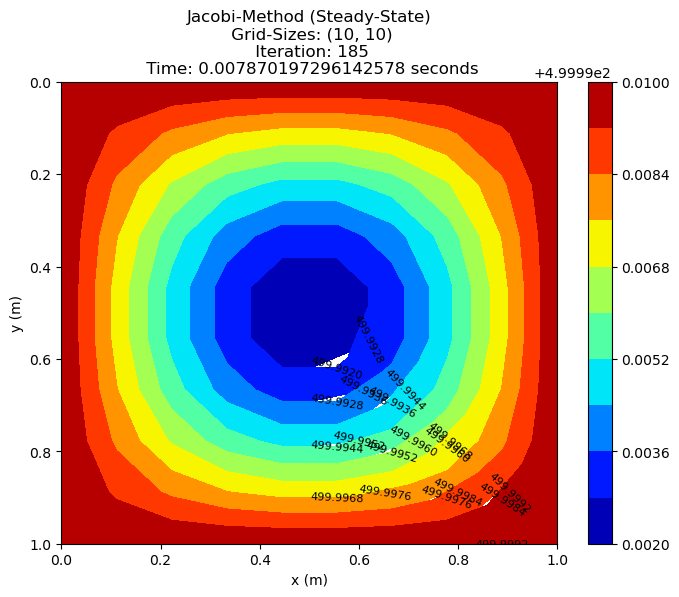

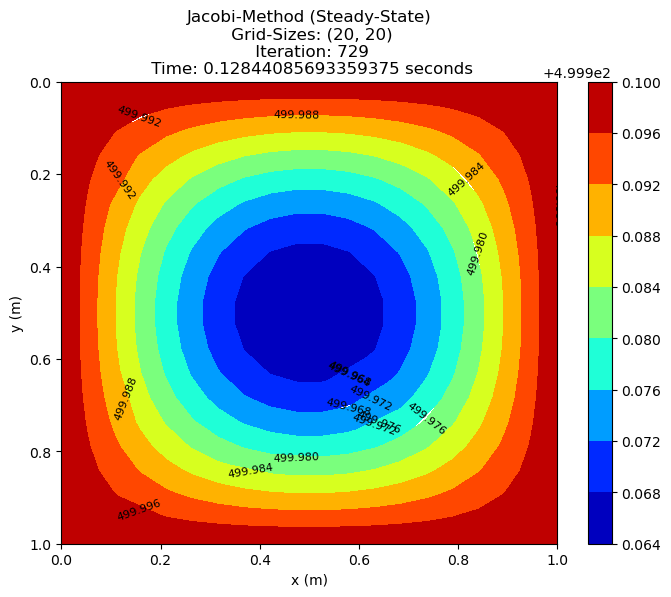

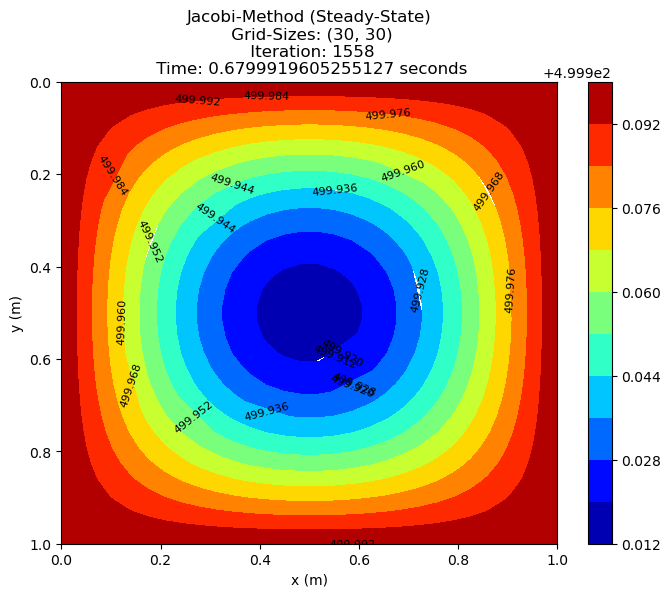

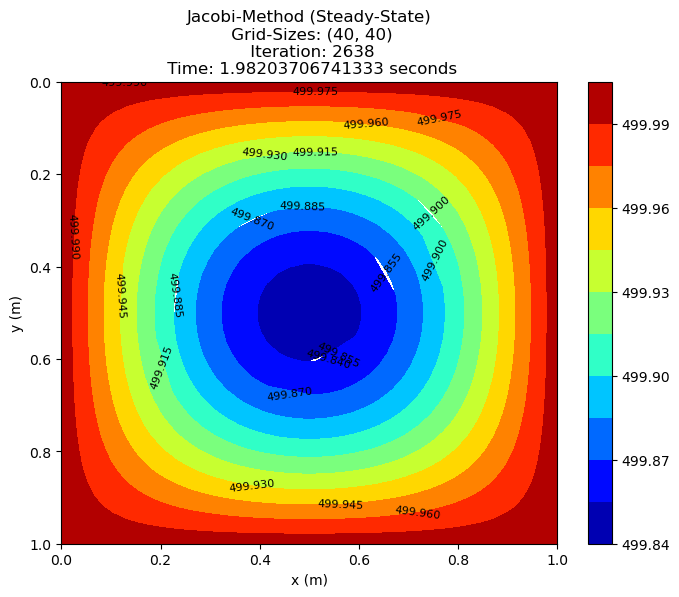

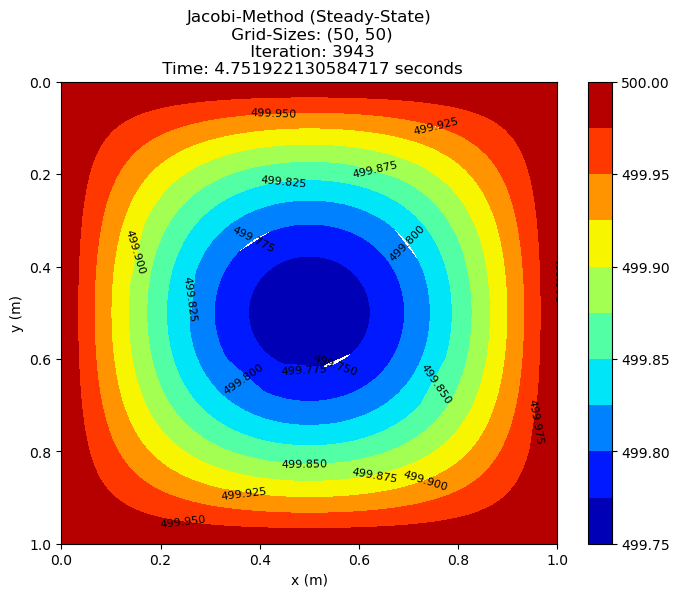

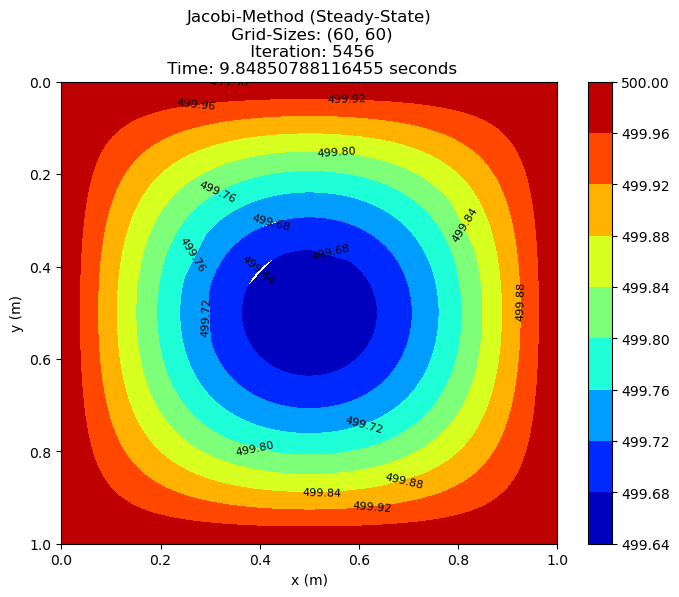

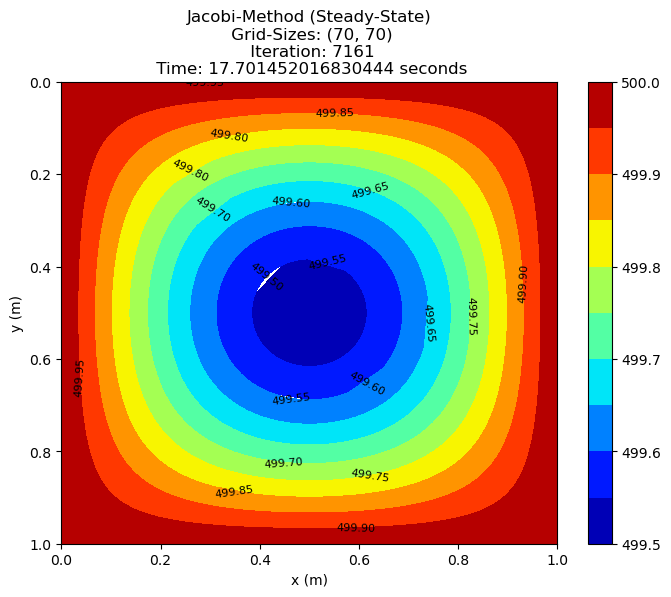

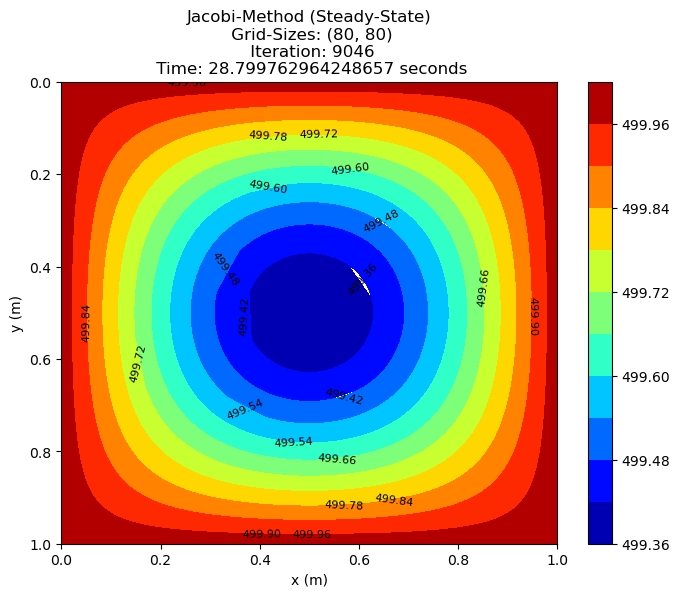

In [15]:
for i in range(len(grid_temp_jacobi_ss)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_jacobi_ss[i], "Jacobi-Method (Steady-State)", iter_count_jacobi_ss[i], elapsed_time_jacobi_ss[i])
    plt.show()

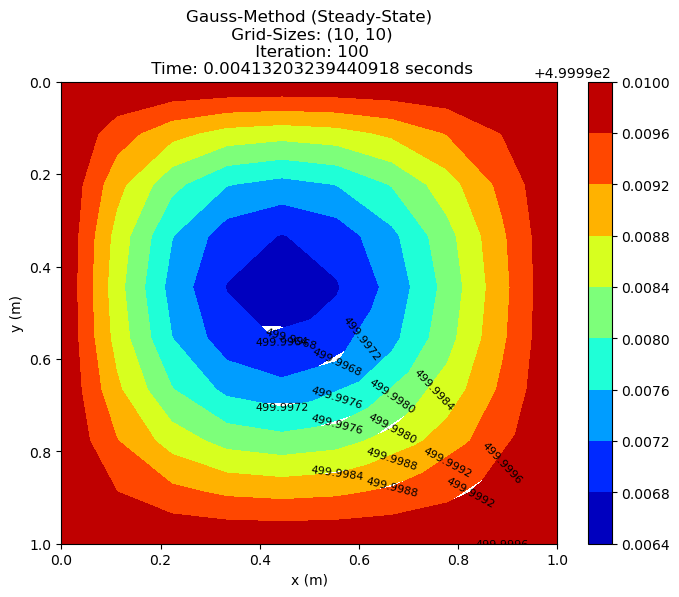

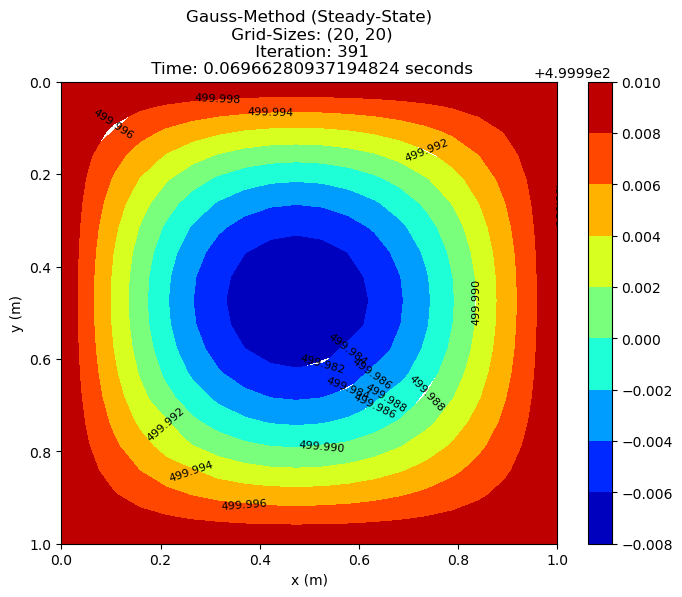

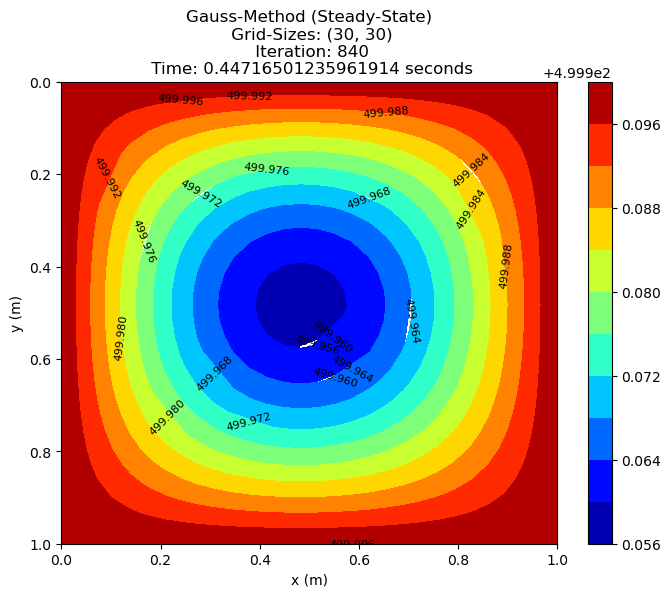

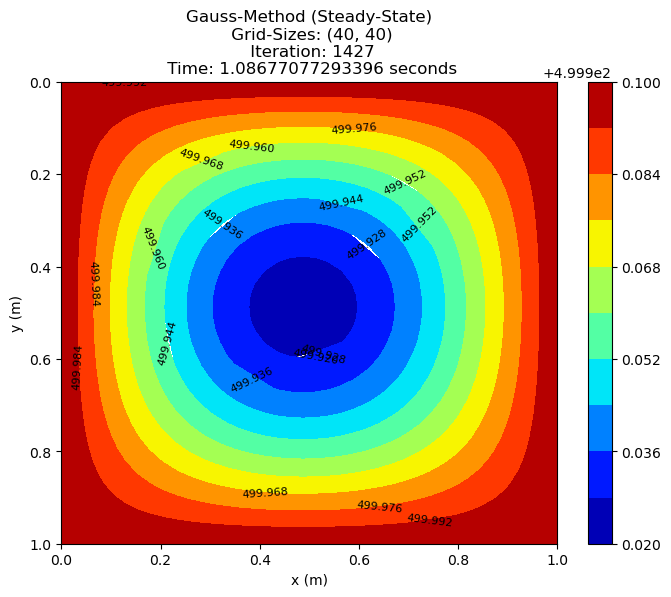

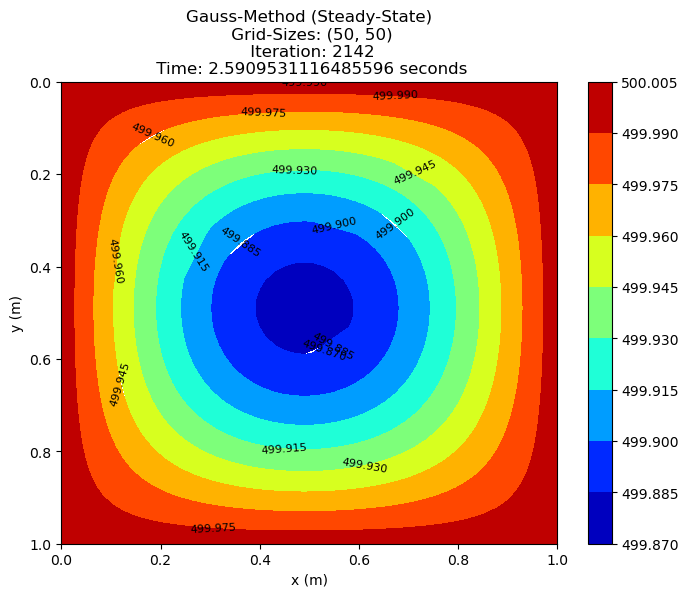

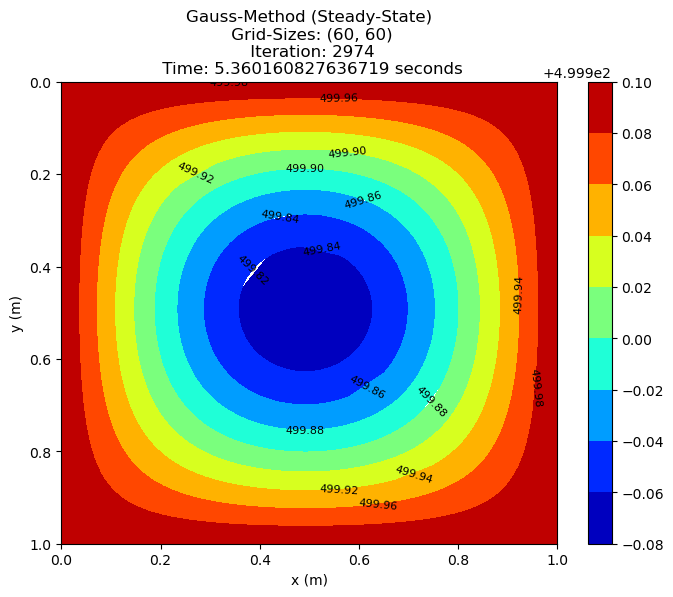

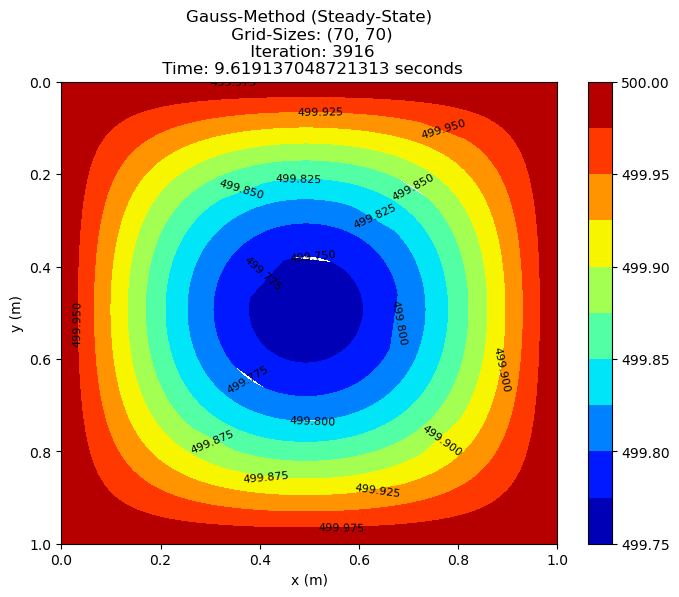

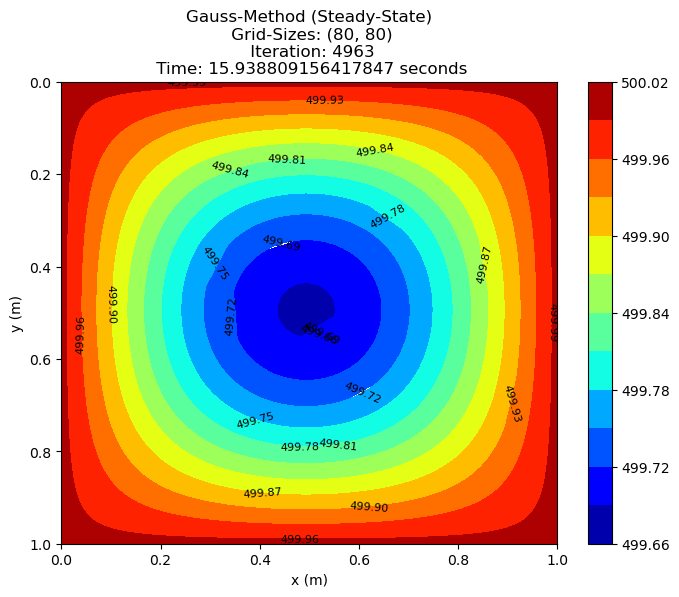

In [16]:
for i in range(len(grid_temp_gauss_ss)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_gauss_ss[i], "Gauss-Method (Steady-State)", iter_count_gauss_ss[i], elapsed_time_gauss_ss[i])
    plt.show()

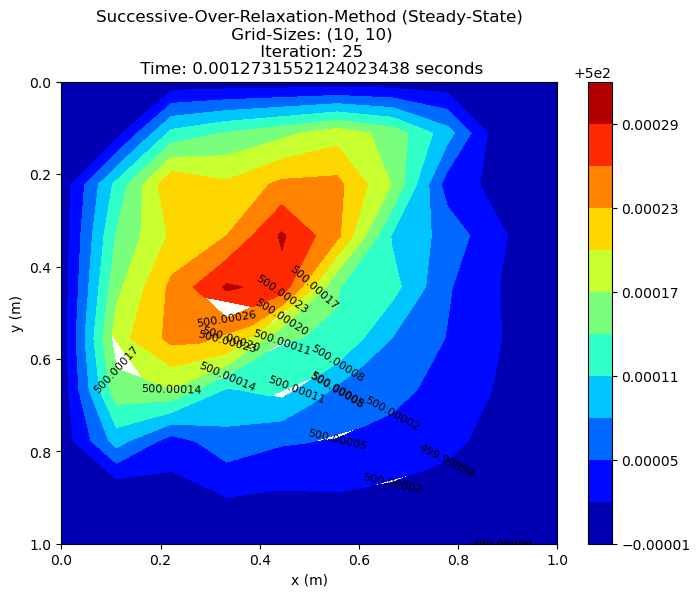

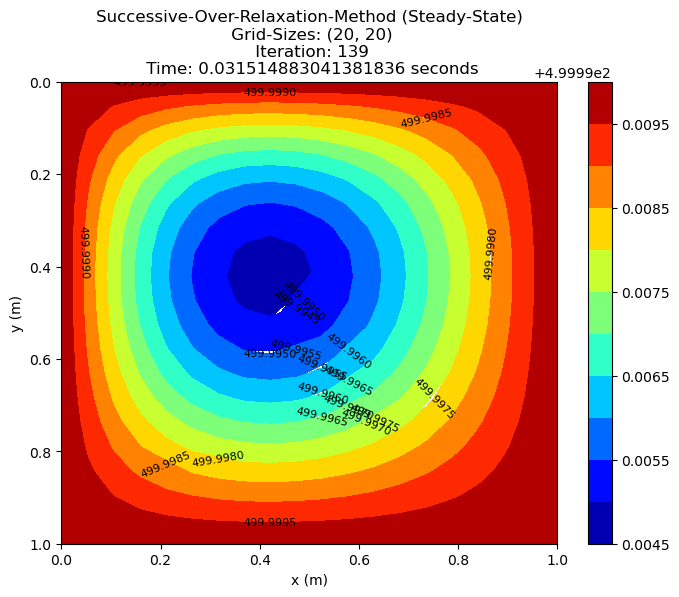

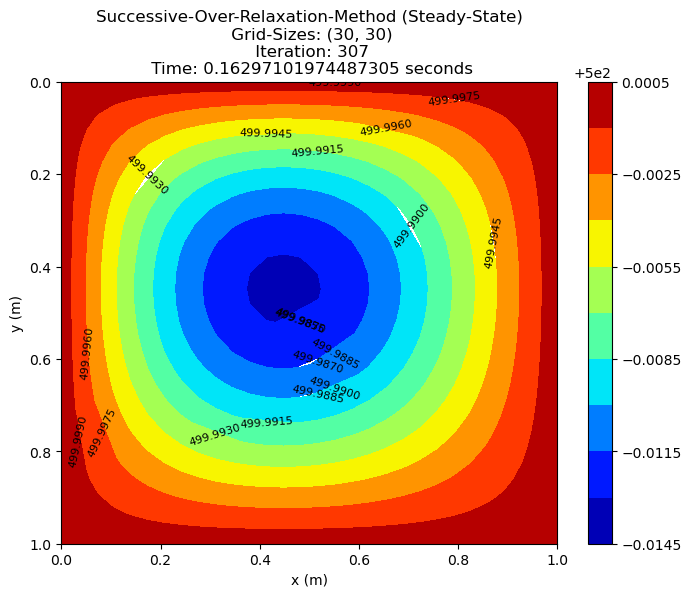

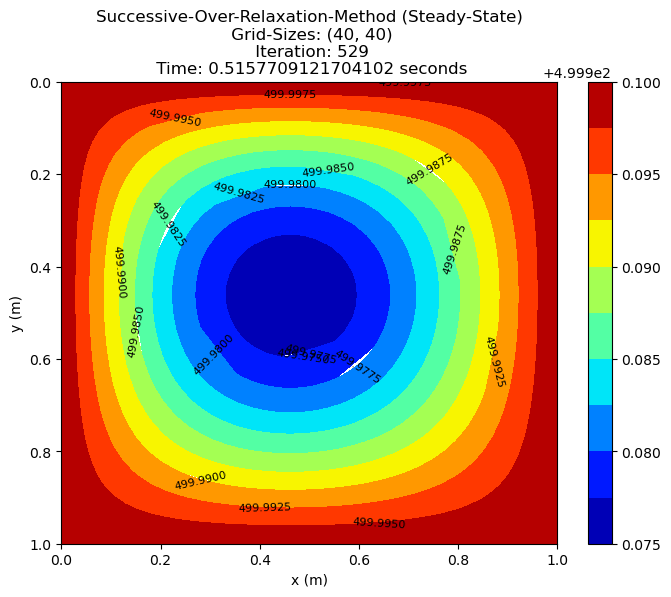

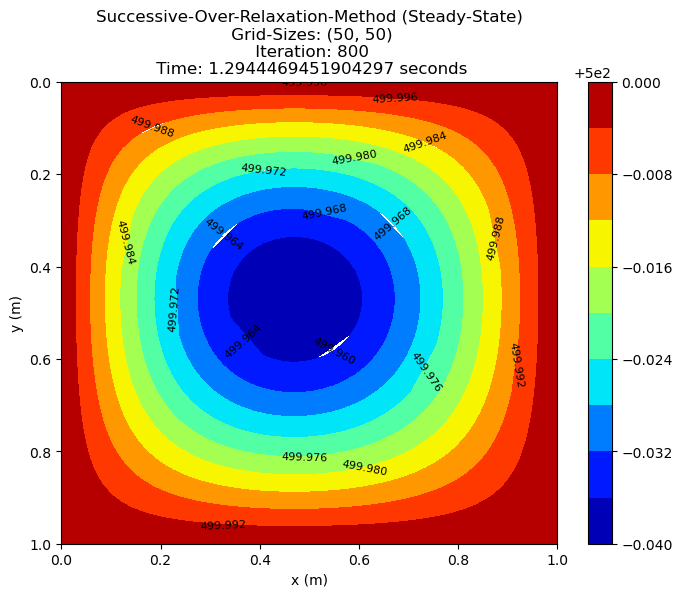

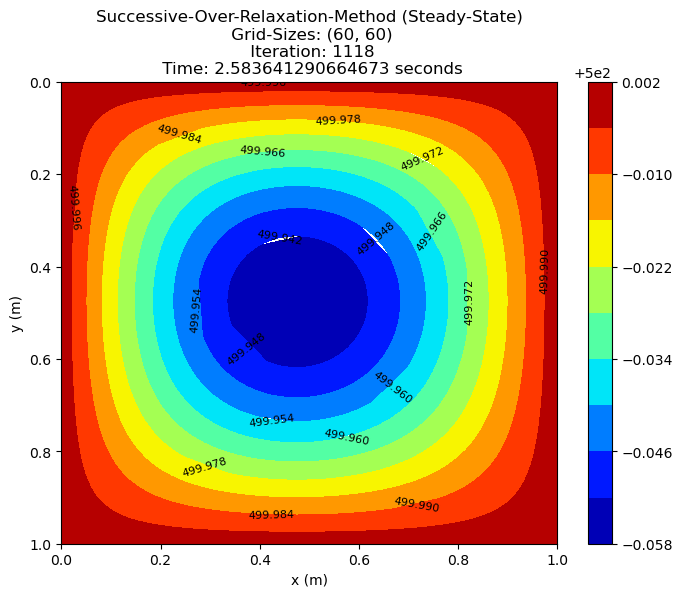

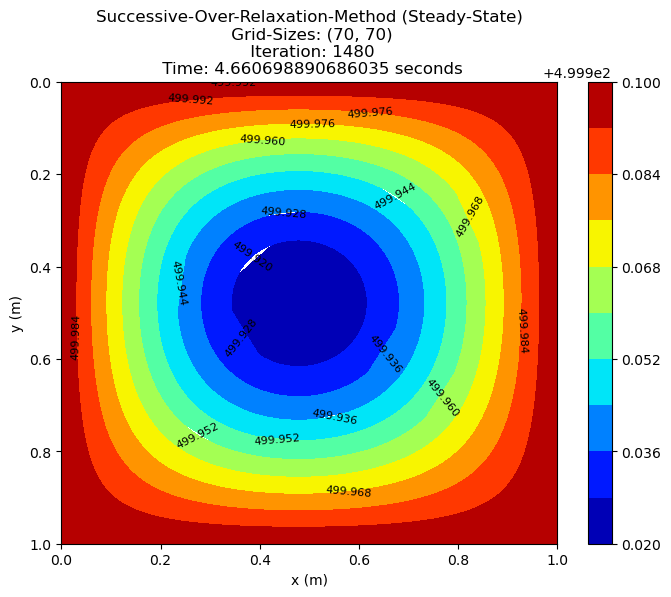

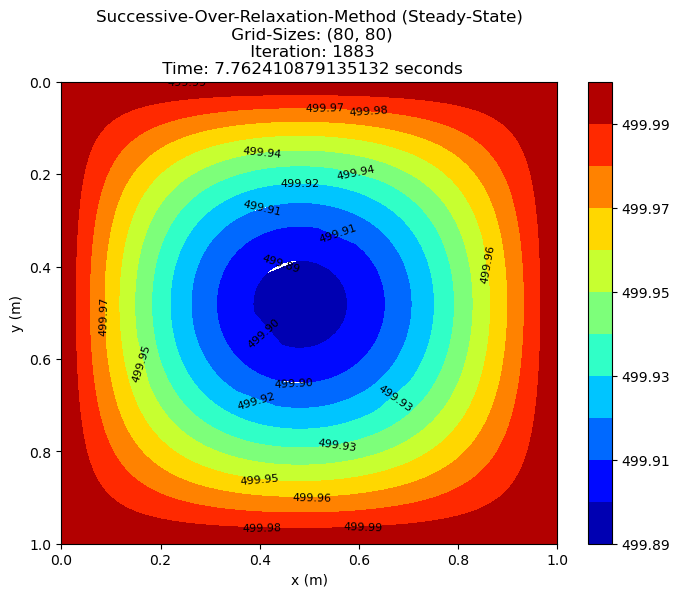

In [17]:
for i in range(len(grid_temp_sor_ss)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_sor_ss[i], "Successive-Over-Relaxation-Method (Steady-State)", iter_count_sor_ss[i], elapsed_time_sor_ss[i])
    plt.show()

---

##### **3.5.1.2: Non-Steady State 2D Heat Diffusion (Explicit)**

In [18]:
grid_temp_jacobi_exp, elapsed_time_jacobi_exp = [], []
grid_temp_gauss_exp, elapsed_time_gauss_exp = [], []
grid_temp_sor_exp, elapsed_time_sor_exp = [], []

# iterate for respective grid size 
for nx_new, ny_new in grid_size:
    l = 1

    # number of grid spacing in x and y direction 
    x_new = np.linspace(0, l, nx_new)
    y_new = np.linspace(0, l, ny_new)

    # change of length in each grid point in x and y direction 
    dx_new = x_new[1] - x_new[0]
    dy_new = y_new[1] - y_new[0]

    # omega for SOR 
    omega = 1.5

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = 0.4
    dt_exp = 0.0001
    k1_exp_new = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp_new = alpha_exp * (dt_exp/ (dy_new)**2)
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the jacobi iterative scheme 
    T_jacobi_exp_new, jacobi_elapsed_time_exp_new = jacobi_iter_explicit(top, bottom,left, right, nx_new, ny_new, time_step_iter, k1_exp_new, k2_exp_new)
    # call the function to compute the gauss iterative scheme 
    T_gauss_exp_new, gauss_elapsed_time_exp_new = gauss_seidel_iter_explicit(top, bottom,left, right, nx_new, ny_new, time_step_iter, k1_exp_new, k2_exp_new)
    # call the function to compute the SOR iterative scheme 
    T_sor_exp_new, sor_elapsed_time_exp_new = SOR_iter_explicit(top, bottom,left, right, nx_new, ny_new, time_step_iter, k1_exp_new, k2_exp_new, omega)
    
    grid_temp_jacobi_exp.append(T_jacobi_exp_new)
    elapsed_time_jacobi_exp.append(jacobi_elapsed_time_exp_new)

    grid_temp_gauss_exp.append(T_gauss_exp_new)
    elapsed_time_gauss_exp.append(gauss_elapsed_time_exp_new)

    grid_temp_sor_exp.append(T_sor_exp_new)
    elapsed_time_sor_exp.append(sor_elapsed_time_exp_new)
    
elapsed_time_exp = pd.DataFrame({"jacobi": elapsed_time_jacobi_exp, 
                        "gauss": elapsed_time_gauss_exp, 
                        "sor": elapsed_time_sor_exp})

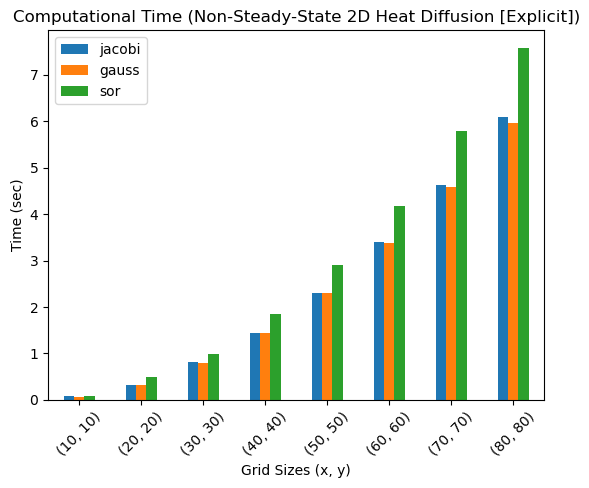

In [19]:
elapsed_time_exp.plot(kind = "bar")
plt.title("Computational Time (Non-Steady-State 2D Heat Diffusion [Explicit])")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Time (sec)")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)
plt.show()

Based on the plot shown above for the explicit method, the computational time for all three iterative solvers with different grid sizes increases exponentially as larger grid sizes require more computations and memory and otherwise. It can be seen that the SOR method exhibits the lowest computational time and converges faster due to the inclusion of the over-realxation parameters as compared to the Jacobi and Gauss-seidel methods. Since the explicit method depends on stability constraints in nature, it does not iterate for convergence. As such, there is no error-trend and number of iterative plots in this case. 

The consistency of the convergence across the three iterative solvers with different grid sizes in non-steady state 2D heat equations (explicit) are illustrated below in the form of contours plots. 

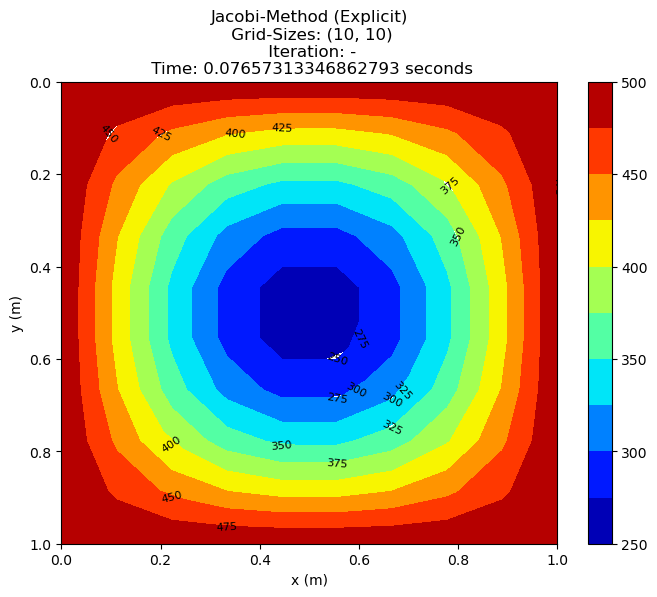

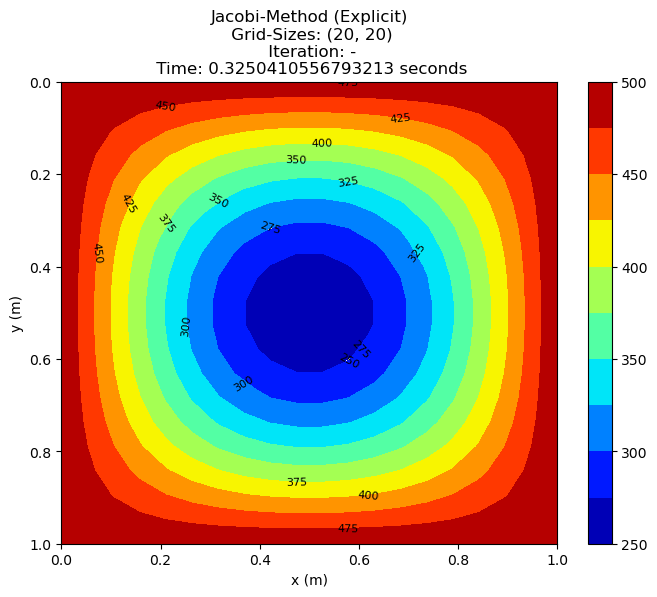

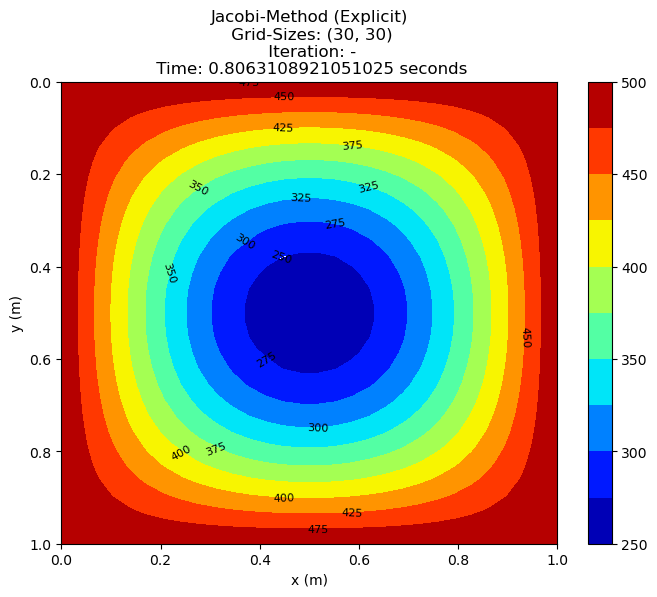

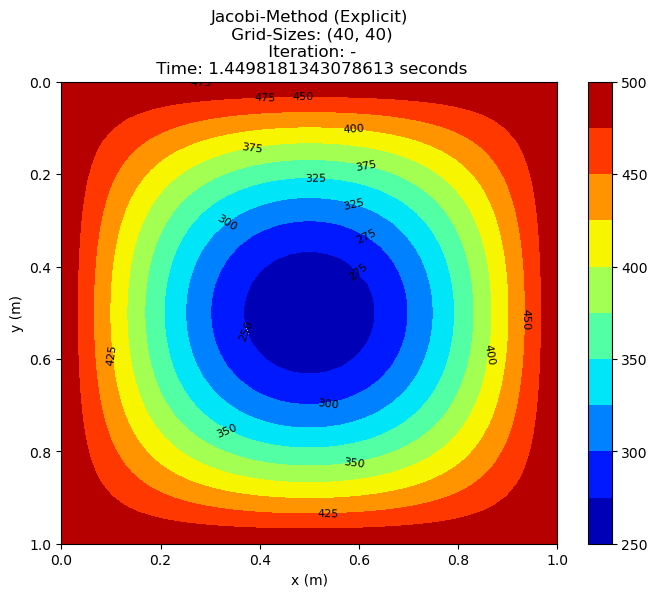

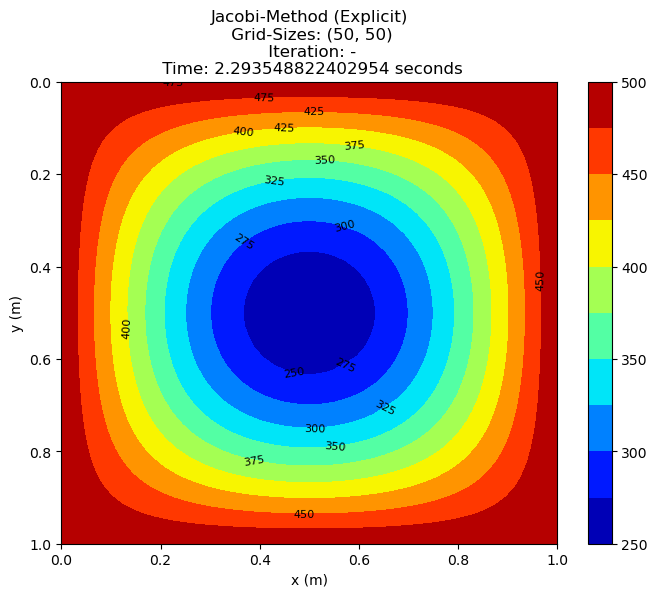

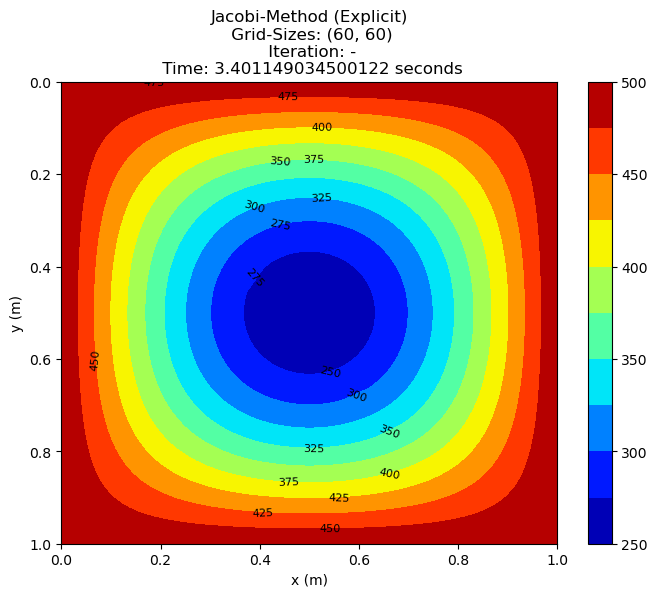

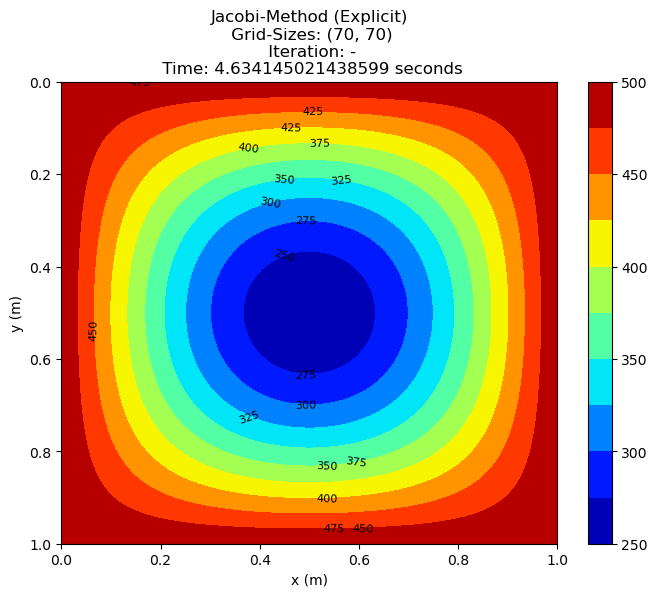

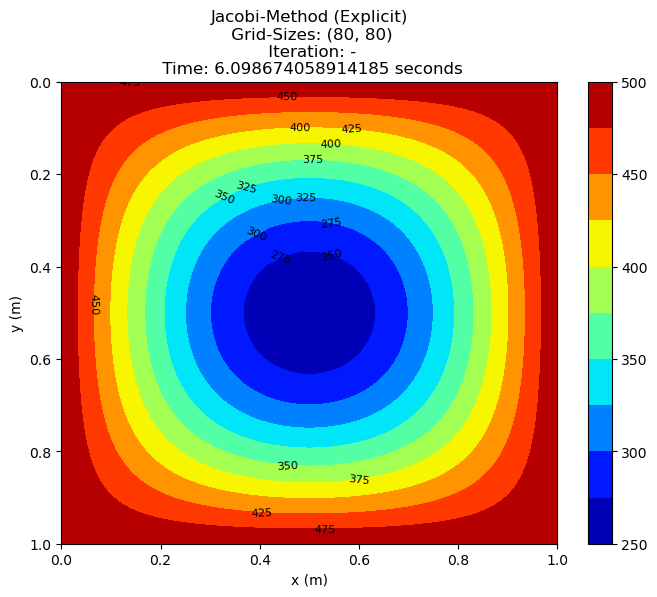

In [20]:
for i in range(len(grid_temp_jacobi_exp)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_jacobi_exp[i], "Jacobi-Method (Explicit)", "-", elapsed_time_jacobi_exp[i])
    plt.show()

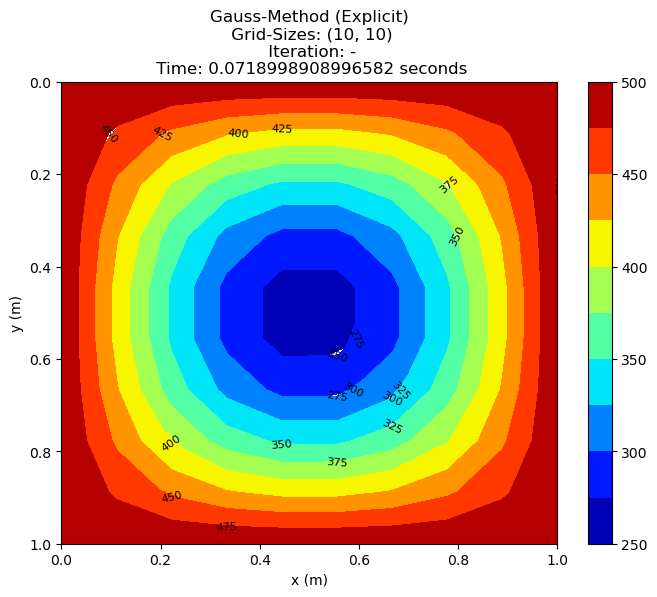

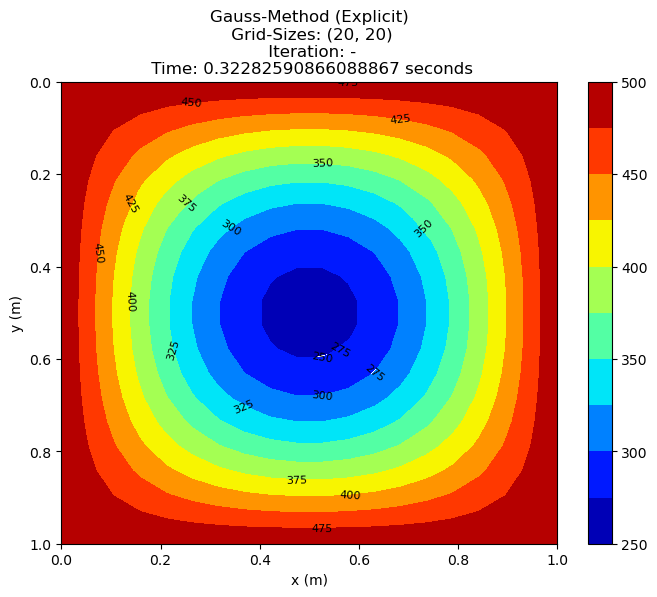

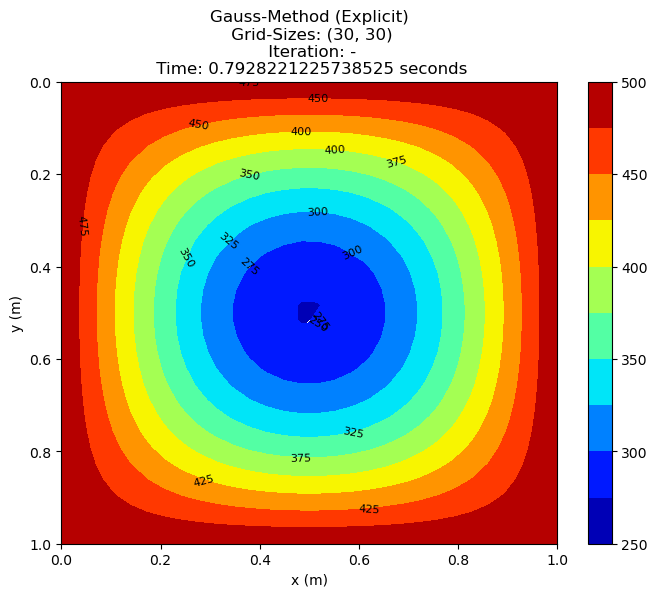

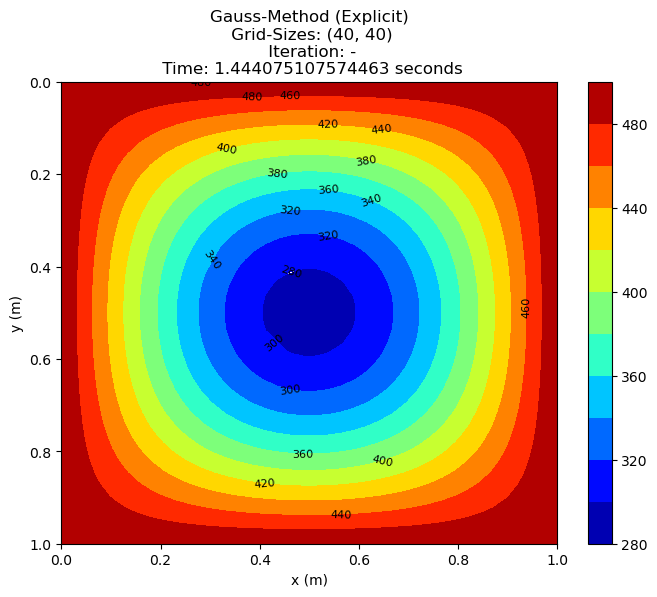

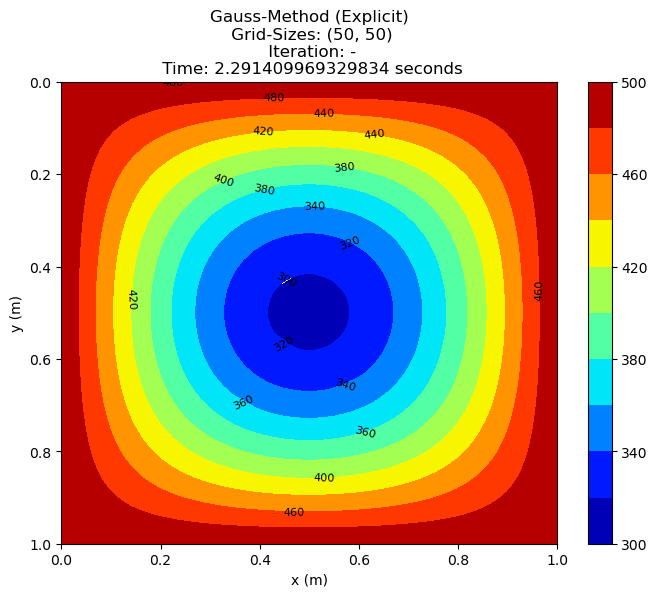

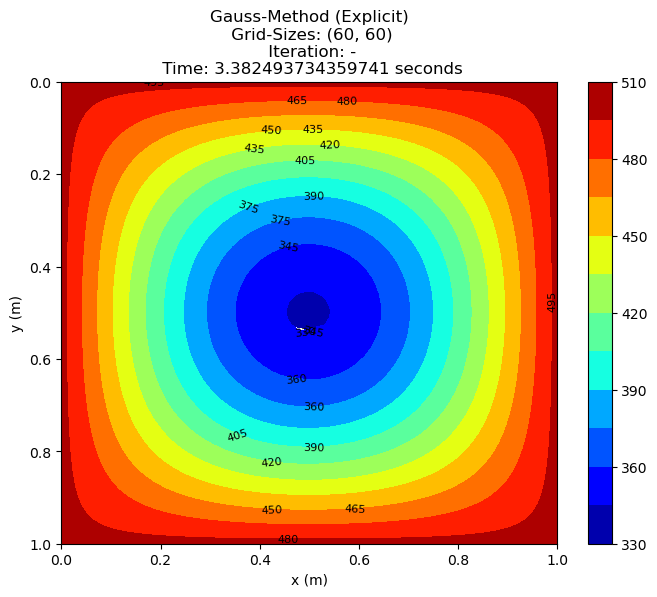

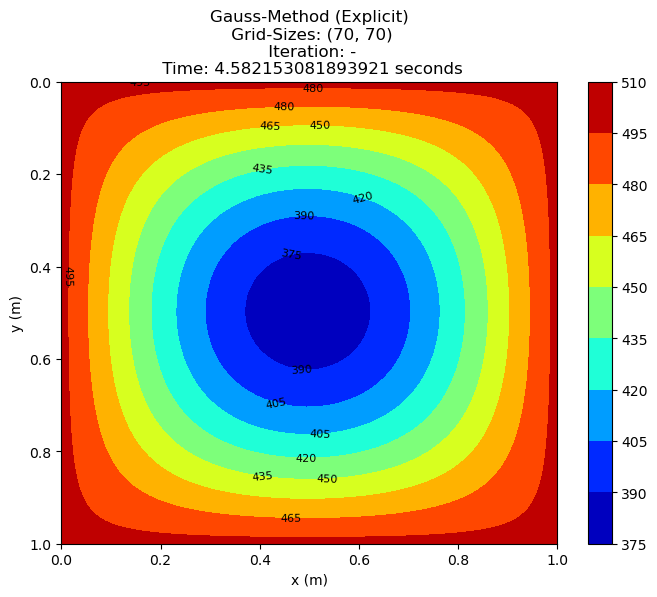

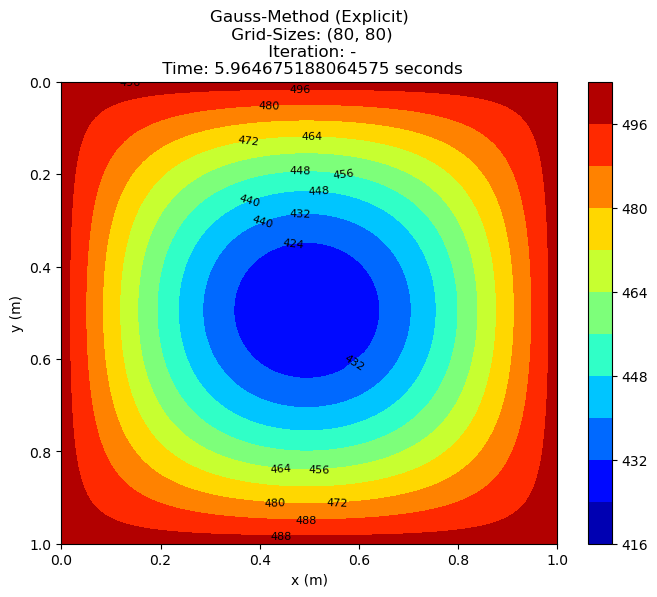

In [21]:
for i in range(len(grid_temp_gauss_exp)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_gauss_exp[i], "Gauss-Method (Explicit)", "-", elapsed_time_gauss_exp[i])
    plt.show()

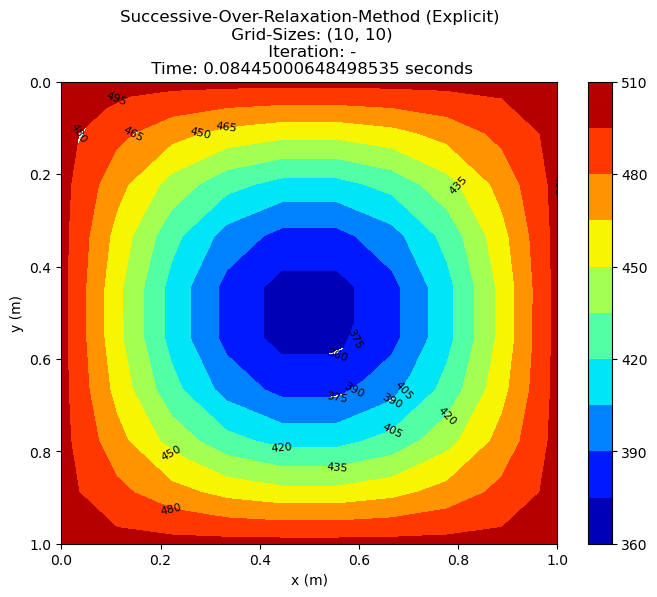

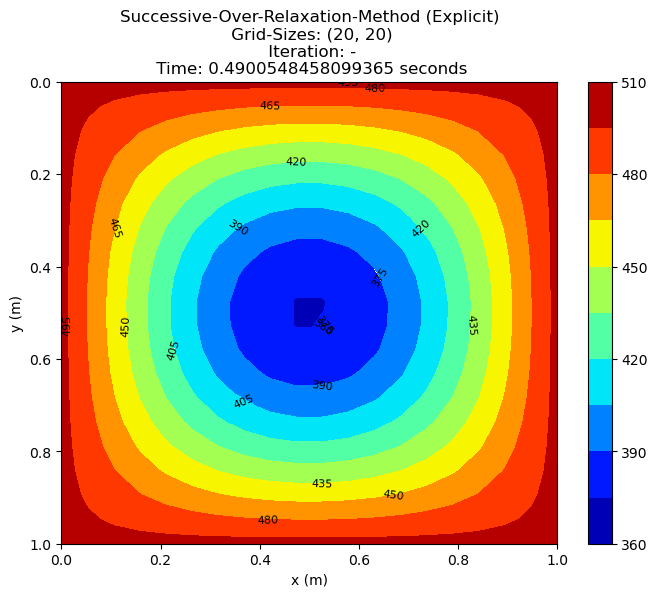

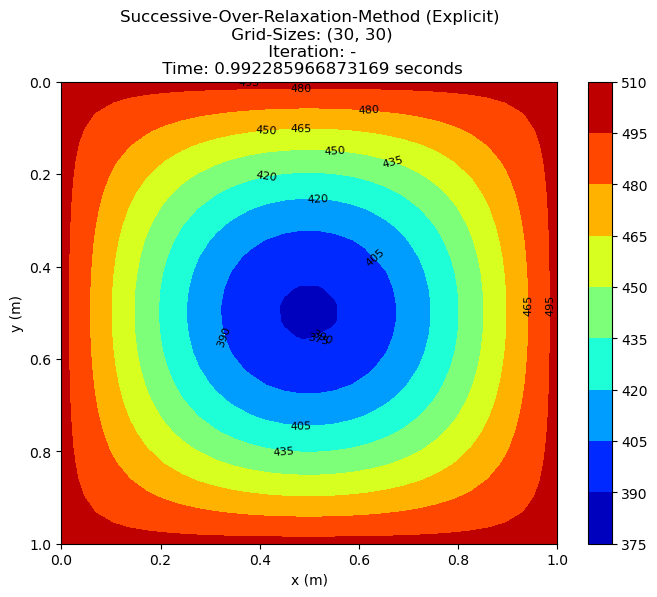

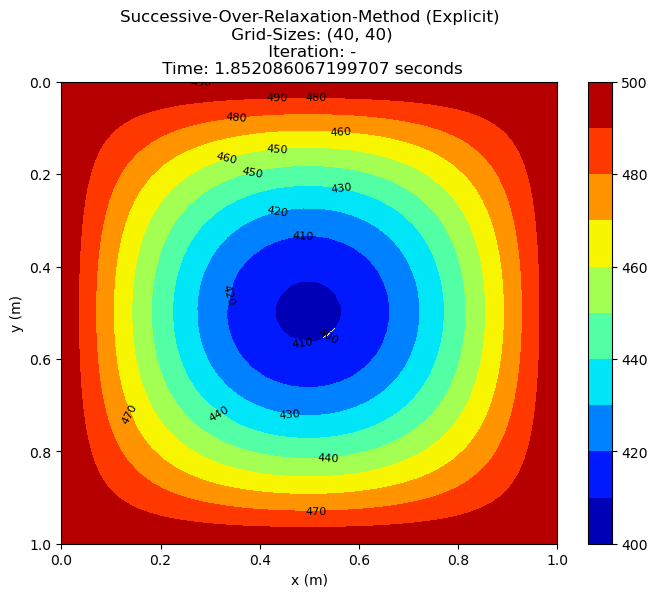

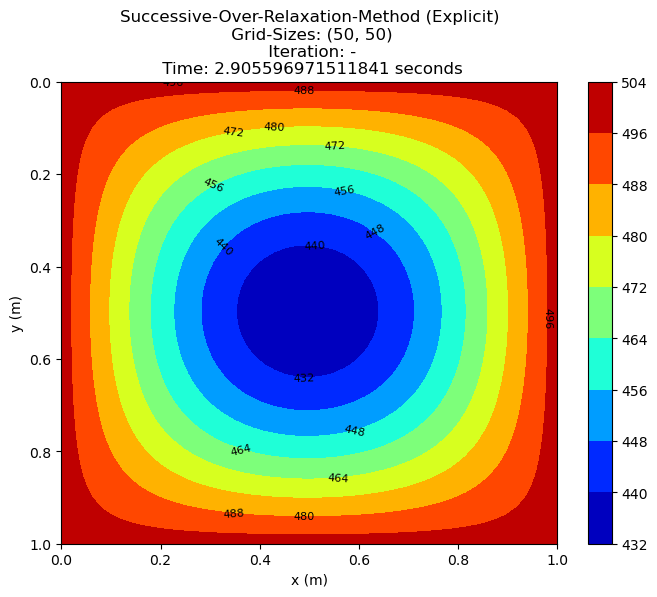

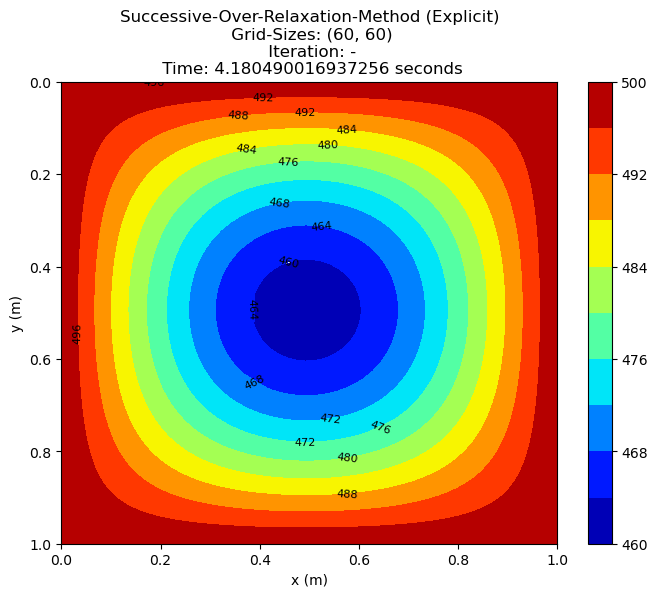

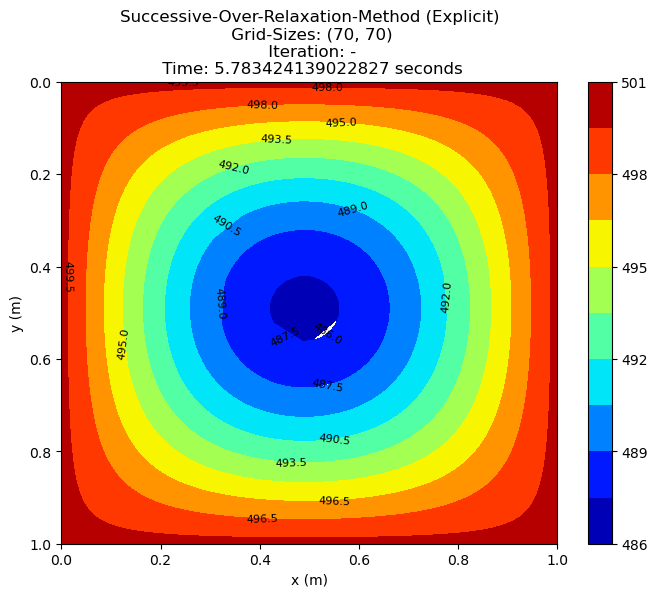

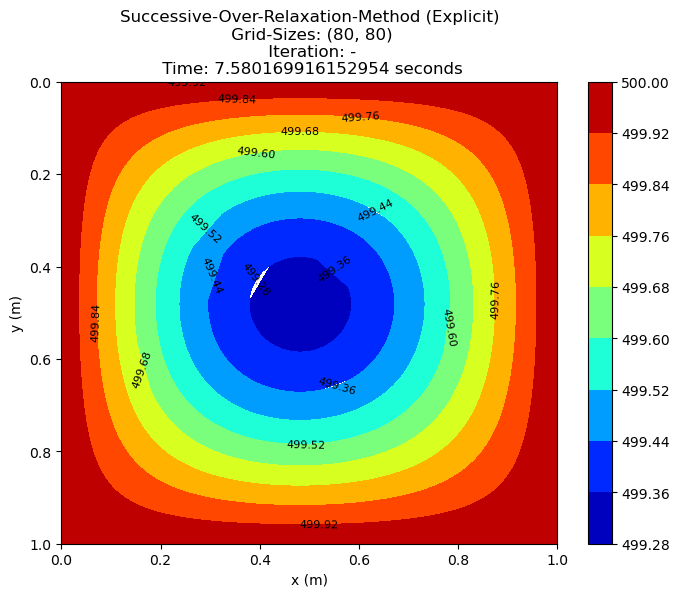

In [22]:
for i in range(len(grid_temp_sor_exp)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_sor_exp[i], "Successive-Over-Relaxation-Method (Explicit)", "-", elapsed_time_sor_exp[i])
    plt.show()

---

##### **3.5.1.3: Non-Steady-State 2D Heat Diffusion (Implicit)**

In [23]:
grid_temp_jacobi_imp, iter_count_jacobi_imp, elapsed_time_jacobi_imp, error_jacobi_imp = [], [], [], []
grid_temp_gauss_imp, iter_count_gauss_imp, elapsed_time_gauss_imp, error_gauss_imp = [], [], [], []
grid_temp_sor_imp, iter_count_sor_imp, elapsed_time_sor_imp, error_sor_imp = [], [], [], []

# iterate for respective grid size 
for nx_new, ny_new in grid_size:
    l = 1

    # number of grid spacing in x and y direction 
    x_new = np.linspace(0, l, nx_new)
    y_new = np.linspace(0, l, ny_new)

    # change of length in each grid point in x and y direction 
    dx_new = x_new[1] - x_new[0]
    dy_new = y_new[1] - y_new[0]

    # omega for SOR 
    omega = 1.5

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for implicit time-dependent 
    alpha_imp = 20
    dt_imp = 0.001
    k1_imp = alpha_imp * (dt_imp/ (dx_new)**2)
    k2_imp  = alpha_imp * (dt_imp/ (dy_new)**2)

    ######### Non-Steady State (Implicit) #########
    # call the function to compute the jacobi iterative scheme 
    T_jacobi_imp_new, jacobi_iter_imp_new, jacobi_elapsed_time_imp_new, jacobi_error_imp_new = jacobi_iter_implicit(top, bottom,left, right, nx_new, ny_new, time_step_iter, k1_imp, k2_imp, error, tol)
    # call the function to compute the gauss iterative scheme 
    T_gauss_imp_new, gauss_iter_imp_new, gauss_elapsed_time_imp_new, gauss_error_imp_new = gauss_seidel_iter_implicit(top, bottom,left, right, nx_new, ny_new, time_step_iter, k1_imp, k2_imp, error, tol)
    # call the function to compute the SOR iterative scheme 
    T_sor_imp_new, sor_iter_imp_new, sor_elapsed_time_imp_new, sor_error_imp_new = SOR_iter_implicit(top, bottom,left, right, nx_new, ny_new, time_step_iter, k1_imp, k2_imp, error, tol, omega)
    
    grid_temp_jacobi_imp.append(T_jacobi_imp_new)
    iter_count_jacobi_imp.append(jacobi_iter_imp_new)
    elapsed_time_jacobi_imp.append(jacobi_elapsed_time_imp_new)
    error_jacobi_imp.append(jacobi_error_imp_new)

    grid_temp_gauss_imp.append(T_gauss_imp_new)
    iter_count_gauss_imp.append(gauss_iter_imp_new)
    elapsed_time_gauss_imp.append(gauss_elapsed_time_imp_new)
    error_gauss_imp.append(gauss_error_imp_new)

    grid_temp_sor_imp.append(T_sor_imp_new)
    iter_count_sor_imp.append(sor_iter_imp_new)
    elapsed_time_sor_imp.append(sor_elapsed_time_imp_new)
    error_sor_imp.append(sor_error_imp_new)

iterative_count_imp = pd.DataFrame({"jacobi": iter_count_jacobi_imp, 
                        "gauss": iter_count_gauss_imp, 
                        "sor": iter_count_sor_imp})

elapsed_time_imp = pd.DataFrame({"jacobi": elapsed_time_jacobi_imp, 
                        "gauss": elapsed_time_gauss_imp, 
                        "sor": elapsed_time_sor_imp})

error_imp = pd.DataFrame({"jacobi": error_jacobi_imp, 
                        "gauss": error_gauss_imp, 
                        "sor": error_sor_imp})

<Figure size 1000x1000 with 0 Axes>

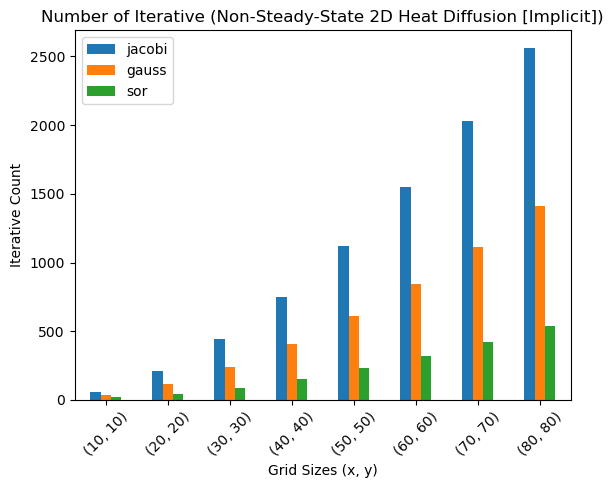

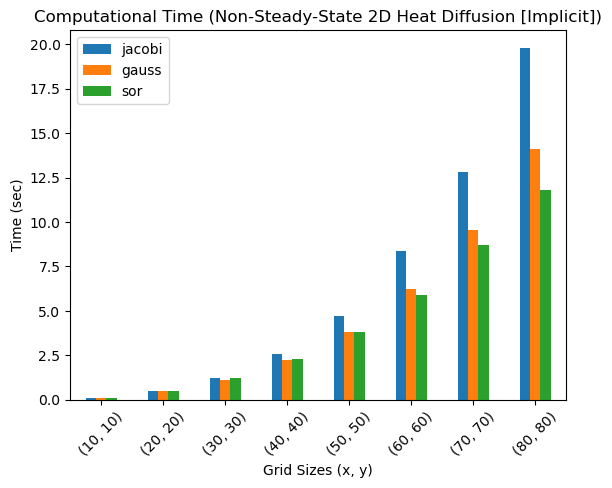

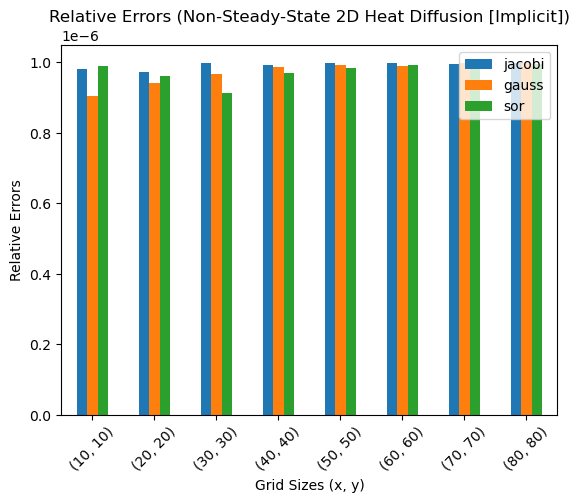

In [24]:
plt.figure(figsize = (10, 10))
iterative_count_imp.plot(kind = "bar")
plt.title("Number of Iterative (Non-Steady-State 2D Heat Diffusion [Implicit])")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Iterative Count")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)

elapsed_time_imp.plot(kind = "bar")
plt.title("Computational Time (Non-Steady-State 2D Heat Diffusion [Implicit])")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Time (sec)")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)

error_imp.plot(kind = "bar")
plt.title("Relative Errors (Non-Steady-State 2D Heat Diffusion [Implicit])")
plt.xlabel("Grid Sizes (x, y)")
plt.ylabel("Relative Errors")
plt.xticks(ticks=range(len(grid_size)), labels=grid_size, rotation=45)
plt.show()

Based on the plots shown above for the implicit methods, it seen that the relative errors for all the three iterative solvers (Jacobi, Gauss, and SOR) remain consistent across the different grid sizes. This suggests that all the iterative solvers converge nearly to all the same solutions. This can also be agreed by the compoutational 

As for the computational time, it increases exponentially with the number of grid sizes due to the increasing number of unknowns in the system. It can also be seen that the Jacobi method has a higher computational time compared to the Gauss-Seidel and SOR methods. This could be due to the weakest coupling between the equations. However, the SOR method has a better computational time, which converges faster.

On the other hand, the computational time is highly associated with the number of iterations across the three iterative solvers. SOR has the lowest number of iterations across the different grid sizes as compared with the Jacobi and Gauss-Seidel methods. This could be due to the integration of the relaxation. However, Jacobi has the highest number of iterations across the different grid sizes, and Gauss-seidel is in between the both methods.

The consistency of the convergence across the three iterative solvers with different grid sizes in non-steady state 2D heat equations (implicit) are illustrated below in the form of contours plots. 

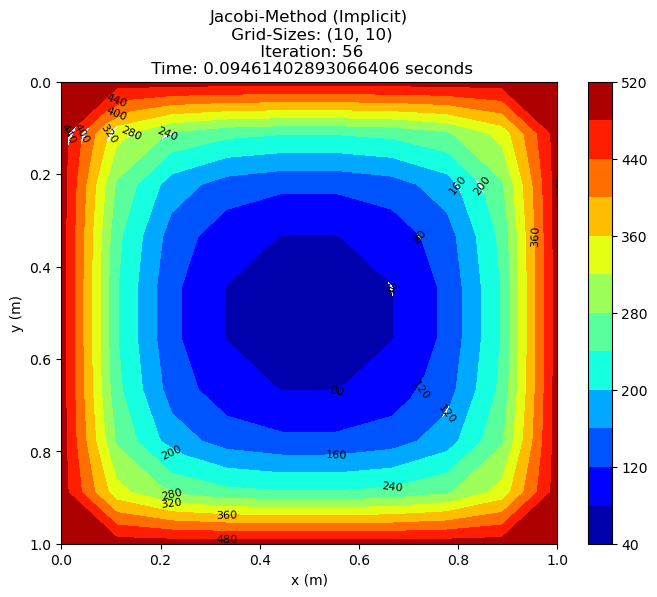

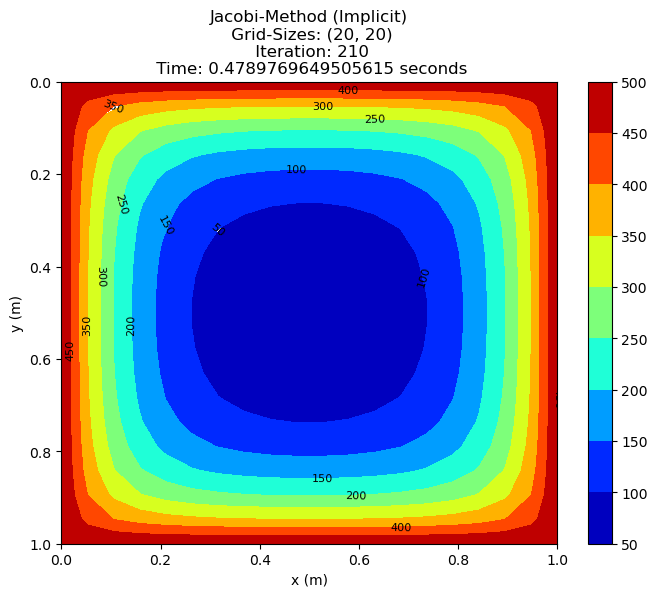

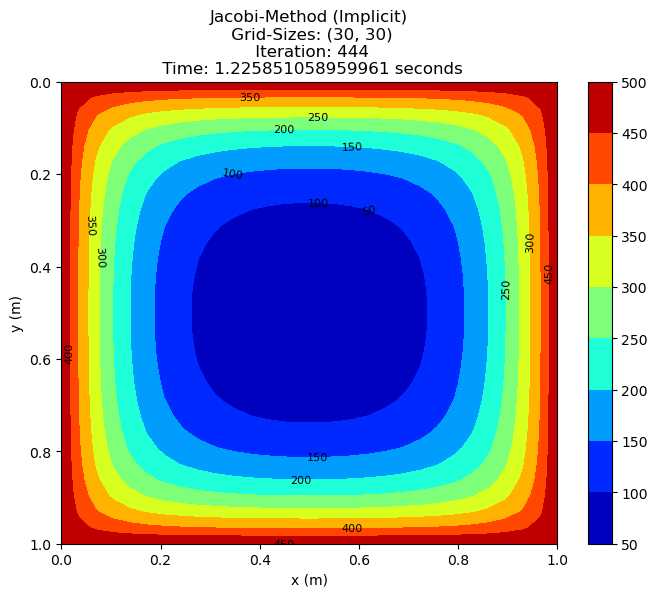

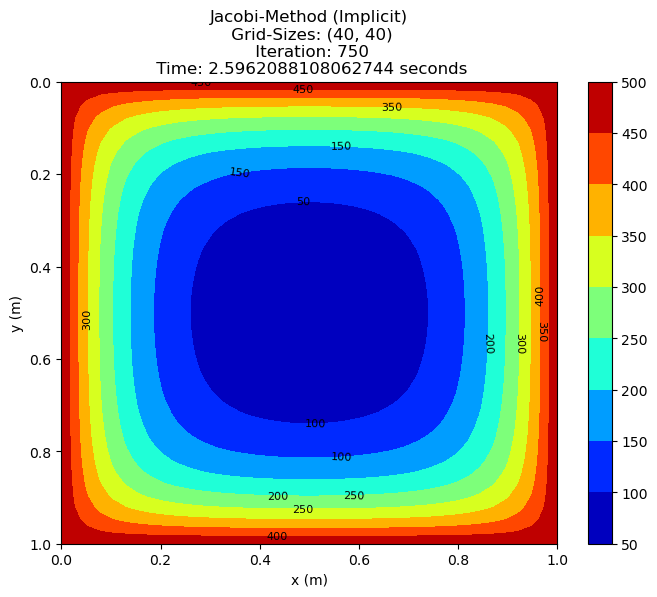

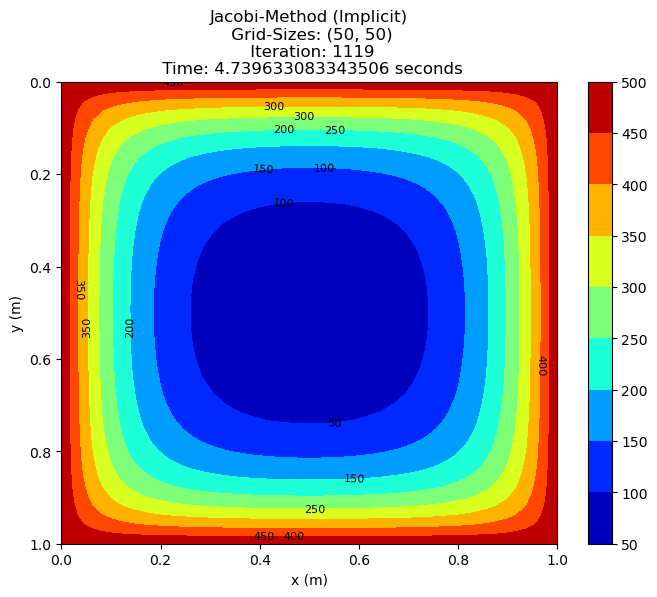

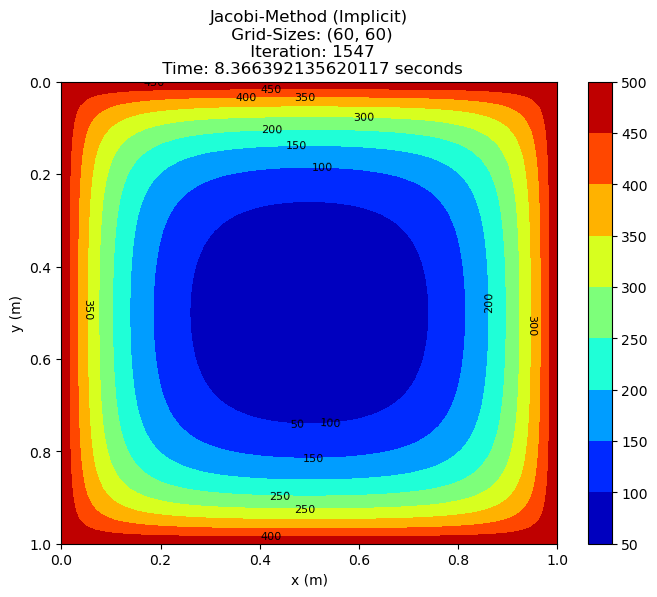

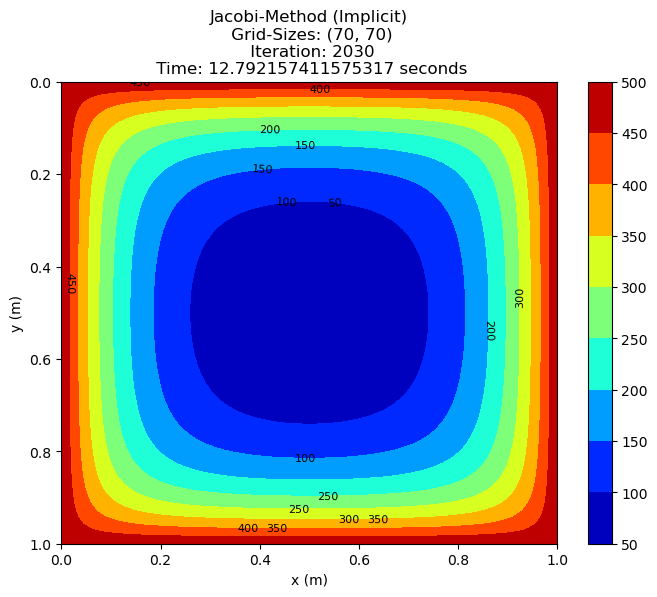

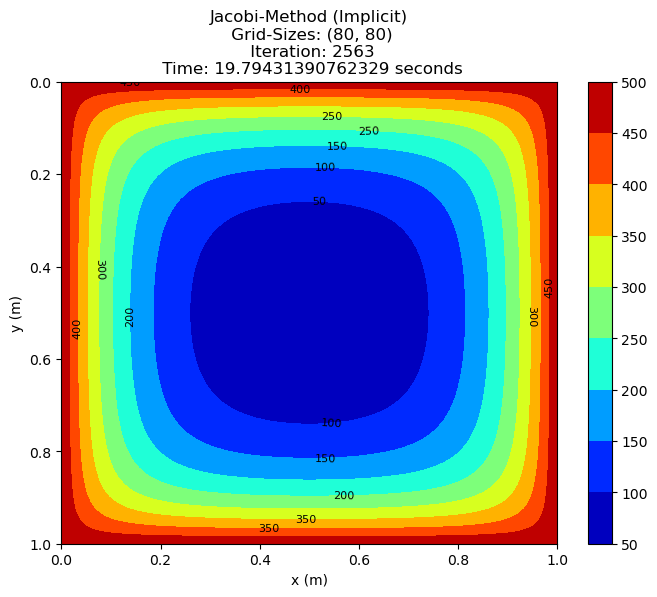

In [25]:
for i in range(len(grid_temp_jacobi_imp)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_jacobi_imp[i], "Jacobi-Method (Implicit)", iter_count_jacobi_imp[i], elapsed_time_jacobi_imp[i])
    plt.show()

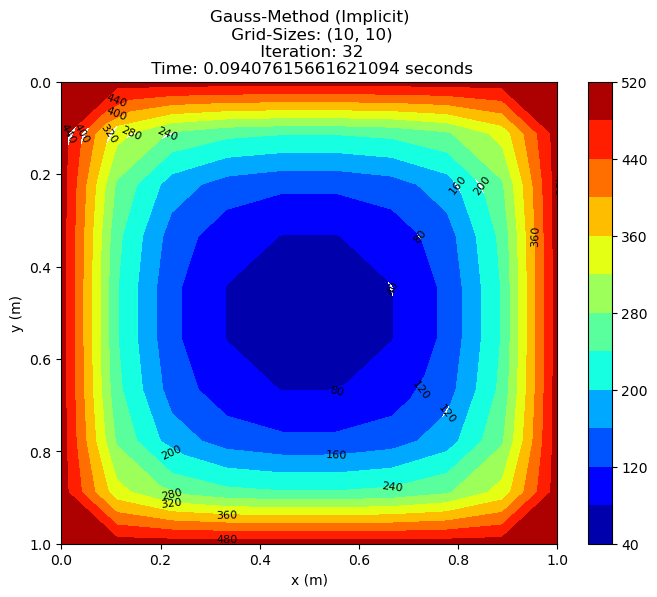

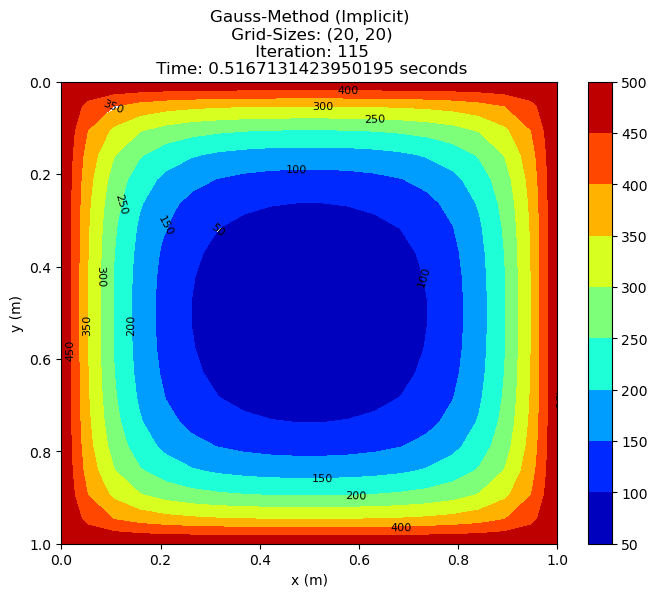

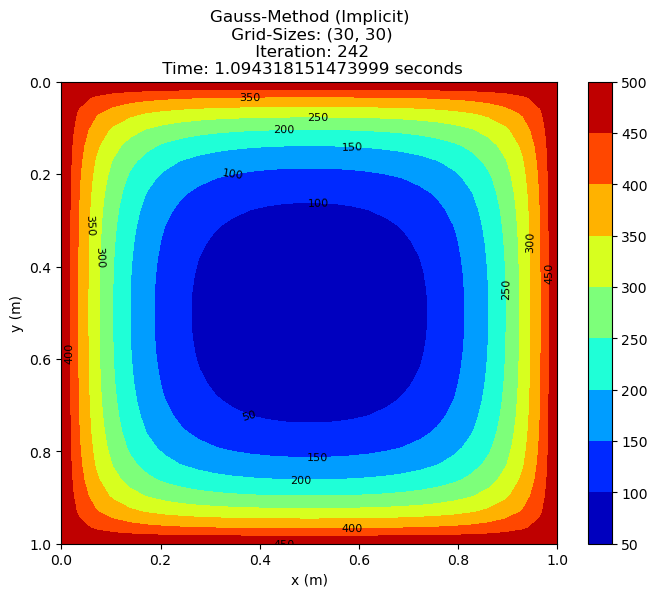

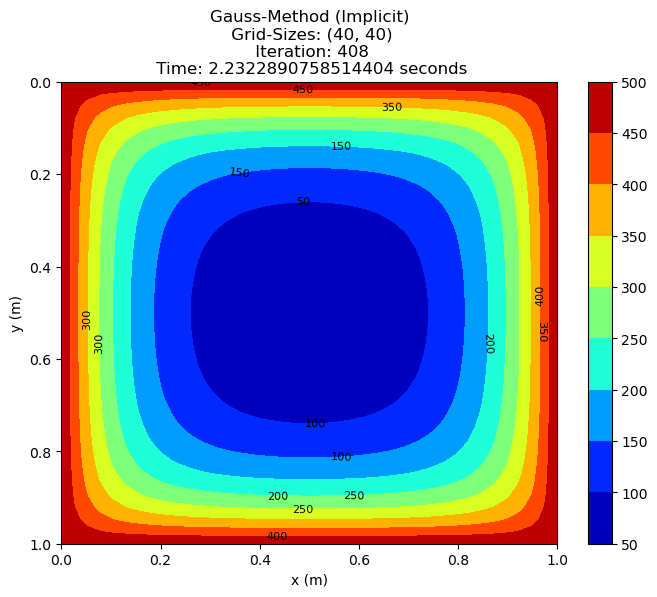

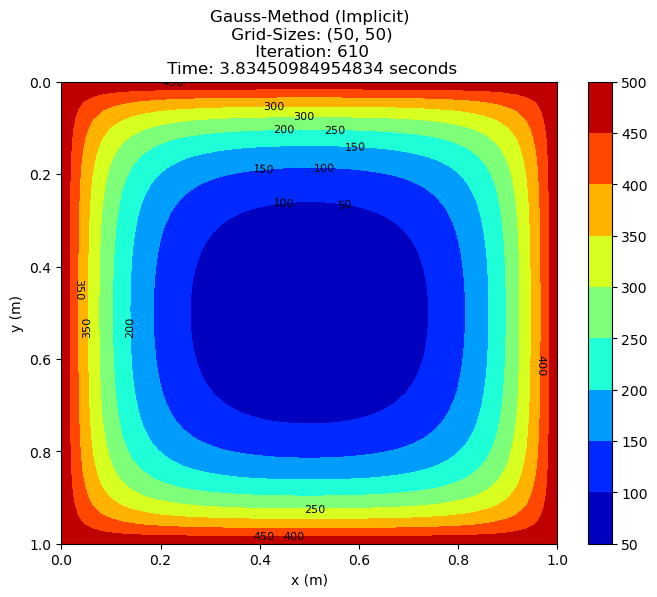

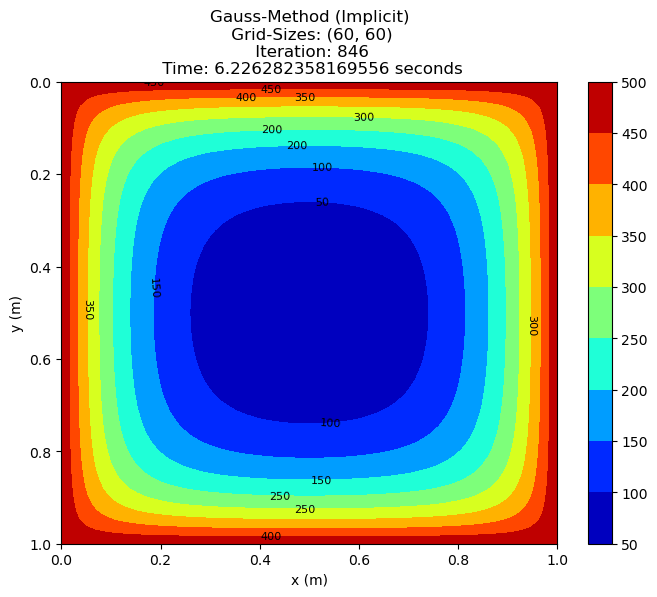

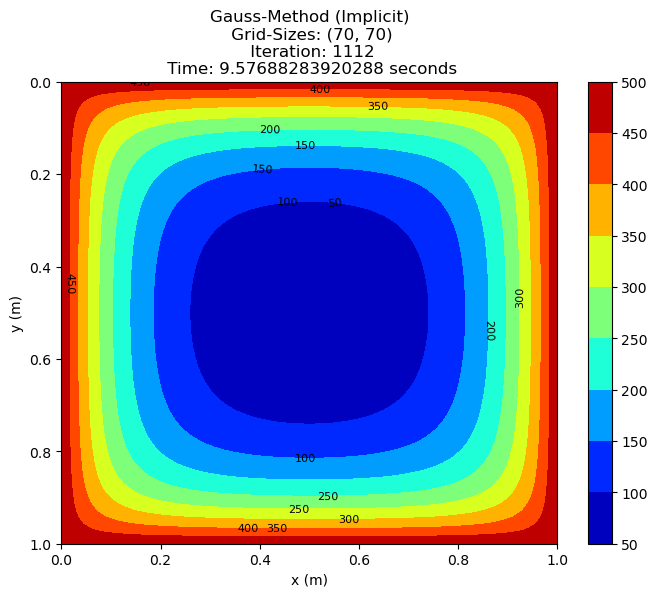

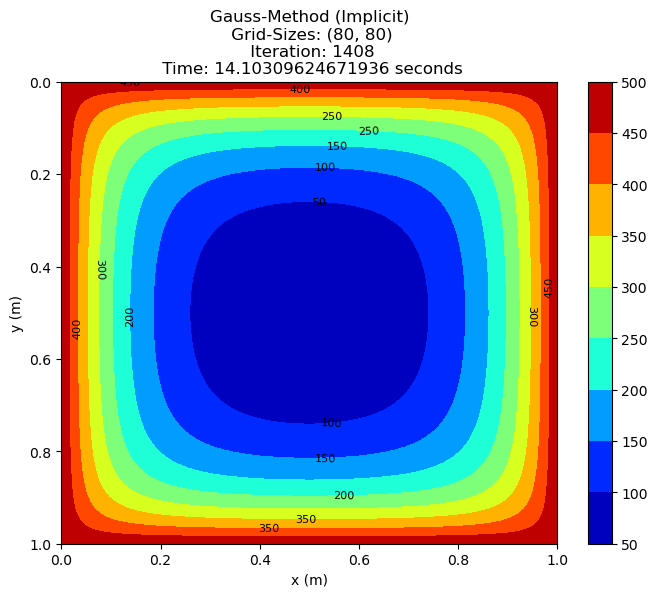

In [26]:
for i in range(len(grid_temp_gauss_imp)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_gauss_imp[i], "Gauss-Method (Implicit)", iter_count_gauss_imp[i], elapsed_time_gauss_imp[i])
    plt.show()

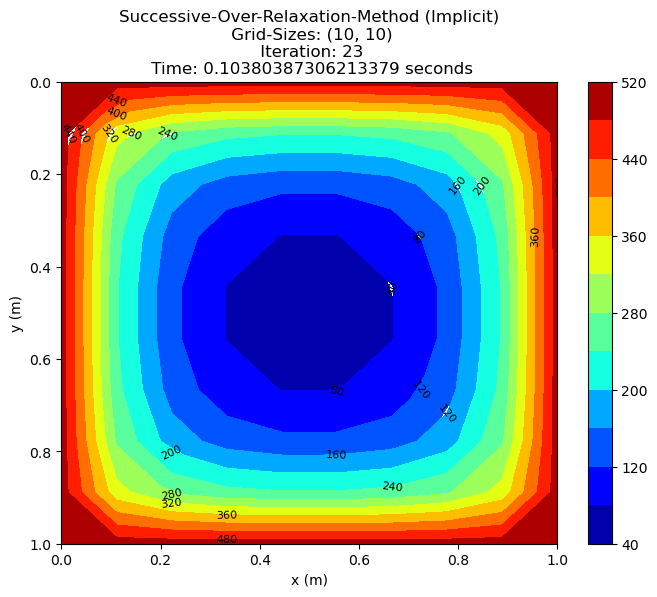

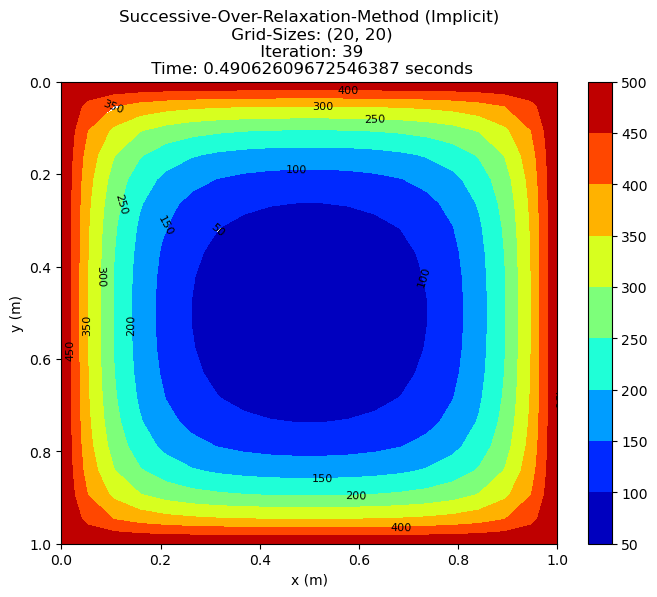

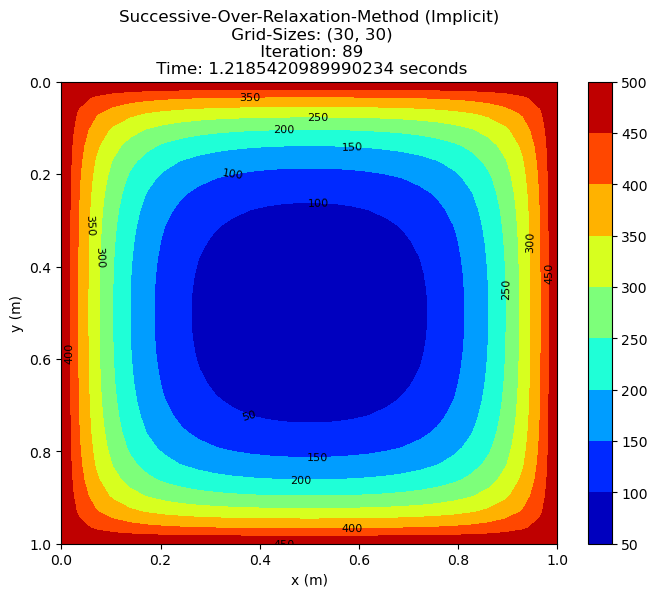

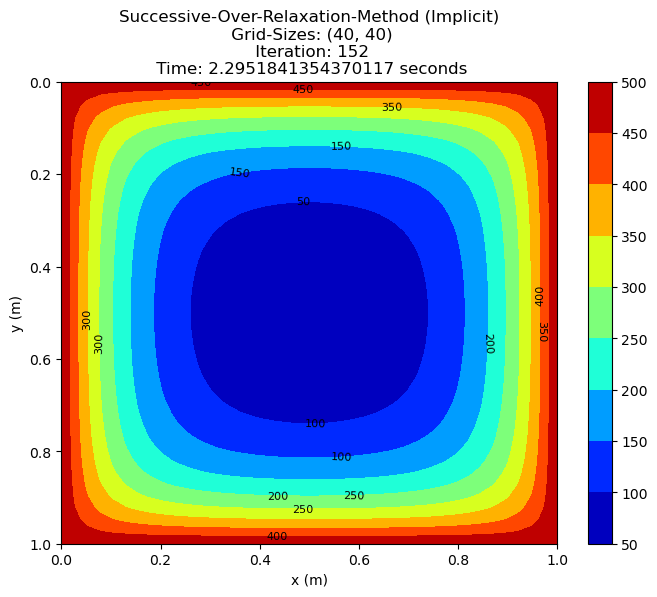

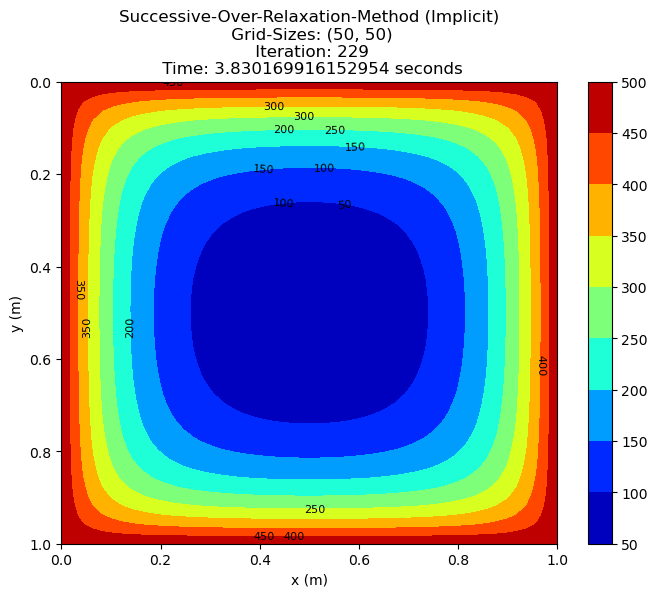

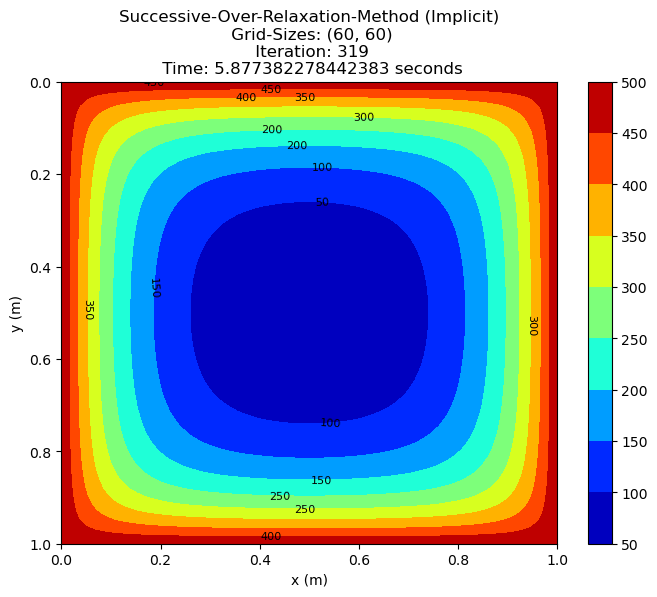

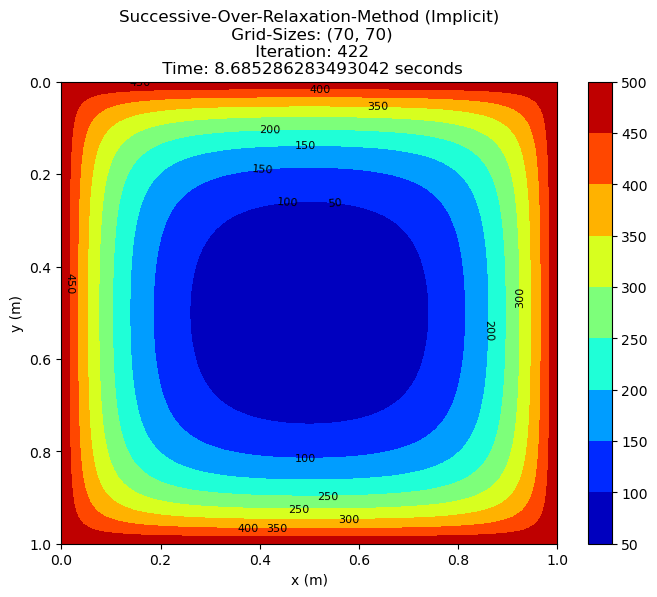

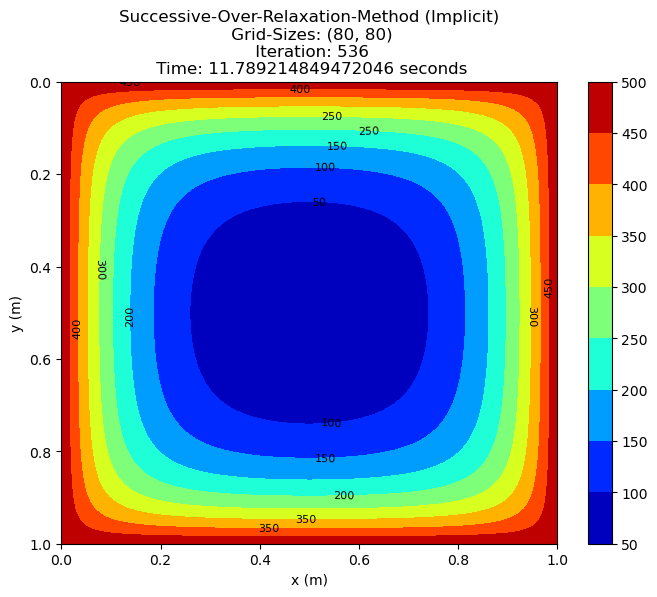

In [27]:
for i in range(len(grid_temp_sor_imp)):
    display_contour_plot_grid_refinement(x[i], y[i], grid_size[i], grid_temp_sor_imp[i], "Successive-Over-Relaxation-Method (Implicit)", iter_count_sor_imp[i], elapsed_time_sor_imp[i])
    plt.show()

---

#### **3.5.2 Stability Analysis**

The objective of stability analysis for the explicit finite difference method is to minimize the numerical instability and ensure heat diffuses throughout or within the materials over time, which uses the Courant-Friedrichs-Lewy (CFL) condition to investigate the impact of the **thermal diffusivity (alpha parameter)** and **time steps (dt)** on the stability criterion. The Courant-Friedrichs-Lewy (CFL) condition is necessary for convergence while solving certain partial differential equations numerically.

For the case $\triangle x = \triangle y = \delta,$ the stability criterion becomes 

$$r = \frac{\alpha \triangle t}{\delta^2} \le \frac{1}{4}$$

Furthermore, it is unessential to perform the stability analysis for both the steady-state and implicit methods as they do not suffer from the similar phenomenon as the explicit method. In the steady-state method, the time-dedpendence is not involved in the 2D heat equation. On the other hand, the implicit method remains unconditionally stable regardless of the large domain of thermal diffusivity. 

In [28]:
# to display the contour plots
def display_contour_plot_thermal_stability(x, y, grid_sizes, grid_temp, title, alpha, elapsed_time, cfl):
    plt.figure(figsize=(8, 6))
    contours = plt.contourf(x, y, grid_temp.T, 10, cmap='jet')
    plt.clabel(contours, inline = True, fontsize = 8, colors = 'black')
    plt.colorbar()
    plt.title("{}\n Grid-Sizes: {}\n Alpha: {}\n Time: {} seconds\n CFL: {:.6f}".format(title, grid_sizes, alpha, elapsed_time, cfl))
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.gca().invert_yaxis()
    plt.show()

In [29]:
# to display the contour plots
def display_contour_plot_time_steps_stability(x, y, grid_sizes, grid_temp, title, change_time_steps, elapsed_time, cfl):
    plt.figure(figsize=(8, 6))
    contours = plt.contourf(x, y, grid_temp.T, 10, cmap='jet')
    plt.clabel(contours, inline = True, fontsize = 8, colors = 'black')
    plt.colorbar()
    plt.title("{}\n Grid-Sizes: {}\n Change of Time Steps: {}\n Time: {} seconds\n CFL: {:.6f}".format(title, grid_sizes, change_time_steps, elapsed_time, cfl))
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.gca().invert_yaxis()
    plt.show()

---

##### **Impact of Thermal Diffusivity on the Stability Criterion**

It explores how the range of thermal diffusivity (alpha), starting from 0.1 to 4.0 with a step size of 0.1, affects the overall convergence performance in a 2D system while keeping the rest of the parameters constants.

In [30]:
# initialize a list of thermal diffusivity (alpha) values 
alphaList = np.arange(0.1, 4.1, 0.1)

##### **3.5.2.1 Jacobi Method**

In [31]:
cfl_alpha_grid_temp_jacobi, cfl_alpha_elapsed_time_jacobi, cfl_alpha_jacobi = [], [], []

# iterate for respective alpha 
for alpha in alphaList:
    # length of the square domain
    length = 1

    # number of grid points in x and y direction
    num_grid_pt_x, num_grid_pt_y = 50, 50

    # number of grid spacing in x and y direction 
    num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
    num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

    # change of length in each grid point in x and y direction 
    dx_new = num_grid_space_x[1] - num_grid_space_x[0]
    dy_new = num_grid_space_y[1] - num_grid_space_y[0]

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = alpha
    dt_exp = 0.0001
    k1_exp = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp = alpha_exp * (dt_exp/ (dy_new)**2)
    cfl_alpha_num_jacobi = k1_exp + k2_exp
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the jacobi iterative scheme 
    cfl_alpha_temp_jacobi_exp, cfl_alpha_jacobi_elapsed_time_exp = jacobi_iter_explicit(top, bottom,left, right, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp)
    
    cfl_alpha_grid_temp_jacobi.append(cfl_alpha_temp_jacobi_exp)
    cfl_alpha_elapsed_time_jacobi.append(cfl_alpha_jacobi_elapsed_time_exp)
    cfl_alpha_jacobi.append(cfl_alpha_num_jacobi)

cfl_alpha_jacobi_df = pd.DataFrame({"alpha": alphaList,
                            "elapsed_time": cfl_alpha_elapsed_time_jacobi, 
                            "cfl": cfl_alpha_jacobi})


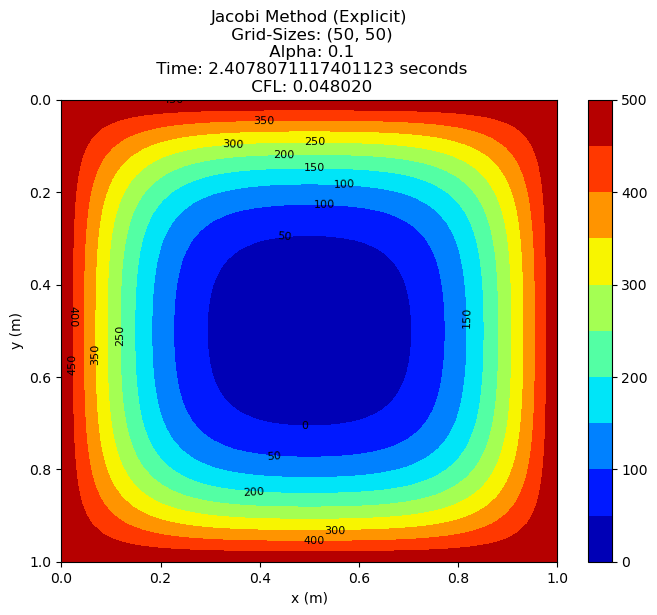

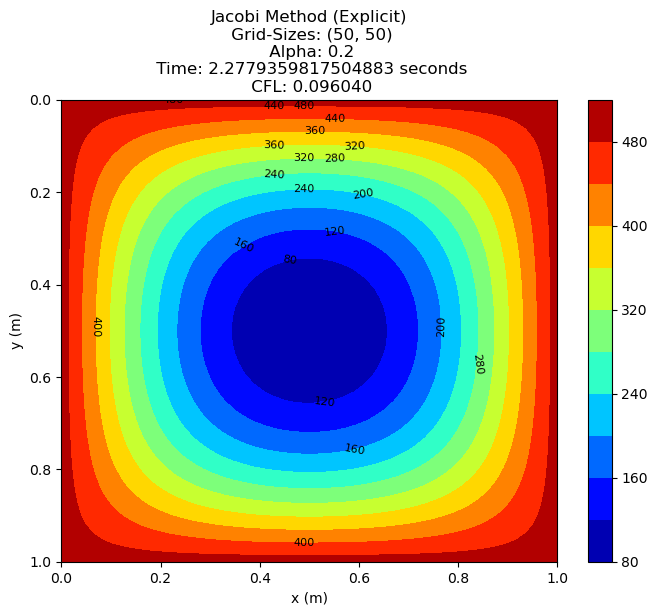

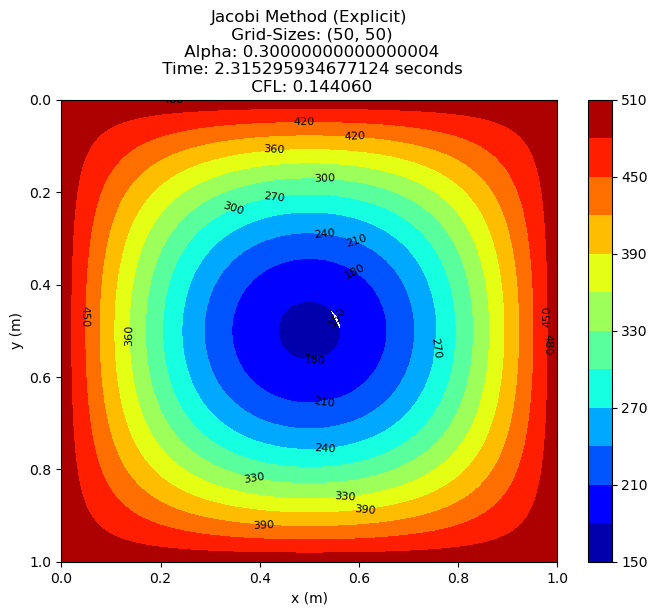

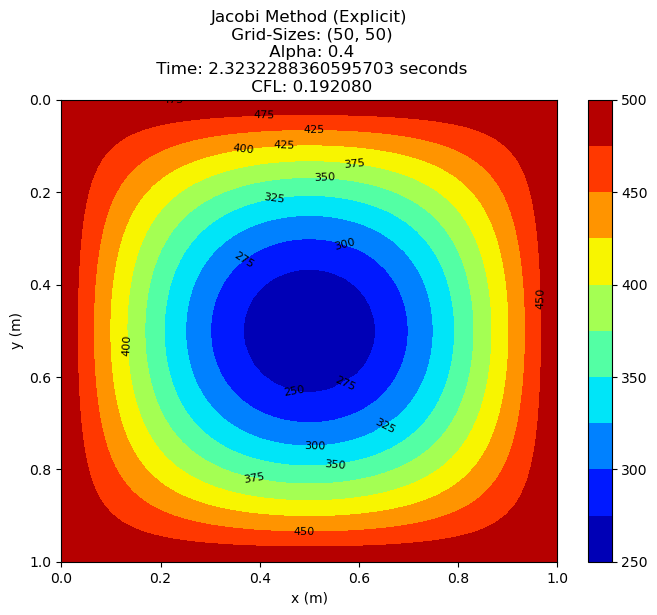

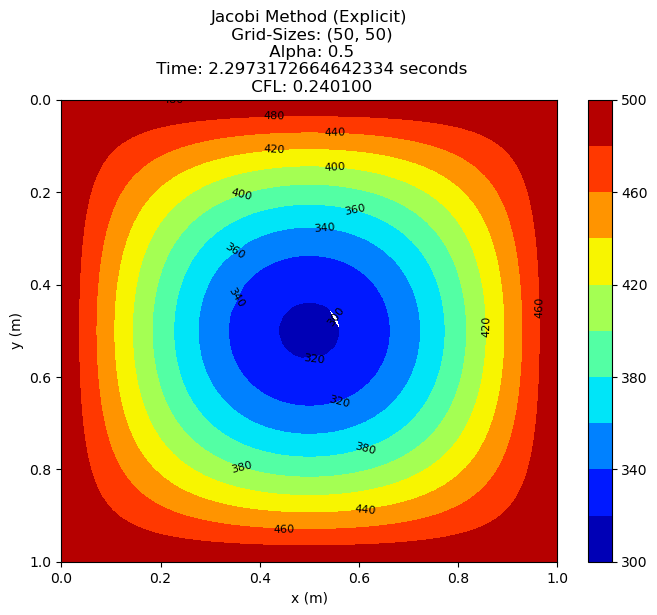

...

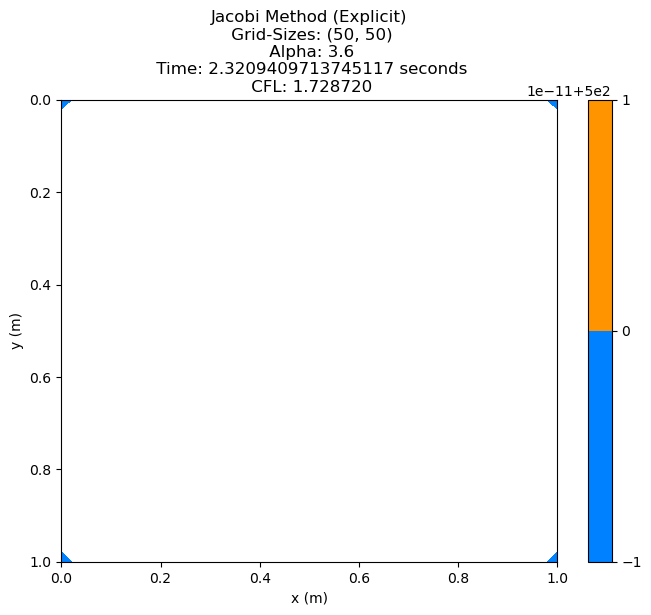

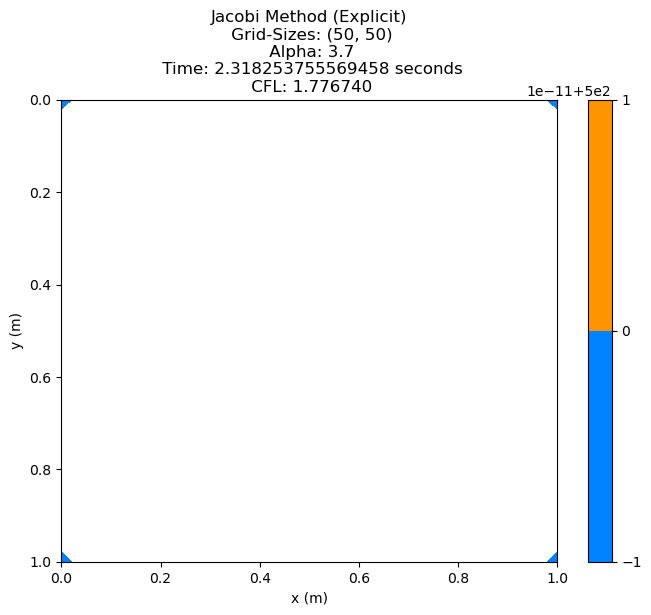

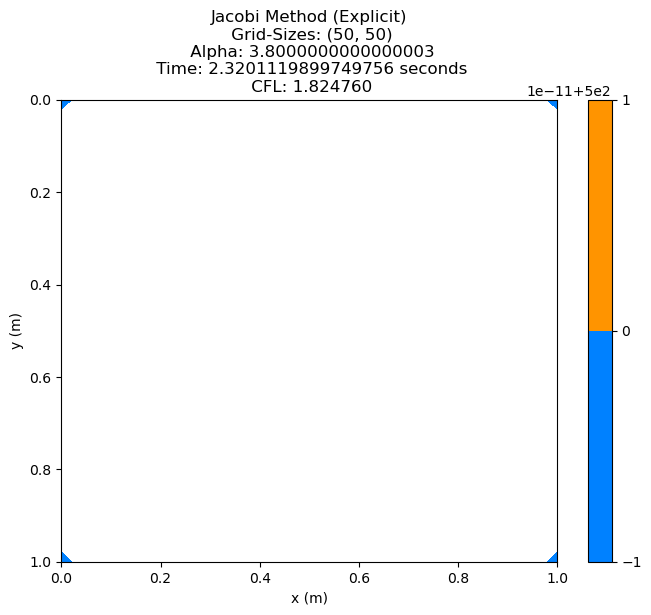

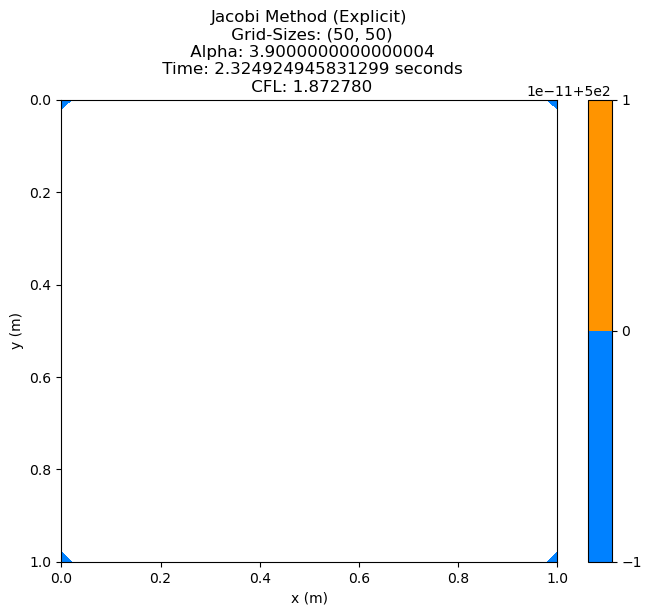

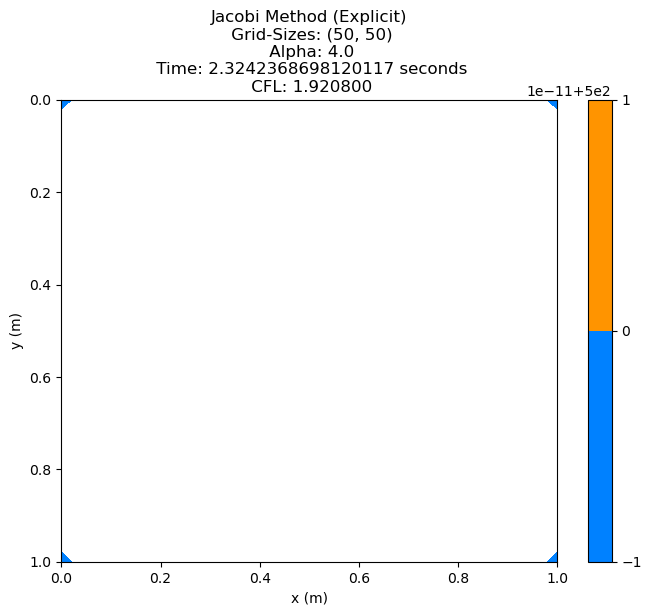

In [32]:
for i in range(len(cfl_alpha_grid_temp_jacobi)):
    display_contour_plot_thermal_stability(num_grid_space_x, num_grid_space_y, (num_grid_pt_x, num_grid_pt_y), cfl_alpha_grid_temp_jacobi[i], "Jacobi Method (Explicit)", cfl_alpha_jacobi_df.iloc[i,0], cfl_alpha_jacobi_df.iloc[i,1], cfl_alpha_jacobi_df.iloc[i,2])

Based on the contour plots for Jacobi method (explicit) from alpha = 0.1 to 1.0, the contour plots appear to be smooth and well-formed with no visible oscillations and no abnormalities on the contour levels. However, with alpha from 1.1 to 1.3, it shows the abnormalities of the contour levels. With alpha of 1.4 onwards, it shows the absence of contour levels and overblown which suggests the numerical divergence and instability which violated the CFL condition.

##### **3.5.2.2 Gauss-Seidel Method**

In [33]:
cfl_alpha_grid_temp_gauss, cfl_alpha_elapsed_time_gauss, cfl_alpha_gauss = [], [], []

# iterate for respective alpha 
for alpha in alphaList:
    # length of the square domain
    length = 1

    # number of grid points in x and y direction
    num_grid_pt_x, num_grid_pt_y = 50, 50

    # number of grid spacing in x and y direction 
    num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
    num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

    # change of length in each grid point in x and y direction 
    dx_new = num_grid_space_x[1] - num_grid_space_x[0]
    dy_new = num_grid_space_y[1] - num_grid_space_y[0]

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = alpha
    dt_exp = 0.0001
    k1_exp = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp = alpha_exp * (dt_exp/ (dy_new)**2)
    cfl_alpha_num_gauss = k1_exp + k2_exp
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the gauss-seidel iterative scheme 
    cfl_alpha_temp_gauss_exp, cfl_alpha_gauss_elapsed_time_exp = jacobi_iter_explicit(top, bottom,left, right, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp)
    
    cfl_alpha_grid_temp_gauss.append(cfl_alpha_temp_gauss_exp)
    cfl_alpha_elapsed_time_gauss.append(cfl_alpha_gauss_elapsed_time_exp)
    cfl_alpha_gauss.append(cfl_alpha_num_gauss)

cfl_alpha_gauss_df = pd.DataFrame({"alpha": alphaList,
                            "elapsed_time": cfl_alpha_elapsed_time_gauss, 
                            "cfl": cfl_alpha_gauss})

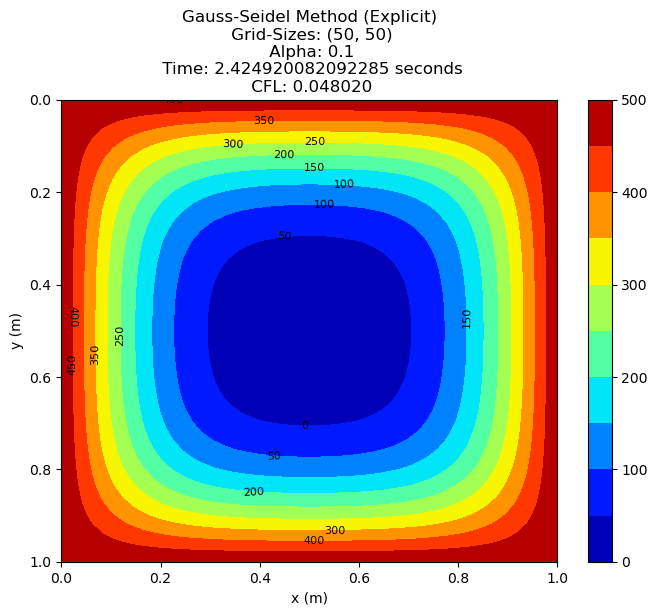

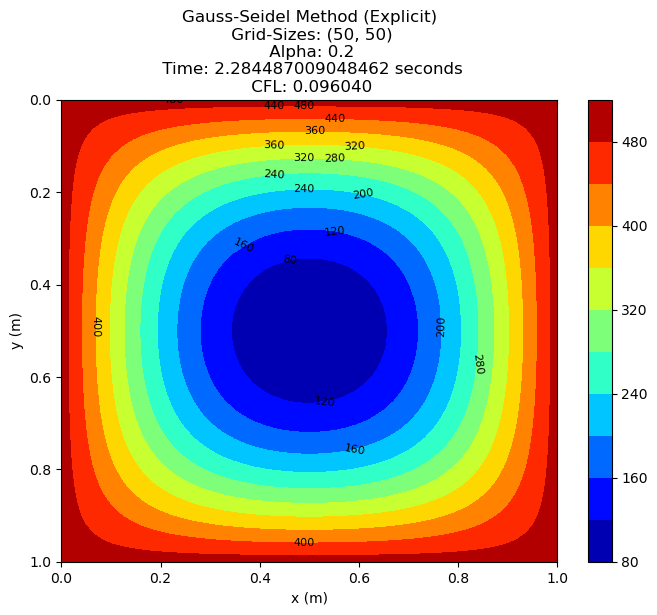

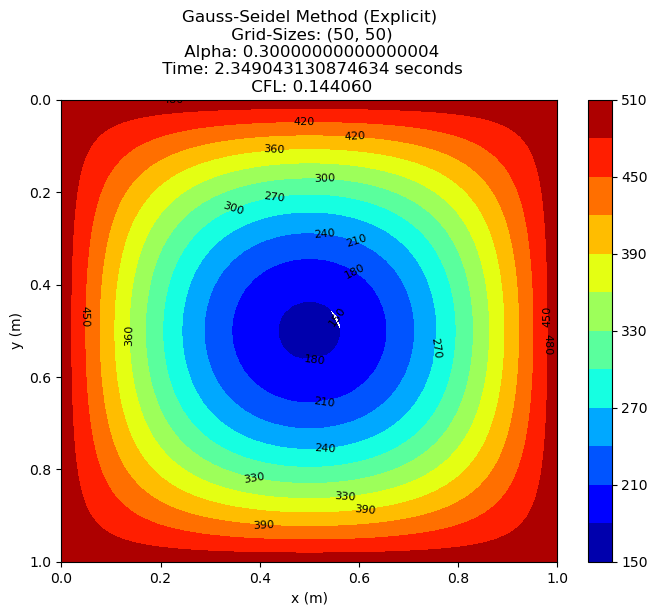

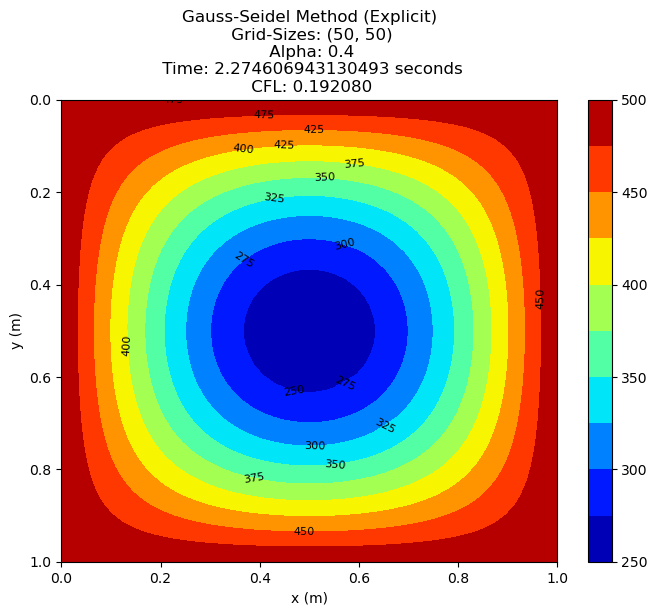

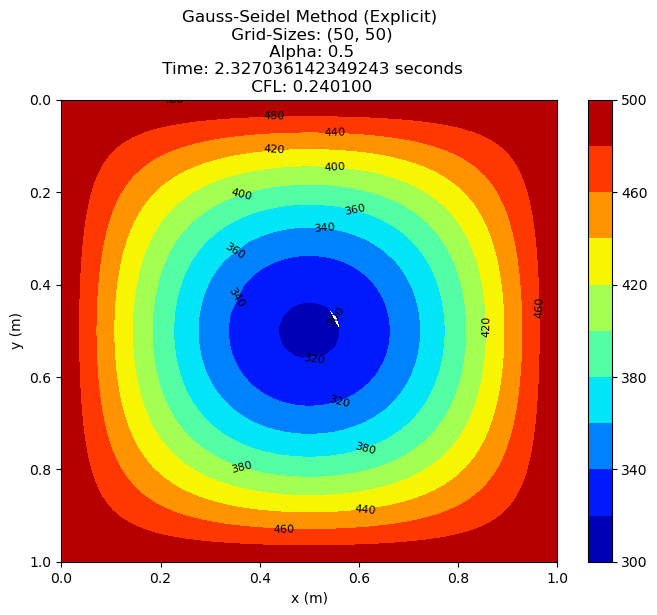

...

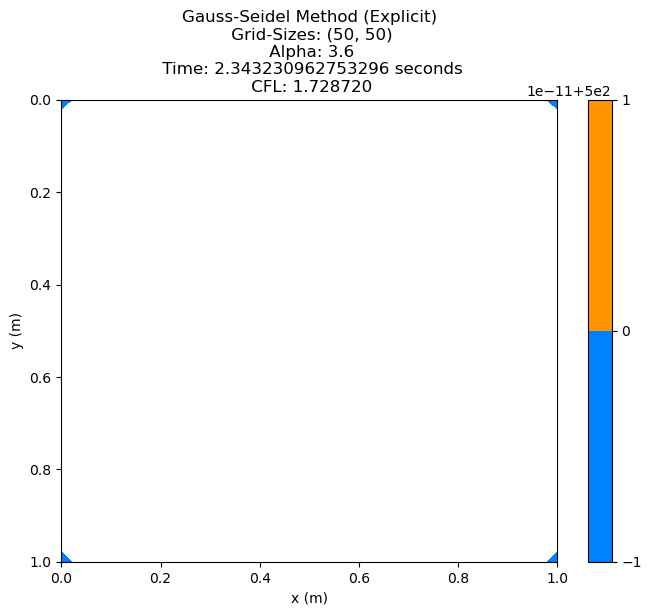

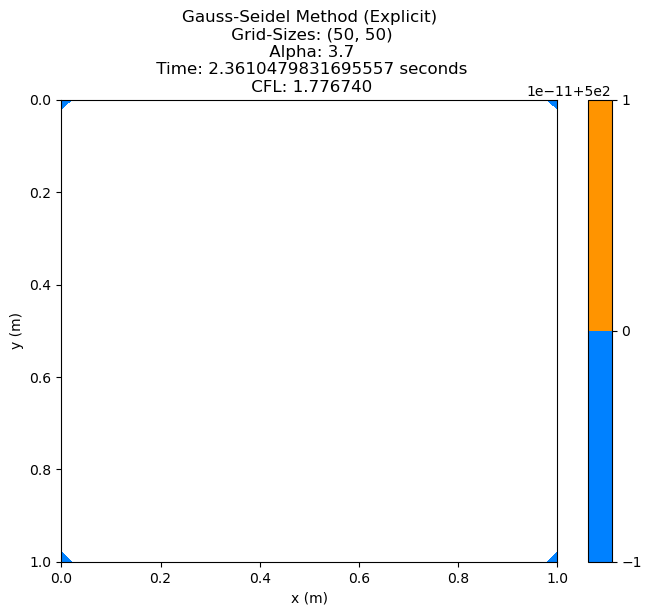

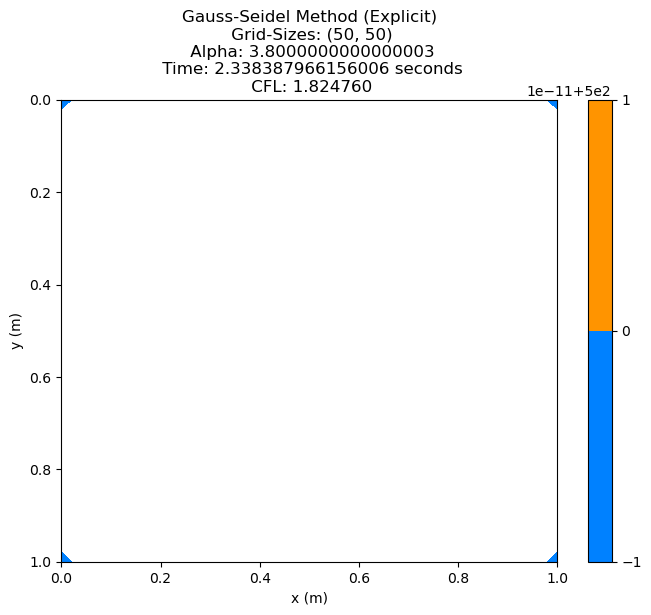

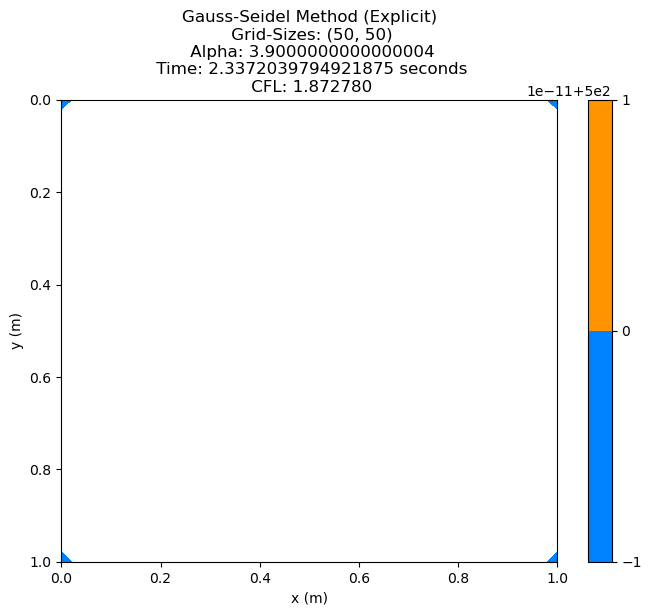

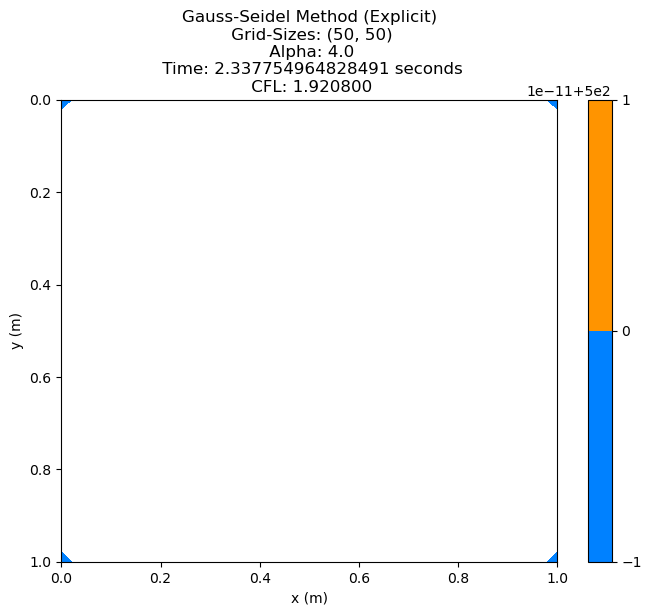

In [34]:
for i in range(len(cfl_alpha_grid_temp_gauss)):
    display_contour_plot_thermal_stability(num_grid_space_x, num_grid_space_y, (num_grid_pt_x, num_grid_pt_y), cfl_alpha_grid_temp_gauss[i], "Gauss-Seidel Method (Explicit)", cfl_alpha_gauss_df.iloc[i,0], cfl_alpha_gauss_df.iloc[i,1], cfl_alpha_gauss_df.iloc[i,2])

Based on the contour plots for the Gauss-seidel method (explicit) with alpha from 0.1 to 0.5, the contour plots appear to be smooth and well-formed with no visible oscillations and no abnormalities on the contour levels. However, with alpha from 0.6 to 1.7, it appears to have some irregularities on the contour levels with no substantial changes of heat diffusion. With alpha from 1.8 to 4.0, it shows the absence of contour levels and overblown, which suggests the numerical divergence and instability which violated the CFL condition.

##### **3.5.2.3 Successive-Over-Relaxation (SOR) Method**

In [35]:
cfl_alpha_grid_temp_sor, cfl_alpha_elapsed_time_sor, cfl_alpha_sor = [], [], []

# iterate for respective alpha 
for alpha in alphaList:
    # length of the square domain
    length = 1

    # number of grid points in x and y direction
    num_grid_pt_x, num_grid_pt_y = 50, 50

    # number of grid spacing in x and y direction 
    num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
    num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

    # change of length in each grid point in x and y direction 
    dx_new = num_grid_space_x[1] - num_grid_space_x[0]
    dy_new = num_grid_space_y[1] - num_grid_space_y[0]

    # omega for SOR
    omega = 1.5 

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = alpha
    dt_exp = 0.0001
    k1_exp = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp = alpha_exp * (dt_exp/ (dy_new)**2)
    cfl_alpha_num_sor = k1_exp + k2_exp
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the SOR iterative scheme 
    cfl_alpha_temp_sor_exp, cfl_alpha_sor_elapsed_time_exp = SOR_iter_explicit(top, bottom,left, right, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp, omega)
    
    cfl_alpha_grid_temp_sor.append(cfl_alpha_temp_sor_exp)
    cfl_alpha_elapsed_time_sor.append(cfl_alpha_sor_elapsed_time_exp)
    cfl_alpha_sor.append(cfl_alpha_num_sor)

cfl_alpha_sor_df = pd.DataFrame({"alpha": alphaList,
                            "elapsed_time": cfl_alpha_elapsed_time_sor, 
                            "cfl": cfl_alpha_sor})


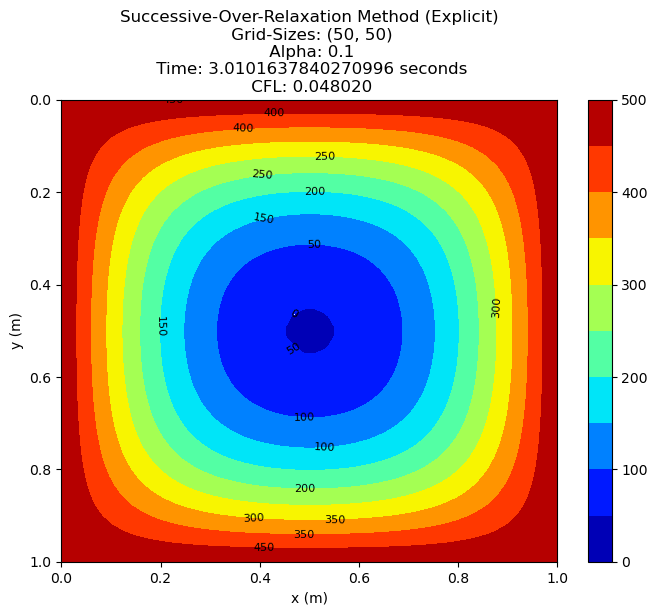

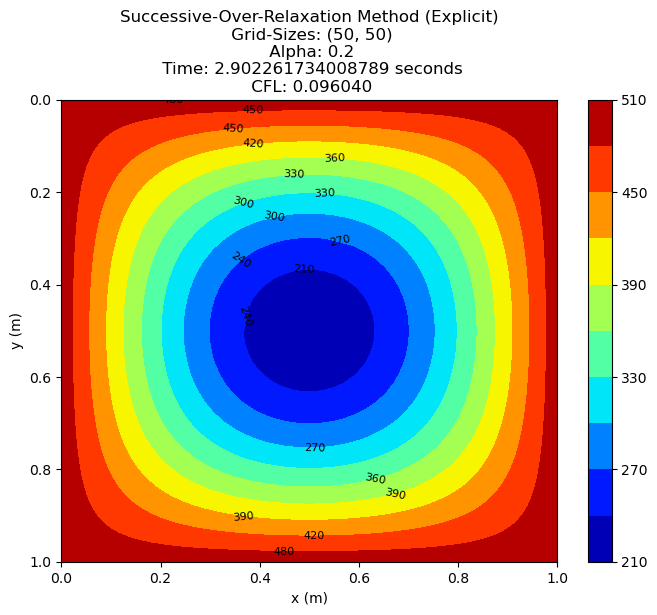

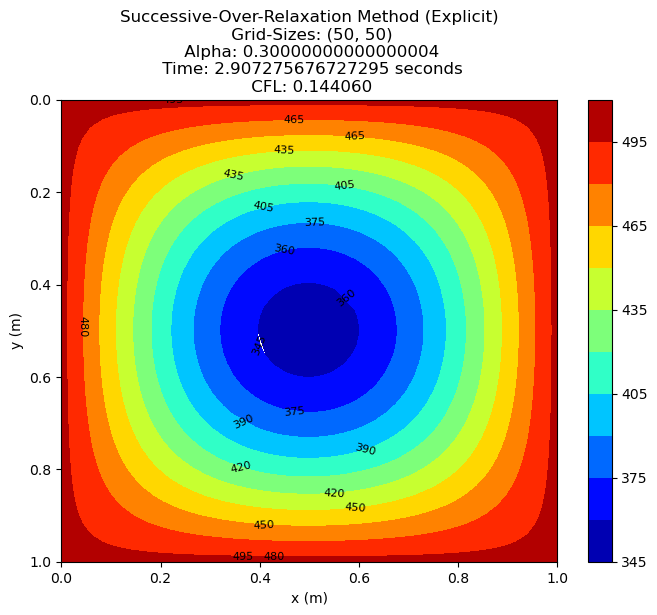

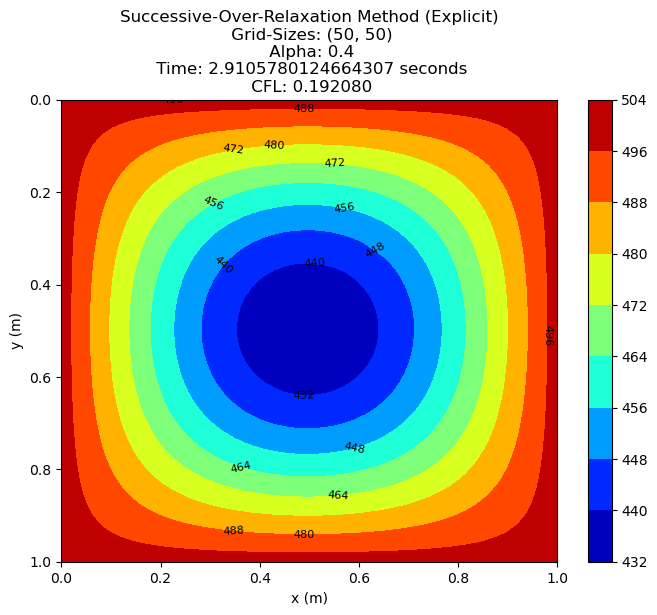

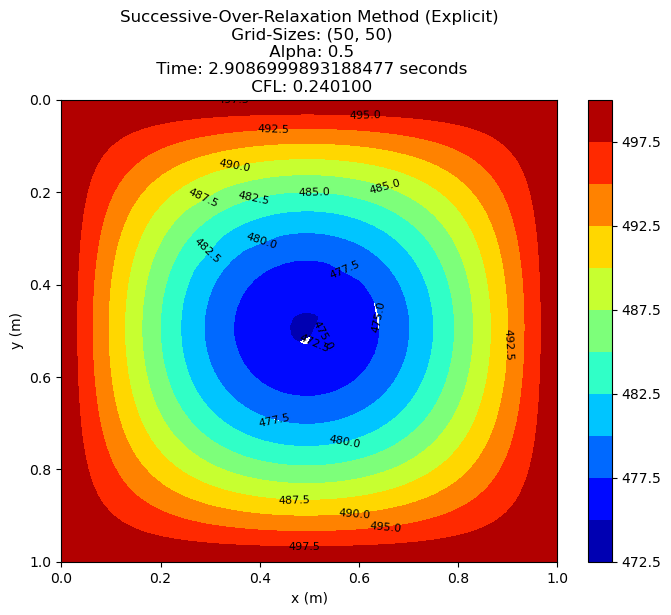

...

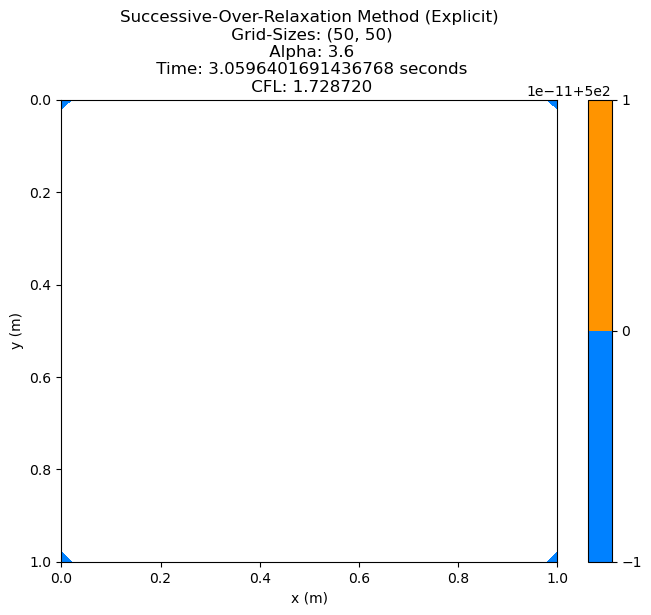

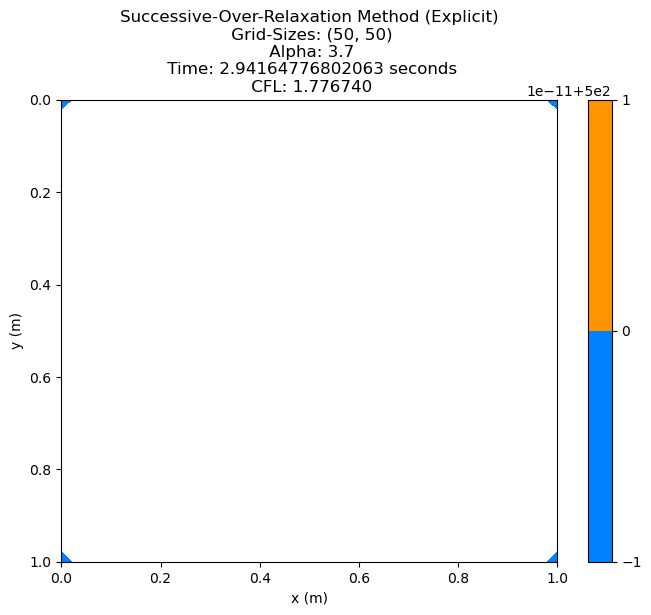

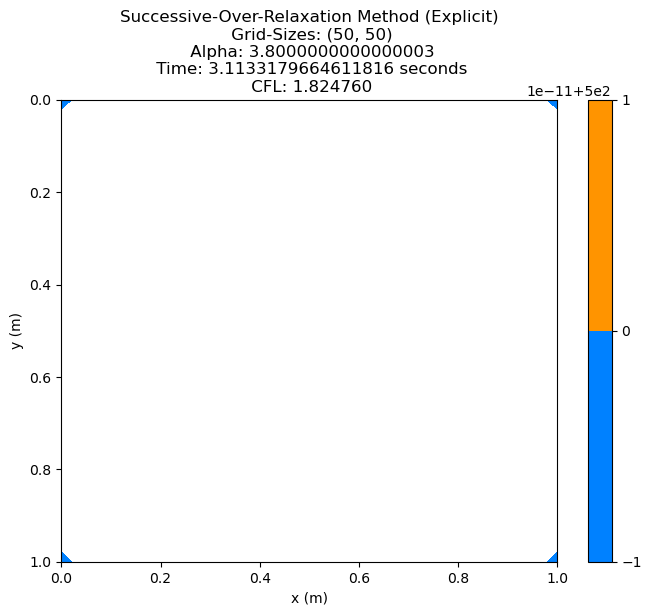

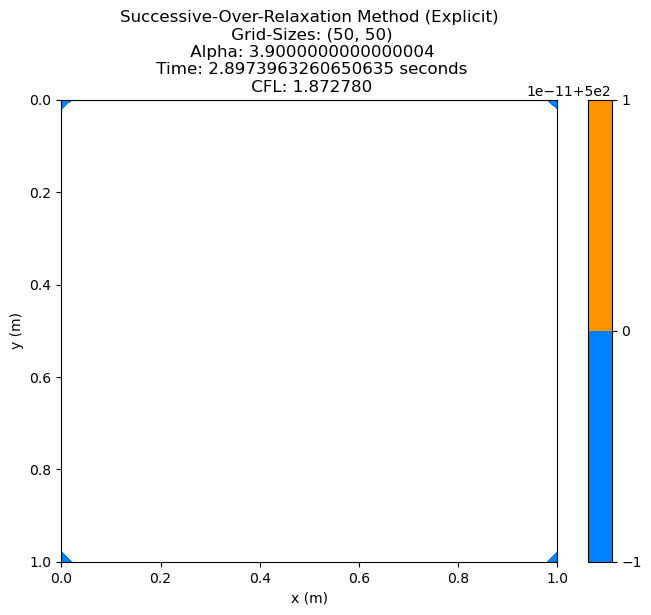

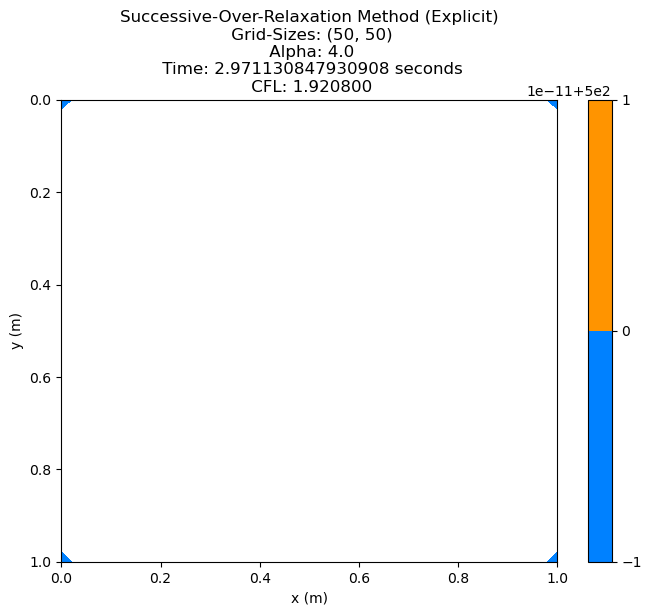

In [36]:
for i in range(len(cfl_alpha_grid_temp_sor)):
    display_contour_plot_thermal_stability(num_grid_space_x, num_grid_space_y, (num_grid_pt_x, num_grid_pt_y), cfl_alpha_grid_temp_sor[i], "Successive-Over-Relaxation Method (Explicit)", cfl_alpha_sor_df.iloc[i,0], cfl_alpha_sor_df.iloc[i,1], cfl_alpha_sor_df.iloc[i,2])

Based on the contour plots for the Successive-Over-Relaxation method (explicit), it shows the optimal alpha for 0.1 and 0.2 with smooth contour plots and is well-formed with no abnormalities on the contour levels. However, with alpha of 3.3 to 1.1, it appears to have some irregularities on the contour levels with no substantial significant changes of heat diffusion. With alpha of 1.2 onwards, it shows the absence of contour levels on the plots which suggests the numerical divergence and instability, which violated the CFL condition. 

---

##### **Impact of Time Steps on the Stability Criterion**

It explores how the changes of time steps such as 1, 0.1, 0.01, 0.001, 0.0001, and 0.00001 affects the overall convergence performance in a 2D system while keeping the rest of the parameters constants.

In [37]:
# initialize a list of time steps values 
timestepsList = [0.000001, 0.0001, 0.001, 0.01, 0.1, 1]

##### **3.5.2.4 Jacobi Method**

In [38]:
cfl_ts_grid_temp_jacobi, cfl_ts_elapsed_time_jacobi, cfl_ts_jacobi = [], [], []

# iterate for respective alpha 
for timeSteps in timestepsList:
    # length of the square domain
    length = 1

    # number of grid points in x and y direction
    num_grid_pt_x, num_grid_pt_y = 50, 50

    # number of grid spacing in x and y direction 
    num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
    num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

    # change of length in each grid point in x and y direction 
    dx_new = num_grid_space_x[1] - num_grid_space_x[0]
    dy_new = num_grid_space_y[1] - num_grid_space_y[0]

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = 0.2
    dt_exp = timeSteps
    k1_exp = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp = alpha_exp * (dt_exp/ (dy_new)**2)
    cfl_ts_num_jacobi = k1_exp + k2_exp
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the jacobi iterative scheme 
    cfl_ts_temp_jacobi_exp, cfl_ts_jacobi_elapsed_time_exp = jacobi_iter_explicit(top, bottom,left, right, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp)
    
    cfl_ts_grid_temp_jacobi.append(cfl_ts_temp_jacobi_exp)
    cfl_ts_elapsed_time_jacobi.append(cfl_ts_jacobi_elapsed_time_exp)
    cfl_ts_jacobi.append(cfl_ts_num_jacobi)

cfl_ts_jacobi_df = pd.DataFrame({"change_time_steps": timestepsList,
                                "elapsed_time": cfl_ts_elapsed_time_jacobi, 
                                "cfl_num": cfl_ts_jacobi})


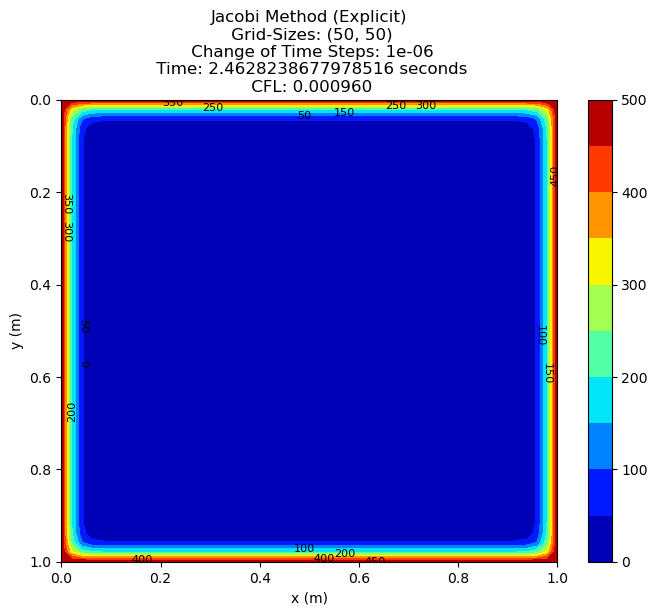

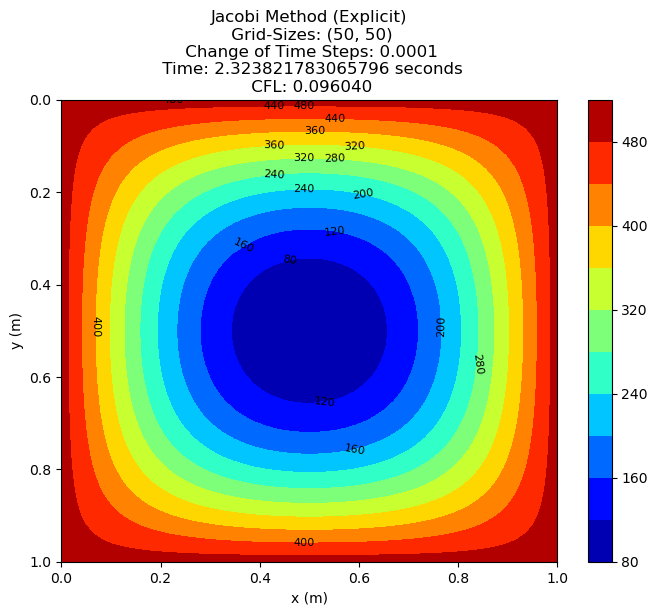

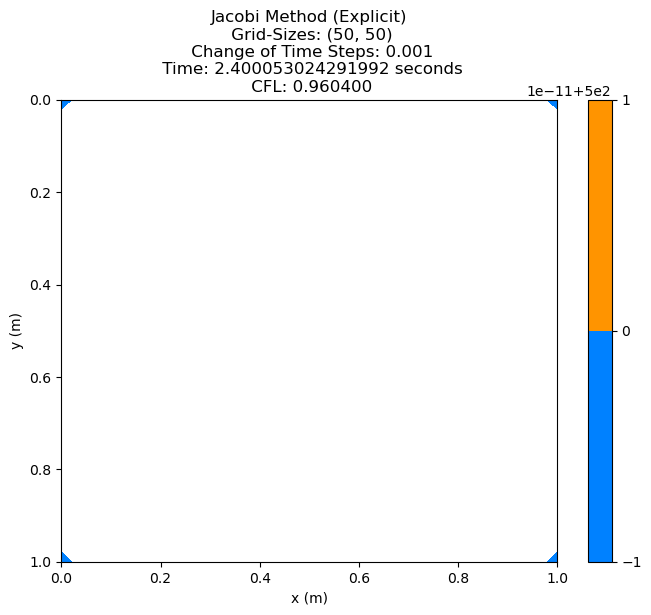

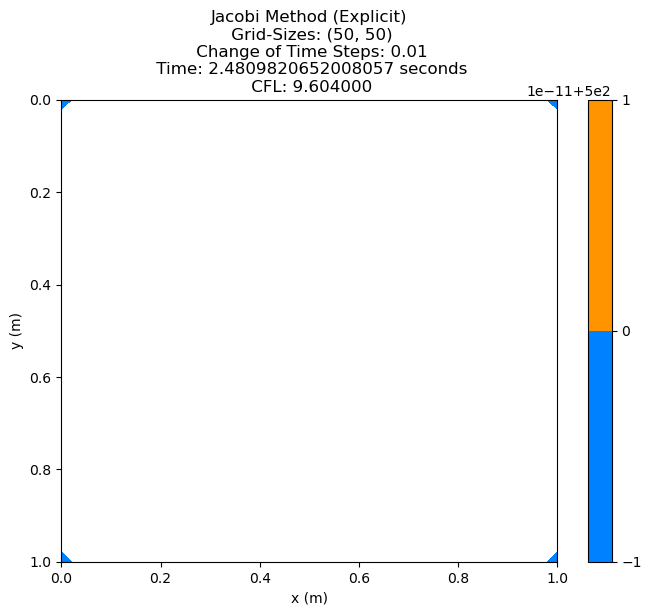

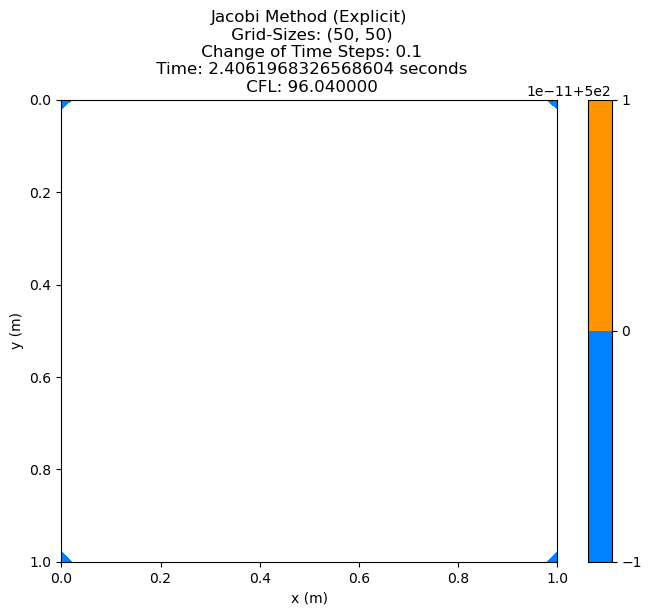

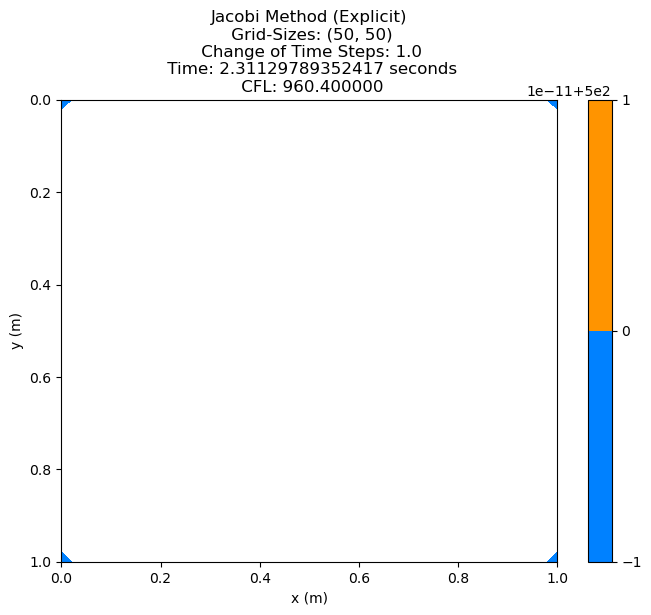

In [39]:
for i in range(len(cfl_ts_grid_temp_jacobi)):
    display_contour_plot_time_steps_stability(num_grid_space_x, num_grid_space_y, (num_grid_pt_x, num_grid_pt_y), cfl_ts_grid_temp_jacobi[i], "Jacobi Method (Explicit)", cfl_ts_jacobi_df.iloc[i,0], cfl_ts_jacobi_df.iloc[i,1], cfl_ts_jacobi_df.iloc[i,2])

Based on the contour plots for the Jacobi method (explicit), the optimal time step is 0.0001, with smooth contour plots and no abnormalities on the contour levels. However, with increasing time steps, that is, above 0.0001, it shows the absence of contour levels on the contour plots, which suggests the numerical divergence and instability, which violated the CFL condition as it exceeded CFL of 0.25.

##### **3.5.2.5 Gauss-Seidel Method**

In [40]:
cfl_ts_grid_temp_gauss, cfl_ts_elapsed_time_gauss, cfl_ts_gauss = [], [], []

# iterate for respective alpha 
for timeSteps in timestepsList:
    # length of the square domain
    length = 1

    # number of grid points in x and y direction
    num_grid_pt_x, num_grid_pt_y = 50, 50

    # number of grid spacing in x and y direction 
    num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
    num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

    # change of length in each grid point in x and y direction 
    dx_new = num_grid_space_x[1] - num_grid_space_x[0]
    dy_new = num_grid_space_y[1] - num_grid_space_y[0]

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = 0.2
    dt_exp = timeSteps
    k1_exp = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp = alpha_exp * (dt_exp/ (dy_new)**2)
    cfl_ts_num_gauss = k1_exp + k2_exp
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the gauss-seidel iterative scheme 
    cfl_ts_temp_gauss_exp, cfl_ts_gauss_elapsed_time_exp = gauss_seidel_iter_explicit(top, bottom,left, right, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp)
    
    cfl_ts_grid_temp_gauss.append(cfl_ts_temp_gauss_exp)
    cfl_ts_elapsed_time_gauss.append(cfl_ts_gauss_elapsed_time_exp)
    cfl_ts_gauss.append(cfl_ts_num_gauss)

cfl_ts_gauss_df = pd.DataFrame({"change_time_steps": timestepsList,
                                "elapsed_time": cfl_ts_elapsed_time_gauss, 
                                "cfl_num": cfl_ts_gauss})


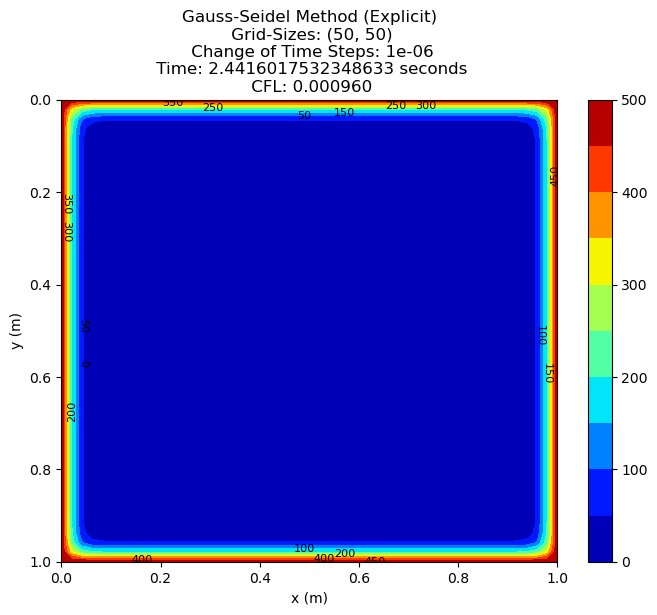

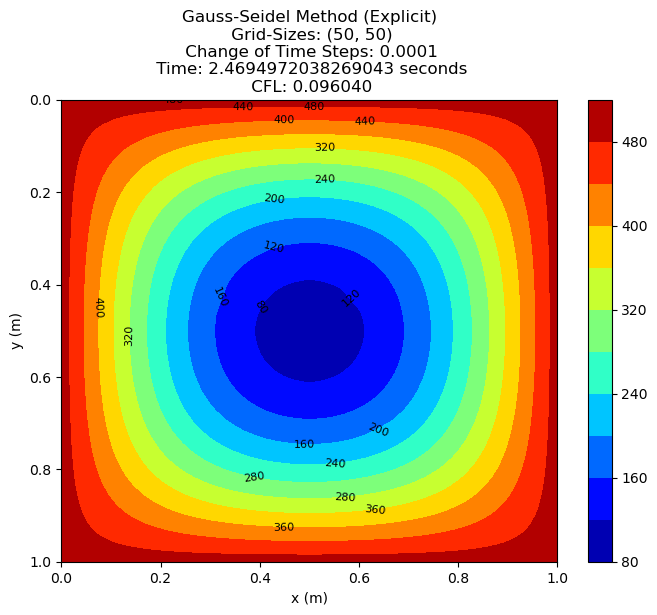

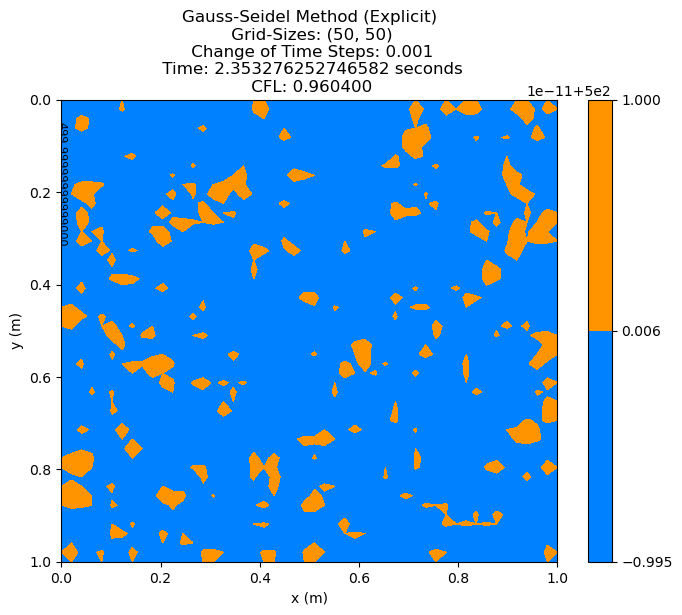

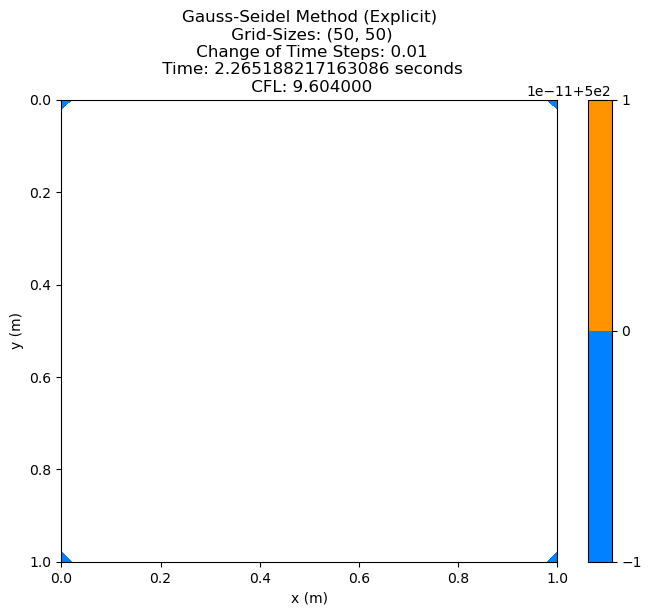

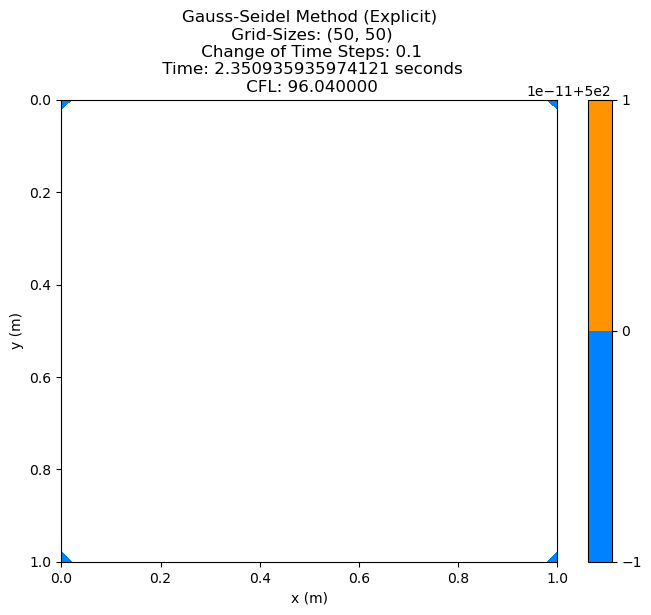

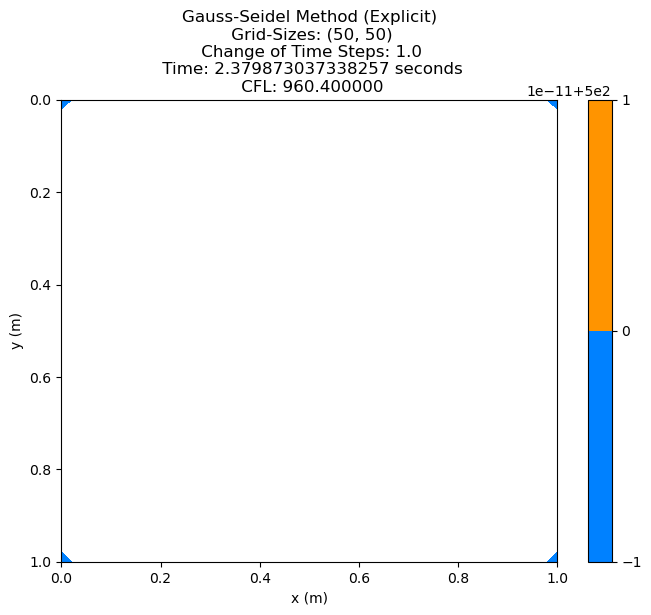

In [41]:
for i in range(len(cfl_ts_grid_temp_gauss)):
    display_contour_plot_time_steps_stability(num_grid_space_x, num_grid_space_y, (num_grid_pt_x, num_grid_pt_y), cfl_ts_grid_temp_gauss[i], "Gauss-Seidel Method (Explicit)", cfl_ts_gauss_df.iloc[i,0], cfl_ts_gauss_df.iloc[i,1], cfl_ts_gauss_df.iloc[i,2])

Based on the contour plots for the Gauss-Seidel method (explicit), the optimal time step is 0.0001, with smooth contour plots and no abnormalities on the contour levels. However, with increasing time steps, that is, above 0.0001, it shows the absence of contour levels on the contour plots, which suggests the numerical divergence and instability, which violated the CFL condition as it exceeded the CFL of 0.25. 

##### **3.5.2.6 Successive-Over-Relaxation (SOR) Method**

In [42]:
cfl_ts_grid_temp_sor, cfl_ts_elapsed_time_sor, cfl_ts_sor = [], [], []

# iterate for respective alpha 
for timeSteps in timestepsList:
    # length of the square domain
    length = 1

    # number of grid points in x and y direction
    num_grid_pt_x, num_grid_pt_y = 50, 50

    # number of grid spacing in x and y direction 
    num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
    num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

    # change of length in each grid point in x and y direction 
    dx_new = num_grid_space_x[1] - num_grid_space_x[0]
    dy_new = num_grid_space_y[1] - num_grid_space_y[0]
    
    # omega for SOR 
    omega = 1.5

    # initialize the boundary temperature 
    top = 500
    bottom = 500
    left = 500
    right = 500

    # for explicit time-dependent 
    alpha_exp = 0.2
    dt_exp = timeSteps
    k1_exp = alpha_exp * (dt_exp/ (dx_new)**2)
    k2_exp = alpha_exp * (dt_exp/ (dy_new)**2)
    cfl_ts_num_sor = k1_exp + k2_exp
    time_step_iter = 1500

    ######### Non-Steady State (Explicit) #########
    # call the function to compute the SOR iterative scheme 
    cfl_ts_temp_sor_exp, cfl_ts_sor_elapsed_time_exp = SOR_iter_explicit(top, bottom,left, right, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp, omega)
    
    cfl_ts_grid_temp_sor.append(cfl_ts_temp_sor_exp)
    cfl_ts_elapsed_time_sor.append(cfl_ts_sor_elapsed_time_exp)
    cfl_ts_sor.append(cfl_ts_num_sor)

cfl_ts_sor_df = pd.DataFrame({"change_time_steps": timestepsList,
                                "elapsed_time": cfl_ts_elapsed_time_sor, 
                                "cfl_num": cfl_ts_sor})


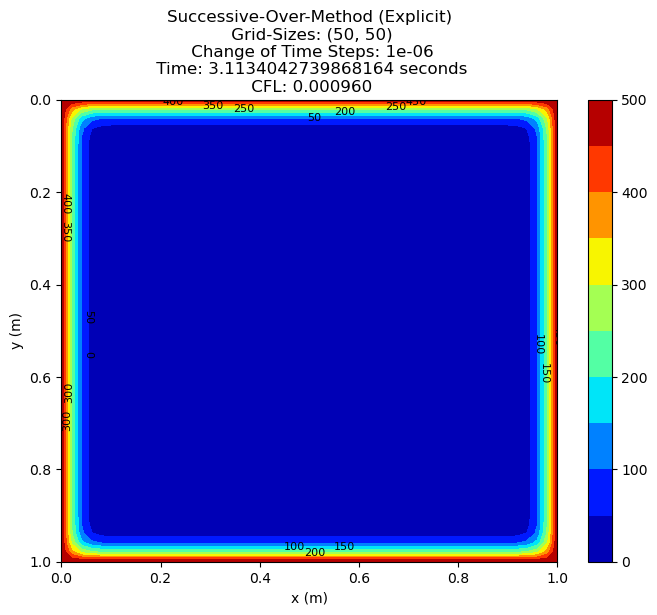

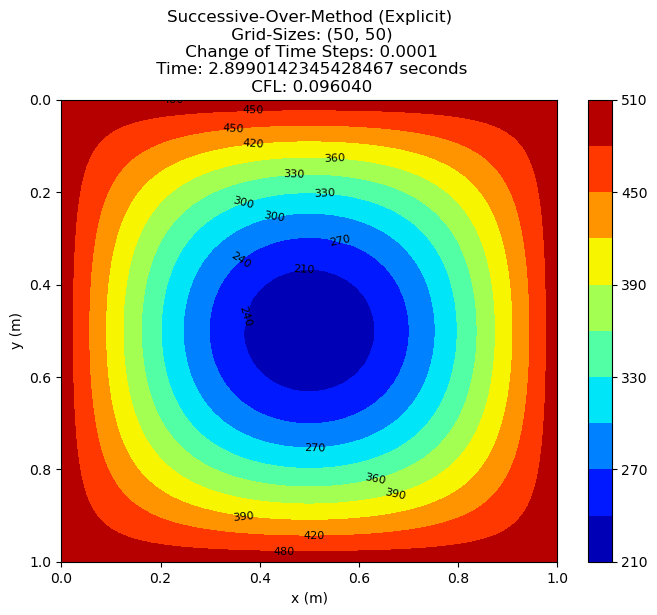

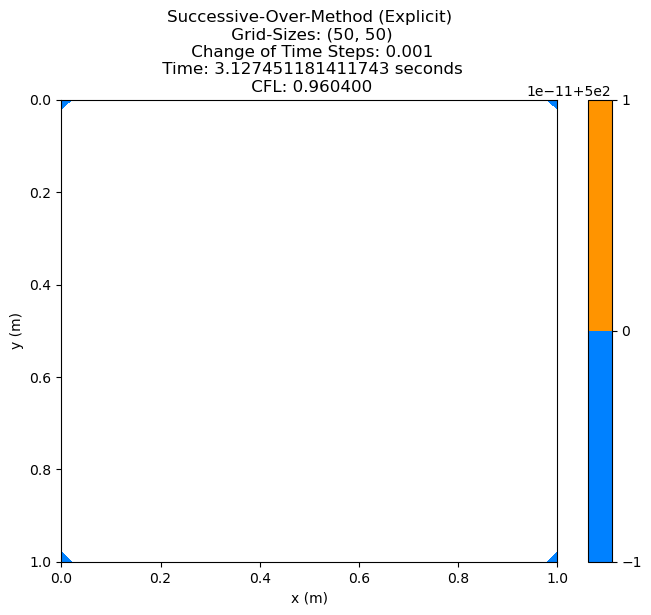

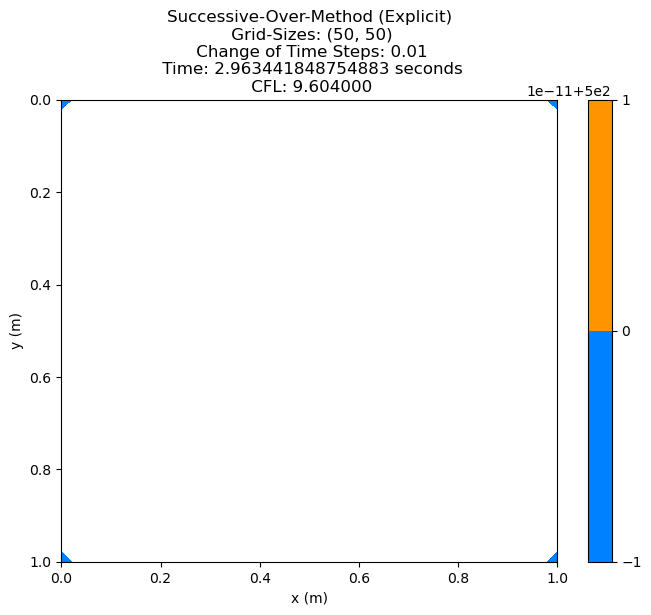

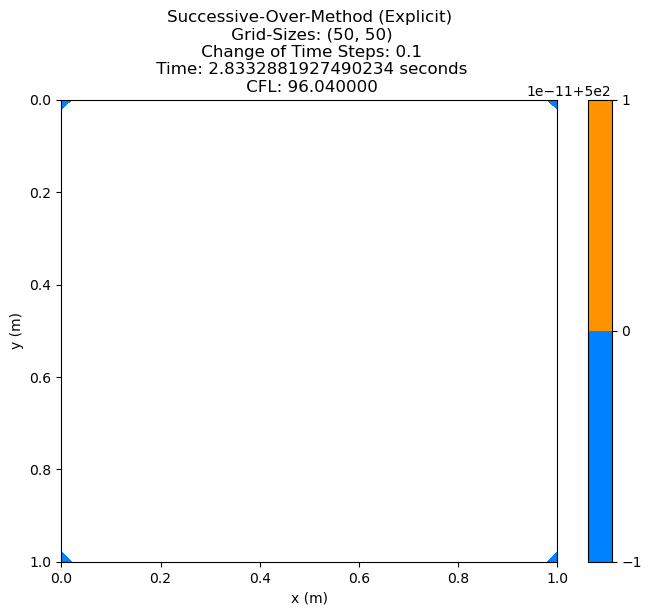

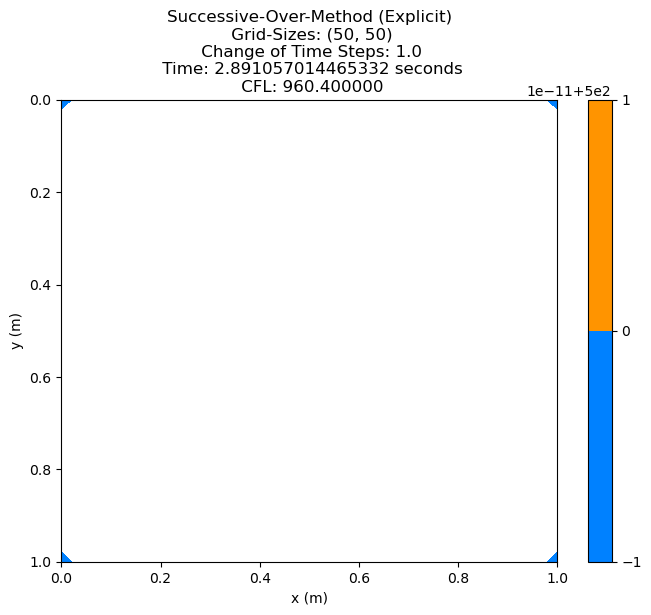

In [43]:
for i in range(len(cfl_ts_grid_temp_sor)):
    display_contour_plot_time_steps_stability(num_grid_space_x, num_grid_space_y, (num_grid_pt_x, num_grid_pt_y), cfl_ts_grid_temp_sor[i], "Successive-Over-Method (Explicit)", cfl_ts_sor_df.iloc[i,0], cfl_ts_sor_df.iloc[i,1], cfl_ts_sor_df.iloc[i,2])

Based on the contour plots for the SOR method (explicit), the optimal time step is 0.0001, with smooth contour plots and no abnormalities on the contour levels. However, with increasing time steps, that is, above 0.0001, it shows the absence of contour levels on the contour plots, which suggests the numerical divergence and instability, which violated the CFL condition as it exceeded CFL of 0.25.

---

## **4. Results and Discussions**

The table below shows the parameters used across the steady-state, explicit, and implicit methods across the iterative solvers to generate the numerical solution: 

| Parameters | Steady-State | Explicit | Implicit |
|:--------:|:--------:|:--------:|:--------:|
| Length (m) | 1  | 1 | 1 |
| No. of Grid Points (x) | 50^ | 50^ | 50^ |
| No. of Grid Points (y) | 50^ | 50^ | 50^ |
| Omega | 1.5 | 1.5 | 1.5 | 
| Top Temp | 500 | 500 | 500 |
| Bottom Temp | 500 | 500 | 500 |
| Left Temp | 500 | 500 | 500 |
| Right Temp | 500 | 500 | 500 |
| Time Step Iteration | - | 1500 | 1500 |
| Time Step | - | 0.0001^ | 0.001 |
| Thermal Diffusivity (alpha) | - | 0.2^ | 20 |
| Error | inf | inf | inf |
| Tolerance | 1e-6 | 1e-6 | 1e-6 |


The optimal values represented as ^ are based on the grid refinement analysis and stability analysis in section 3.5 - Testing for Correctness. 

In [44]:
### setting the common parameters 

# length of the square domain
length = 1

# number of grid points in x and y direction
num_grid_pt_x, num_grid_pt_y = 50, 50

# number of grid spacing in x and y direction 
num_grid_space_x = np.linspace(0, length, num_grid_pt_x)
num_grid_space_y = np.linspace(0, length, num_grid_pt_y)

# change of length in each grid point in x and y direction 
dx = num_grid_space_x[1] - num_grid_space_x[0]
dy = num_grid_space_y[1] - num_grid_space_y[0]

# omega for SOR 
omega = 1.5

# initialize the error and tolerance 
error = float('inf')
tol = 1e-6

# initialize the boundary temperature 
top_temp = 500
bottom_temp = 500
left_temp = 500
right_temp = 500

# initialize the time step for explicit and implicit
time_step_iter = 1500

In [45]:
# define function for displaying contour plot 
def display_contour_plot(x, y, grid_temp, title, iter_counter, elapsed_time):
    plt.figure(figsize=(8, 6))
    contours = plt.contourf(x, y, grid_temp.T, 10, cmap='jet')
    plt.clabel(contours, inline = True, fontsize = 8, colors = 'black')
    plt.colorbar()
    plt.title("{}\n Iteration: {}\n Time: {} seconds".format(title, iter_counter, elapsed_time))
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.gca().invert_yaxis()
    plt.show()

### **4.1 Steady-State Heat Diffusion in a 2D system**

In [46]:
# constant for steady-state
k = 2 * ((dx**2 + dy**2)/ (dx**2 * dy**2))

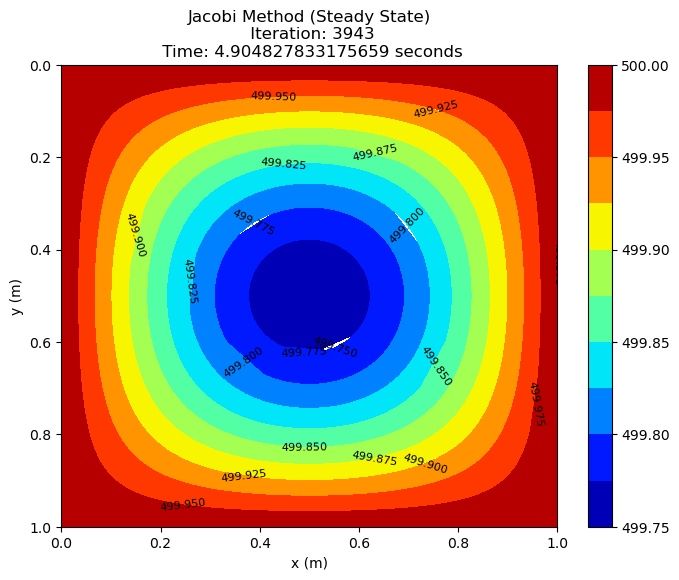

In [47]:
# call the function to compute the jacobi iterative scheme for steady state heat diffusion 
temp_jacobi, jacobi_iter, jacobi_elapsed_time, jacobi_error = jacobi_iter_steady_state(top_temp, bottom_temp, left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, dx, dy, k, error, tol)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_jacobi, "Jacobi Method (Steady State)", jacobi_iter, jacobi_elapsed_time)

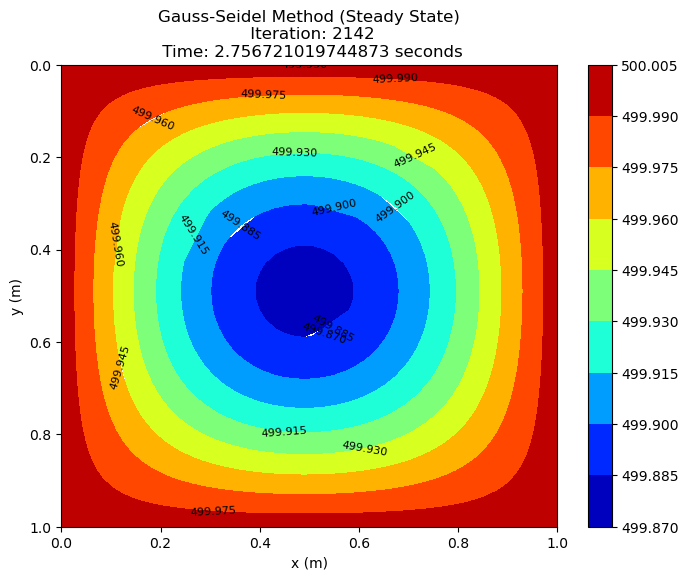

In [48]:
# call the function to compute the gauss-seidel iterative scheme for steady state heat diffusion 
temp_gauss, gauss_iter, gauss_elapsed_time, gauss_error = gauss_seidel_iter_steady_state(top_temp, bottom_temp, left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, dx, dy, k, error, tol)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_gauss, "Gauss-Seidel Method (Steady State)", gauss_iter, gauss_elapsed_time)

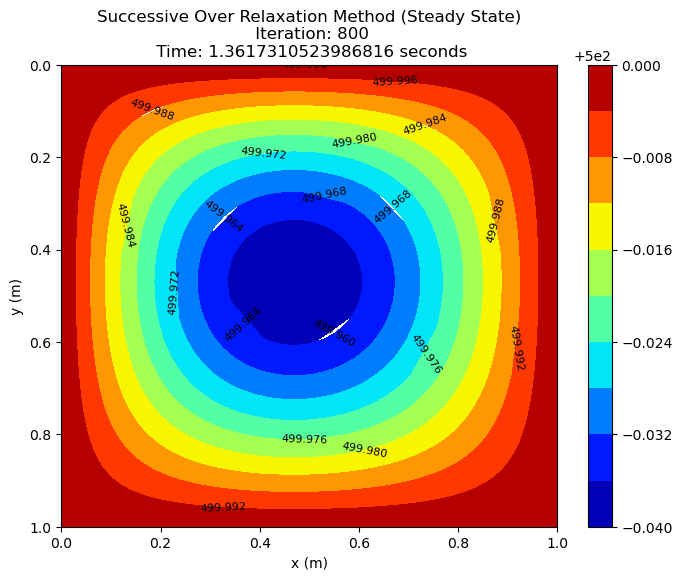

In [49]:
# call the function to compute the SOR iterative scheme for steady state heat diffusion 
temp_sor, sor_iter, sor_elapsed_time, sor_error = sor_iter_steady_state(top_temp, bottom_temp, left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, dx, dy, k, error, tol, omega)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_sor, "Successive Over Relaxation Method (Steady State)", sor_iter, sor_elapsed_time)

##### **4.1.2 Discussion** 

Based on the contour plots shown above, 
- The Jacobi method requires about 3943 iterations and takes about 5.048 seconds to converge to a numerical solution. It is one of the slowest among the three methods as it is based on the previous iteration information to perform immediate updates.
- The Gauss method requires 2142 iterations and takes about 2.7 seconds to converge to a numerical solution. It is much faster than the Jacobi method as it does not rely entirely on the previous iteration information to perform immediate updates. 
- The SOR method requires 800 iterations and takes about 1.365 seconds to converge to a numerical solution. It is one of the fastest among the three methods. This could be due to the inclusion of the relaxation factor that adjusts the computation dynamically which minimizes the iteration substantially. 
- All in all, the contour plots do not show any irregularities in terms of the contour levels, and the temperature shown does not change with time.

### **4.2 Non-Steady-State Heat Diffusion in a 2D system (Explicit)**

In [50]:
# for explicit time-dependent 
alpha_exp = 0.2 # based on the stability analysis 
dt_exp = 0.0001
k1_exp = alpha_exp * (dt_exp/ (dx)**2)
k2_exp = alpha_exp * (dt_exp/ (dy)**2)

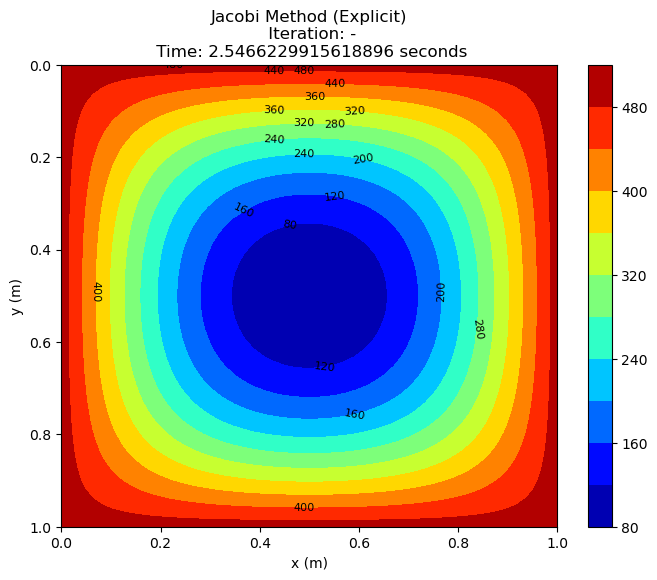

In [51]:
# call the function to compute the jacobi iterative scheme for explicit time-dependent heat diffusion
temp_jacobi_exp, jacobi_exp_elapsed_time = jacobi_iter_explicit(top_temp, bottom_temp,left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp)
display_contour_plot(num_grid_space_x, num_grid_space_y,  temp_jacobi_exp, "Jacobi Method (Explicit)", "-", jacobi_exp_elapsed_time)

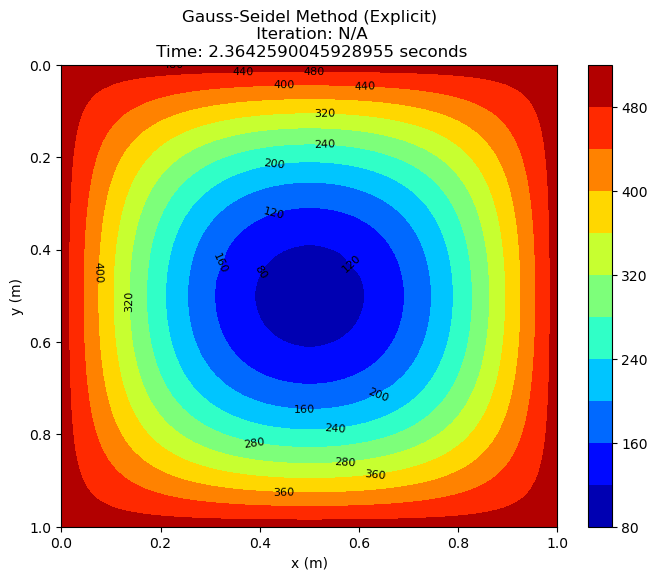

In [52]:
# call the function to compute the gauss-seidel iterative scheme for explicit time-dependent heat diffusion
temp_gauss_exp, gauss_exp_elapsed_time = gauss_seidel_iter_explicit(top_temp, bottom_temp,left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_gauss_exp, "Gauss-Seidel Method (Explicit)", 'N/A', gauss_exp_elapsed_time)

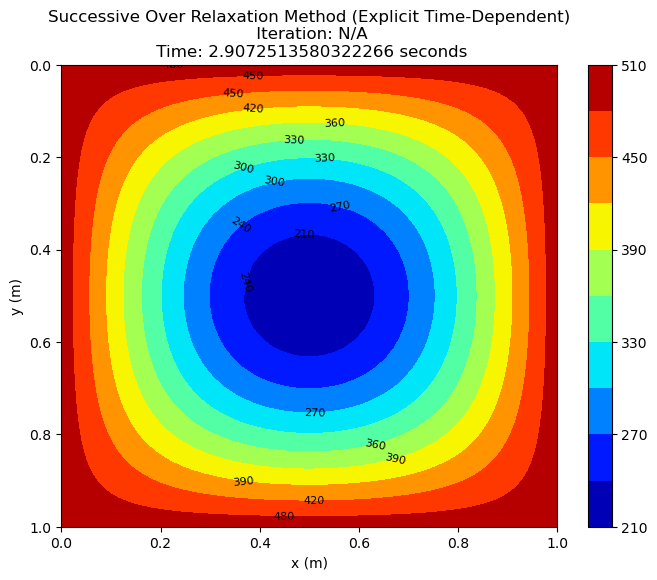

In [53]:
# call the function to compute the SOR iterative scheme for explicit time-dependent heat diffusion
temp_sor_exp, sor_exp_elapsed_time = SOR_iter_explicit(top_temp, bottom_temp,left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_exp, k2_exp, omega)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_sor_exp, "Successive Over Relaxation Method (Explicit Time-Dependent)", 'N/A', sor_exp_elapsed_time)

##### **4.2.1 Discussion**

Based on the contour plots shown above, 
- The Jacobi method takes about 2.530 seconds to converge to a numerical solution. It is slightly slower than the Gauss method as it updates all the grid temperature concurrently per iteration. 
- The Gauss method takes about 2.443 to converge to a numerical solution. It is one of the fastest among the three methods as it does not update all grid temperatures concurrently per iteration as the Jacobi method does.  
- The SOR method takes about 3.028 seconds to converge to a numerical solution. It is one of the slowest among the three methods. This could be due to the inclusion of the relaxation factor that adjusts the computation dynamically, which may be over-relaxation that results in poor computation performance. 
- Unlike the steady-state method, the iterative refinement is excluded as the latest time steps are dependent on the preceding time steps.
- All in all, the contour plots do not show any irregularities in terms of the contour levels, and the temperature shown changes with time.

### **4.3 Non-Steady-State Heat Diffusion in a 2D system (Implicit)**

In [54]:
# for implicit time-dependent 
alpha_imp = 20
dt_imp = 0.001
k1_imp = alpha_imp * (dt_imp/ (dx)**2)
k2_imp  = alpha_imp * (dt_imp/ (dy)**2)

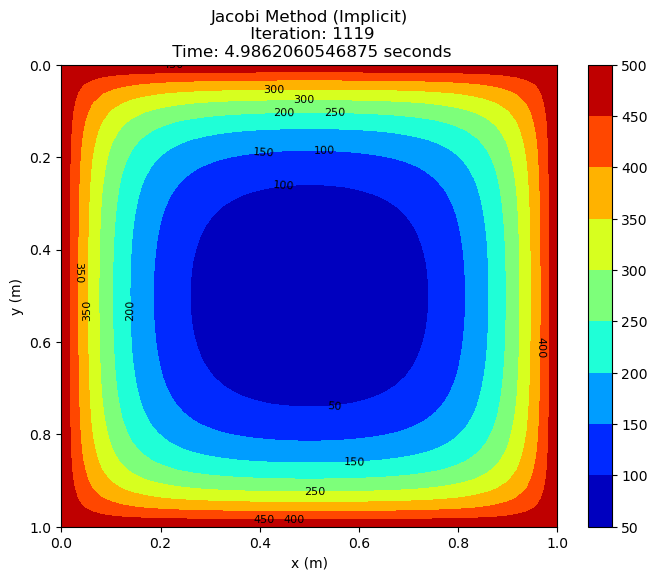

In [55]:
# call the function to compute the jacobi iterative scheme for implicit time-dependent heat diffusion
temp_jacobi_imp, jacobi_imp_num_iter, jacobi_imp_elapsed_time, jacobi_imp_error = jacobi_iter_implicit(top_temp, bottom_temp,left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_imp, k2_imp, error, tol)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_jacobi_imp, "Jacobi Method (Implicit)", jacobi_imp_num_iter, jacobi_imp_elapsed_time)

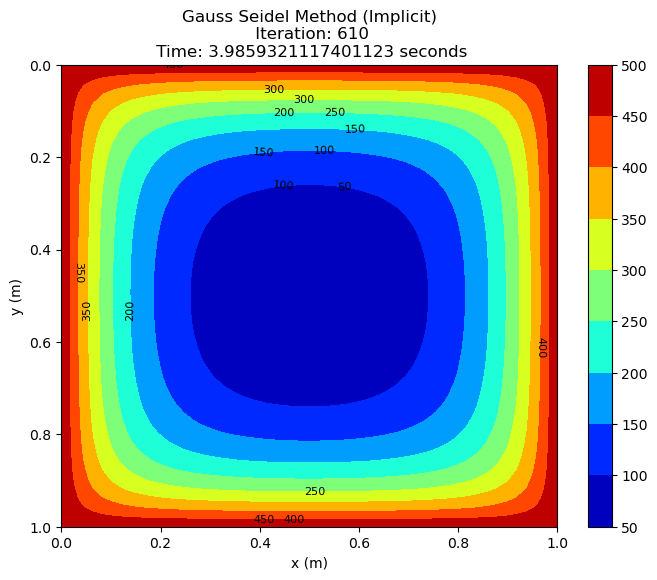

In [56]:
# call the function to compute the gauss-seidel iterative scheme for implicit time-dependent heat diffusion
temp_gauss_imp, gauss_imp_num_iter, gauss_imp_elapsed_time, gauss_imp_error = gauss_seidel_iter_implicit(top_temp, bottom_temp,left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_imp, k2_imp, error, tol)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_gauss_imp, "Gauss Seidel Method (Implicit)", gauss_imp_num_iter, gauss_imp_elapsed_time)

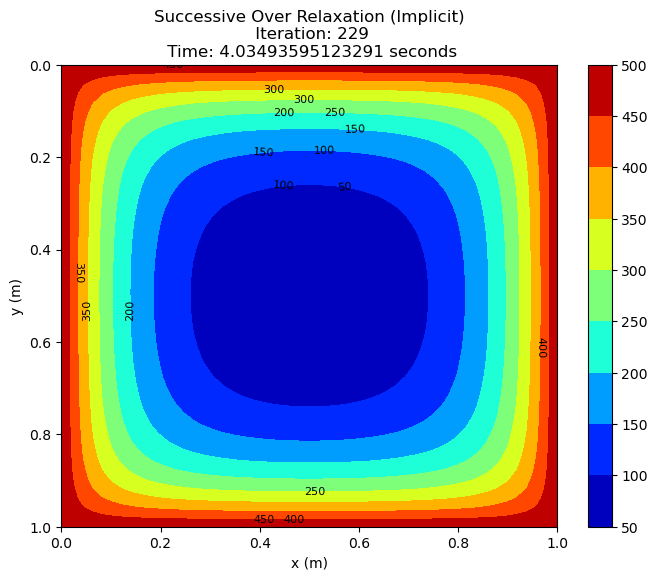

In [57]:
# call the function to compute the SOR iterative scheme for implicit time-dependent heat diffusion
temp_sor_imp, sor_imp_num_iter, sor_imp_elapsed_time, sor_imp_error = SOR_iter_implicit(top_temp, bottom_temp,left_temp, right_temp, num_grid_pt_x, num_grid_pt_y, time_step_iter, k1_imp, k2_imp, error, tol, omega)
display_contour_plot(num_grid_space_x, num_grid_space_y, temp_sor_imp, "Successive Over Relaxation (Implicit)", sor_imp_num_iter, sor_imp_elapsed_time)

##### **4.3.2 Discussion**

Based on the contour plots shown above, 
- The Jacobi method requires about 1119 iterations and takes about 5.000 seconds to converge to a numerical solution. It is one of the slowest among the three methods as it computes the current grid temperature values based on preceding iteration grid temperature values and uniquely stores them. 
- The Gauss method requires 610 iterations and takes about 3.816 seconds to converge to a numerical solution. It is much faster than the Jacobi method as it uses in-place updates and uses immediately for the subsequent computation. 
- The SOR method requires 229 iterations and takes about 3.917 seconds to converge to a numerical solution. It is slightly slower than the Gauss method but it is one of the lowest iterative counts among the three methods. This could be due to the inclusion of the relaxation factor that adjusts the computation dynamically which minimizes the iteration substantially. 
- All in all, the contour plots do not show any irregularities in terms of the contour levels, and the temperature shown change with time.

---

## **5. Reflections on Calculations and Computational Methods**

I have gained a better understanding of how partial differential equations can be used to solve heat equations using the central finite difference. To solve such complex heat systems of equations, I explored the use of the iterative solvers such as Jacobi, Gauss-Seidel, and Successive-Over-Relaxation methods to solve the central finite difference for 2D heat equations. This is because the Jacobi method is a straightforward and parallelized algorithm that is solely dependent on the preceding iterative's values to make the approximation of the new grid temperature. On the other hand, the Gauss-Seidel method provides a much faster convergence speed as compared to the Jacobi method as it uses the most recent computed grid temperature values of the unknown in each iteration to update the other unknowns of the grid temperature. Finally, the SOR is an enhanced version of the Gauss-Seidel method as it integrates the uses of the relaxation factor to improve the convergence speed substantially. However, if choosing the optimal relaxation factor requires experimentation (i.e. trial and error) and uses the inappropriate factor, it might hinder the convergence performance.

Furthermore, I have also appreciated the use of the numerical method schemes to solve the different types of 2D heat equations, particularly the explicit method. This is because it requires some strict adherence to the stability constraint to ensure the optimal convergence performance and it is rare to use iterative solvers to solve the explicit method due to its instability performance. The hands-on approach has given me a better understanding of how it could be related to other science and engineering applications, not just heat diffusion, and also the trade-offs between the accuracy, stability, and computational performance for the different 2D heat diffusion across the iterative solvers techniques.

---

# **6. Conclusion**


In conclusion, the numerical methods applied to the 2D heat diffusion in square domain have proven effective and the SOR method is the best method for steady-state, implicit, and explicit methods. However, there are several opportunities worth for improvement in future. It would be considerable to investigate more advanced sophiscated iterative methods that could further optimized convergence performance and also explore the impact of the heat changes on different domains such as rectangle, circular, and even irregular shapes. It is also appropriate to further enhance the stability analysis with integration of different boundary temperature conditions and materials properties, particularly for explicit and implicit methods. In a nutshell, the current project has proven to be reliable analysis for 2D heat diffusion methods. 

---

## **7. References**

1) M Necati Özışık, Helcio R B Orlande, Marcelo Jose Colaco, & Renato Machado Cotta. (2017). Finite difference methods in heat transfer. Crc Press, Taylor & Francis Group.

2) https://en.wikipedia.org/wiki/Heat_equation

3) https://en.wikipedia.org/wiki/Finite_difference_method

4) https://en.wikipedia.org/wiki/Explicit_and_implicit_methods

5) https://en.wikipedia.org/wiki/Jacobi_method

6) https://en.wikipedia.org/wiki/Gauss%E2%80%93Seidel_method#:~:text=In%20numerical%20linear%20algebra%2C%20the,a%20system%20of%20linear%20equations.

7) https://en.wikipedia.org/wiki/Successive_over-relaxation

8) https://en.wikipedia.org/wiki/Dirichlet_boundary_condition

9) https://en.wikipedia.org/wiki/Courant%E2%80%93Friedrichs%E2%80%93Lewy_condition





‌